In [1]:
library(qiime2R)
library(tidyr)
library(tibble)
library(ggplot2)
library(microbiome)
library(phyloseq)
library(dplyr)
library(Maaslin2)

Loading required package: phyloseq


microbiome R package (microbiome.github.com)
    


 Copyright (C) 2011-2020 Leo Lahti, 
    Sudarshan Shetty et al. <microbiome.github.io>



Attaching package: ‘microbiome’


The following object is masked from ‘package:ggplot2’:

    alpha


The following object is masked from ‘package:base’:

    transform



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [2]:
# Read in the 16S qza files and clean them up for phyloseq
table_pi <- read_qza("/Users/stephanie.rosales/Documents/Tissueloss/SCTLD_MetaAnalysis/out_picrust/pi_metacycl_meta.qza")
table_pi <- table_pi$data # Extract the count data from list



In [3]:
table_pi

,102tiss_S3,220tiss_S33,222tiss_S34,225tis_S40,232tiss_S41,262tiss_S35,75Ltiss_S37,80Ltiss_S4,81tiss_S27,82Ltiss_S38,⋯,W4Aug23,W4Aug28,W4Oct2,W4Sep9,W62Aug23,W62Aug26,W7Aug23,W7Aug28,W7Sep15,W7Sep9
1CMET2-PWY,107623.20878,60141.4354,65005.27692,31182.13108,57080.9722,49934.57816,59457.3078,72883.4034,55342.08962,87584.12651,⋯,29907.67362,50742.45454,66157.03340,39310.89408,90887.26319,33765.68730,23776.274563,63659.2736,31084.568411,43028.43427
3-HYDROXYPHENYLACETATE-DEGRADATION-PWY,353.29917,458.6885,90.87282,15.77887,1438.3720,60.49677,910.3331,980.0849,773.17548,287.80590,⋯,0.00000,174.31225,36.36373,378.87920,0.00000,40.26445,27.373508,0.0000,1005.050643,122.47331
AEROBACTINSYN-PWY,0.00000,0.0000,0.00000,0.00000,21.1745,0.00000,0.0000,0.0000,0.00000,0.00000,⋯,0.00000,48.29476,14.33333,11.40000,0.00000,15.62056,7.961071,0.0000,6.492147,0.00000
ALL-CHORISMATE-PWY,3735.33513,4244.9916,157.86577,261.61451,7513.7843,1062.22715,8215.5385,2358.9503,8915.31928,2226.88368,⋯,2912.21274,1687.34957,145.42881,304.51486,0.00000,0.00000,632.247766,403.6638,897.936420,0.00000
ANAEROFRUCAT-PWY,20689.74353,46501.8634,15828.93501,14891.03863,41652.4710,28309.64558,35338.9247,40270.3124,37368.66633,10219.39333,⋯,25986.07535,24940.73416,39338.49860,30966.58846,23292.83216,24446.81235,15936.457096,54890.8016,16989.839303,5591.86911
ANAGLYCOLYSIS-PWY,103260.38174,62038.2716,79752.65425,80754.23463,57648.9195,71753.18941,62953.1395,65122.5956,72148.21297,84628.22281,⋯,32862.14941,43216.61162,60525.21472,40539.98496,67719.91049,35081.68013,23004.824353,62146.1213,32908.228971,40317.31351
ARG+POLYAMINE-SYN,27524.73777,39449.1387,34781.84806,39469.06035,41867.4061,38898.05771,40376.7754,38747.2552,27385.99123,22249.00458,⋯,18081.08411,15184.05691,35516.05406,21529.74030,23947.17678,14108.61717,10477.994614,33548.2163,13554.361036,4495.89851
ARGDEG-PWY,258.45818,741.2971,10.41021,24.49324,636.0191,81.39833,635.1679,211.9275,917.18930,219.95055,⋯,25.77546,127.30711,65.88111,32.89147,0.00000,66.72845,26.350319,48.3142,25.610961,0.00000
ARGORNPROST-PWY,3462.10508,2591.3986,19891.46260,24146.61448,1886.9440,45050.03207,1102.4034,14791.9678,13123.75105,514.22489,⋯,820.07732,820.12956,2518.63211,1278.28275,5124.77759,1574.19949,729.134542,1519.4471,1536.441847,616.22052
ARGSYN-PWY,102879.75281,60886.0076,65678.77217,64787.53489,63291.7219,70276.94400,67317.2348,66030.4014,56055.42604,84490.66725,⋯,28217.27650,48095.94565,64371.78938,39490.54996,69970.08798,31375.52013,21725.085137,59746.3345,29152.887496,39202.26703


In [4]:
meta <- read.csv("/Users/stephanie.rosales/Documents/Tissueloss/SCTLD_MetaAnalysis/metadata_for_qiime/SCTLD_meta_analysis_metadata.csv", header = T, row.names = 1,
na.strings = c("", "NA"))

In [5]:
ps_pi <- phyloseq(otu_table(table_pi, taxa_are_rows= T),
 sample_data(meta))
ps_pi

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 413 taxa and 2029 samples ]
sample_data() Sample Data:       [ 2029 samples by 68 sample variables ]

In [6]:
sub_samples = c("TissueSlurry", "Mucus", "TissueSlurry_Skeleton", "Seawater", "Sediment")

sub_samples2 = c("TissueSlurry", "Mucus", "TissueSlurry_Skeleton")

ps.coral =subset_samples(ps_pi, sample_type %in% sub_samples2 & Alias!="AcroporaDisease"
                       )

ps.coral

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 413 taxa and 1935 samples ]
sample_data() Sample Data:       [ 1935 samples by 68 sample variables ]

In [7]:
ps.coral_meta= as(sample_data(ps.coral), "data.frame")

[1] "Warning: Deleting existing log file: /Users/stephanie.rosales/Documents/Tissueloss/SCTLD_MetaAnalysis/out_picrust/output_Maslin/maaslin2.log"
2022-06-04 20:05:56 INFO::Writing function arguments to log file
2022-06-04 20:05:56 INFO::Verifying options selected are valid
2022-06-04 20:05:56 INFO::Determining format of input files
2022-06-04 20:05:56 INFO::Input format is data samples as columns and metadata samples as rows
2022-06-04 20:05:56 INFO::Formula for random effects: expr ~ (1 | Study)
2022-06-04 20:05:56 INFO::Formula for fixed effects: expr ~  tissue_type
2022-06-04 20:05:56 INFO::Filter data based on min abundance and min prevalence
2022-06-04 20:05:56 INFO::Total samples in data: 1935
2022-06-04 20:05:56 INFO::Min samples required with min abundance for a feature not to be filtered: 193.500000
2022-06-04 20:05:56 INFO::Total filtered features: 12
2022-06-04 20:05:56 INFO::Filtered feature names from abundance and prevalence filtering: CENTBENZCOA.PWY, METHANOGENESIS.PWY

2022-06-04 20:06:17 INFO::Creating boxplot for categorical data, tissue_type vs PWY0.162
2022-06-04 20:06:18 INFO::Creating boxplot for categorical data, tissue_type vs PWY.5104
2022-06-04 20:06:18 INFO::Creating boxplot for categorical data, tissue_type vs PWY.7228
2022-06-04 20:06:18 INFO::Creating boxplot for categorical data, tissue_type vs PWY.5028
2022-06-04 20:06:18 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6125
2022-06-04 20:06:18 INFO::Creating boxplot for categorical data, tissue_type vs P164.PWY
2022-06-04 20:06:18 INFO::Creating boxplot for categorical data, tissue_type vs PWY.5659
2022-06-04 20:06:19 INFO::Creating boxplot for categorical data, tissue_type vs PWY.5188
2022-06-04 20:06:19 INFO::Creating boxplot for categorical data, tissue_type vs PWY.7376
2022-06-04 20:06:19 INFO::Creating boxplot for categorical data, tissue_type vs PWY.7377
2022-06-04 20:06:19 INFO::Creating boxplot for categorical data, tissue_type vs PWY0.1533
2022-06-04 20:06:19 

2022-06-04 20:06:26 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6210
2022-06-04 20:06:26 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6628
2022-06-04 20:06:27 INFO::Creating boxplot for categorical data, tissue_type vs BRANCHED.CHAIN.AA.SYN.PWY
2022-06-04 20:06:27 INFO::Creating boxplot for categorical data, tissue_type vs X1CMET2.PWY
2022-06-04 20:06:27 INFO::Creating boxplot for categorical data, tissue_type vs P281.PWY
2022-06-04 20:06:27 INFO::Creating boxplot for categorical data, tissue_type vs PRPP.PWY
2022-06-04 20:06:27 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6895
2022-06-04 20:06:27 INFO::Creating boxplot for categorical data, tissue_type vs PWY.7003
2022-06-04 20:06:28 INFO::Creating boxplot for categorical data, tissue_type vs PWY0.845
2022-06-04 20:06:28 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6612
2022-06-04 20:06:28 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6505
2

2022-06-04 20:06:35 INFO::Creating boxplot for categorical data, tissue_type vs PWY.7220
2022-06-04 20:06:35 INFO::Creating boxplot for categorical data, tissue_type vs PWY.7222
2022-06-04 20:06:36 INFO::Creating boxplot for categorical data, tissue_type vs PWY.7456
2022-06-04 20:06:36 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6471
2022-06-04 20:06:36 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6588
2022-06-04 20:06:36 INFO::Creating boxplot for categorical data, tissue_type vs PWY0.781
2022-06-04 20:06:37 INFO::Creating boxplot for categorical data, tissue_type vs PWY.7187
2022-06-04 20:06:37 INFO::Creating boxplot for categorical data, tissue_type vs PWY1G.0
2022-06-04 20:06:38 INFO::Creating boxplot for categorical data, tissue_type vs ASPASN.PWY
2022-06-04 20:06:38 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6948
2022-06-04 20:06:38 INFO::Creating boxplot for categorical data, tissue_type vs GALLATE.DEGRADATION.I.PWY
202

2022-06-04 20:06:48 INFO::Creating boxplot for categorical data, tissue_type vs PWY.5419
2022-06-04 20:06:48 INFO::Creating boxplot for categorical data, tissue_type vs PWY.7237
2022-06-04 20:06:49 INFO::Creating boxplot for categorical data, tissue_type vs P108.PWY
2022-06-04 20:06:49 INFO::Creating boxplot for categorical data, tissue_type vs ANAEROFRUCAT.PWY
2022-06-04 20:06:49 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6654
2022-06-04 20:06:49 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6353
2022-06-04 20:06:49 INFO::Creating boxplot for categorical data, tissue_type vs CATECHOL.ORTHO.CLEAVAGE.PWY
2022-06-04 20:06:49 INFO::Creating boxplot for categorical data, tissue_type vs P281.PWY
2022-06-04 20:06:49 INFO::Creating boxplot for categorical data, tissue_type vs NADSYN.PWY
2022-06-04 20:06:50 INFO::Creating boxplot for categorical data, tissue_type vs P341.PWY
2022-06-04 20:06:50 INFO::Creating boxplot for categorical data, tissue_type vs D

2022-06-04 20:06:59 INFO::Creating boxplot for categorical data, tissue_type vs PWY.5973
2022-06-04 20:07:00 INFO::Creating boxplot for categorical data, tissue_type vs PWY0.1296
2022-06-04 20:07:00 INFO::Creating boxplot for categorical data, tissue_type vs PWY.5862
2022-06-04 20:07:00 INFO::Creating boxplot for categorical data, tissue_type vs GLUCARDEG.PWY
2022-06-04 20:07:00 INFO::Creating boxplot for categorical data, tissue_type vs P184.PWY
2022-06-04 20:07:00 INFO::Creating boxplot for categorical data, tissue_type vs P562.PWY
2022-06-04 20:07:01 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6397
2022-06-04 20:07:01 INFO::Creating boxplot for categorical data, tissue_type vs AEROBACTINSYN.PWY
2022-06-04 20:07:01 INFO::Creating boxplot for categorical data, tissue_type vs PWY.5845
2022-06-04 20:07:01 INFO::Creating boxplot for categorical data, tissue_type vs PWY.5855
2022-06-04 20:07:02 INFO::Creating boxplot for categorical data, tissue_type vs PWY.5856
2022-0

2022-06-04 20:07:11 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6690
2022-06-04 20:07:11 INFO::Creating boxplot for categorical data, tissue_type vs PEPTIDOGLYCANSYN.PWY
2022-06-04 20:07:11 INFO::Creating boxplot for categorical data, tissue_type vs P221.PWY
2022-06-04 20:07:11 INFO::Creating boxplot for categorical data, tissue_type vs P461.PWY
2022-06-04 20:07:11 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6165
2022-06-04 20:07:12 INFO::Creating boxplot for categorical data, tissue_type vs ARG.POLYAMINE.SYN
2022-06-04 20:07:12 INFO::Creating boxplot for categorical data, tissue_type vs SALVADEHYPOX.PWY
2022-06-04 20:07:12 INFO::Creating boxplot for categorical data, tissue_type vs METHGLYUT.PWY
2022-06-04 20:07:12 INFO::Creating boxplot for categorical data, tissue_type vs P124.PWY
2022-06-04 20:07:12 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6470
2022-06-04 20:07:12 INFO::Creating boxplot for categorical data, tissue_type

2022-06-04 20:07:19 INFO::Creating boxplot for categorical data, tissue_type vs PWY.5920
2022-06-04 20:07:19 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6608
2022-06-04 20:07:19 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6749
2022-06-04 20:07:19 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6478
2022-06-04 20:07:19 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6629
2022-06-04 20:07:19 INFO::Creating boxplot for categorical data, tissue_type vs SER.GLYSYN.PWY
2022-06-04 20:07:19 INFO::Creating boxplot for categorical data, tissue_type vs THRESYN.PWY
2022-06-04 20:07:20 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6641
2022-06-04 20:07:20 INFO::Creating boxplot for categorical data, tissue_type vs DHGLUCONATE.PYR.CAT.PWY
2022-06-04 20:07:20 INFO::Creating boxplot for categorical data, tissue_type vs PPGPPMET.PWY
2022-06-04 20:07:20 INFO::Creating boxplot for categorical data, tissue_type vs PW

2022-06-04 20:07:26 INFO::Creating boxplot for categorical data, tissue_type vs ORNARGDEG.PWY
2022-06-04 20:07:26 INFO::Creating boxplot for categorical data, tissue_type vs PWY.7376
2022-06-04 20:07:26 INFO::Creating boxplot for categorical data, tissue_type vs FASYN.ELONG.PWY
2022-06-04 20:07:26 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6629
2022-06-04 20:07:26 INFO::Creating boxplot for categorical data, tissue_type vs PWY.5345
2022-06-04 20:07:26 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6562
2022-06-04 20:07:27 INFO::Creating boxplot for categorical data, tissue_type vs PWY.5862
2022-06-04 20:07:27 INFO::Creating boxplot for categorical data, tissue_type vs PWY.181
2022-06-04 20:07:27 INFO::Creating boxplot for categorical data, tissue_type vs PWY0.781
2022-06-04 20:07:27 INFO::Creating boxplot for categorical data, tissue_type vs P4.PWY
2022-06-04 20:07:27 INFO::Creating boxplot for categorical data, tissue_type vs PWY.5100
2022-06-04 2

2022-06-04 20:07:33 INFO::Creating boxplot for categorical data, tissue_type vs HCAMHPDEG.PWY
2022-06-04 20:07:33 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6690
2022-06-04 20:07:34 INFO::Creating boxplot for categorical data, tissue_type vs PWY.5266
2022-06-04 20:07:34 INFO::Creating boxplot for categorical data, tissue_type vs PWY.5273
2022-06-04 20:07:34 INFO::Creating boxplot for categorical data, tissue_type vs POLYAMINSYN3.PWY
2022-06-04 20:07:34 INFO::Creating boxplot for categorical data, tissue_type vs PWY0.1277
2022-06-04 20:07:34 INFO::Creating boxplot for categorical data, tissue_type vs PWY.5415
2022-06-04 20:07:34 INFO::Creating boxplot for categorical data, tissue_type vs BIOTIN.BIOSYNTHESIS.PWY
2022-06-04 20:07:34 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6123
2022-06-04 20:07:34 INFO::Creating boxplot for categorical data, tissue_type vs NAGLIPASYN.PWY
2022-06-04 20:07:35 INFO::Creating boxplot for categorical data, tissue_typ

2022-06-04 20:07:40 INFO::Creating boxplot for categorical data, tissue_type vs PWY.7007
2022-06-04 20:07:40 INFO::Creating boxplot for categorical data, tissue_type vs PWY0.1338
2022-06-04 20:07:40 INFO::Creating boxplot for categorical data, tissue_type vs PWY.5532
2022-06-04 20:07:40 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6588
2022-06-04 20:07:40 INFO::Creating boxplot for categorical data, tissue_type vs PWY.7391
2022-06-04 20:07:41 INFO::Creating boxplot for categorical data, tissue_type vs ARGSYN.PWY
2022-06-04 20:07:41 INFO::Creating boxplot for categorical data, tissue_type vs PWY.7286
2022-06-04 20:07:41 INFO::Creating boxplot for categorical data, tissue_type vs ENTBACSYN.PWY
2022-06-04 20:07:41 INFO::Creating boxplot for categorical data, tissue_type vs PWY.5686
2022-06-04 20:07:41 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6122
2022-06-04 20:07:41 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6277
2022-06-04 20

2022-06-04 20:07:46 INFO::Creating boxplot for categorical data, tissue_type vs PWY.7242
2022-06-04 20:07:46 INFO::Creating boxplot for categorical data, tissue_type vs UDPNAGSYN.PWY
2022-06-04 20:07:46 INFO::Creating boxplot for categorical data, tissue_type vs HEME.BIOSYNTHESIS.II
2022-06-04 20:07:46 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6282
2022-06-04 20:07:46 INFO::Creating boxplot for categorical data, tissue_type vs P162.PWY
2022-06-04 20:07:47 INFO::Creating boxplot for categorical data, tissue_type vs PWY.7332
2022-06-04 20:07:47 INFO::Creating boxplot for categorical data, tissue_type vs HEXITOLDEGSUPER.PWY
2022-06-04 20:07:47 INFO::Creating boxplot for categorical data, tissue_type vs PWY0.1586
2022-06-04 20:07:47 INFO::Creating boxplot for categorical data, tissue_type vs PWYG.321
2022-06-04 20:07:47 INFO::Creating boxplot for categorical data, tissue_type vs PWY.5028
2022-06-04 20:07:47 INFO::Creating boxplot for categorical data, tissue_type vs P

2022-06-04 20:07:52 INFO::Creating boxplot for categorical data, tissue_type vs RHAMCAT.PWY
2022-06-04 20:07:52 INFO::Creating boxplot for categorical data, tissue_type vs GLUTORN.PWY
2022-06-04 20:07:52 INFO::Creating boxplot for categorical data, tissue_type vs PWY0.1533
2022-06-04 20:07:53 INFO::Creating boxplot for categorical data, tissue_type vs GLUTORN.PWY
2022-06-04 20:07:53 INFO::Creating boxplot for categorical data, tissue_type vs PWY.7090
2022-06-04 20:07:53 INFO::Creating boxplot for categorical data, tissue_type vs PWY.6906
2022-06-04 20:07:53 INFO::Creating boxplot for categorical data, tissue_type vs ALL.CHORISMATE.PWY
2022-06-04 20:07:53 INFO::Creating boxplot for categorical data, tissue_type vs PWY.2941
2022-06-04 20:07:53 INFO::Creating boxplot for categorical data, tissue_type vs PWY.5531
2022-06-04 20:07:53 INFO::Creating boxplot for categorical data, tissue_type vs PWY.7159
2022-06-04 20:07:54 INFO::Creating boxplot for categorical data, tissue_type vs GALACTUROC

feature,metadata,value,coef,stderr,pval,name,qval,N,N.not.zero
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<int>
PWY.6641,tissue_type,DL,0.57774113,0.036922490,4.887281e-52,tissue_typeDL,3.919599e-49,1935,1837
PWY.5005,tissue_type,DL,0.77890241,0.053502891,1.259637e-45,tissue_typeDL,5.051142e-43,1935,1064
PWY.7197,tissue_type,DL,-0.05040106,0.003739969,1.255410e-39,tissue_typeDL,3.356129e-37,1935,1935
PWY.5676,tissue_type,DL,0.27436761,0.020639284,1.198096e-38,tissue_typeDL,2.402183e-36,1935,1920
PWY.5741,tissue_type,DL,0.38694341,0.029245444,2.585369e-38,tissue_typeDL,4.146932e-36,1935,1911
PWY0.1241,tissue_type,DL,-0.27924078,0.022390893,2.208020e-34,tissue_typeDL,2.951387e-32,1935,1918
PWY.7184,tissue_type,DL,-0.05913888,0.004880573,1.264573e-32,tissue_typeDL,1.448840e-30,1935,1934
HEMESYN2.PWY,tissue_type,DL,-0.08228729,0.006844064,3.660083e-32,tissue_typeDL,3.261540e-30,1935,1935
PWY0.166,tissue_type,DL,-0.04963128,0.004127819,3.642010e-32,tissue_typeDL,3.261540e-30,1935,1934


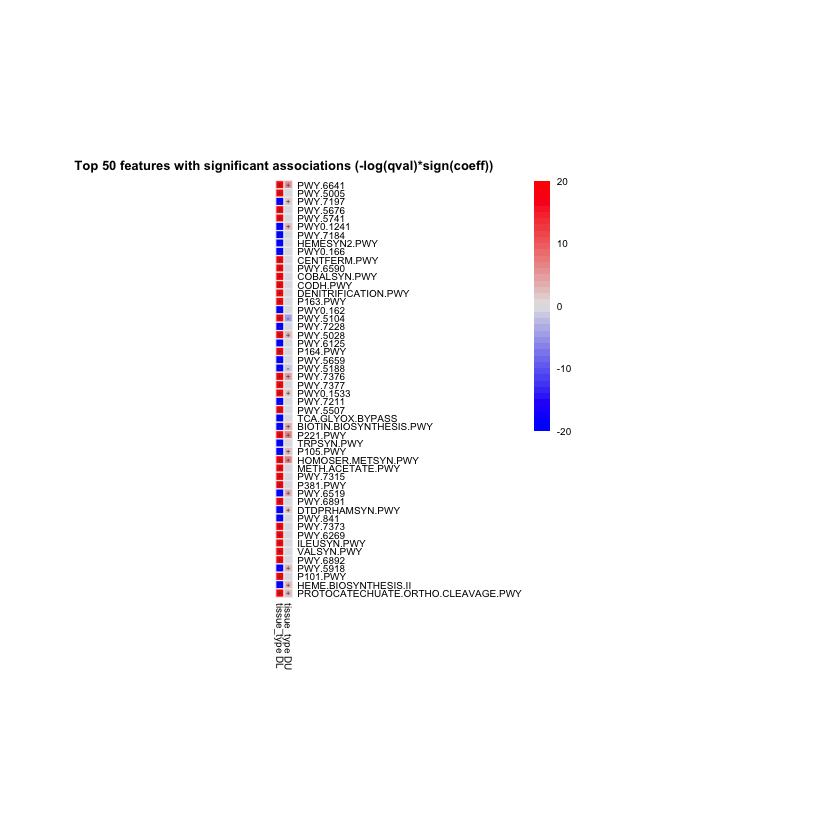

In [8]:
 Maaslin2(
    input_data = otu_table(ps.coral), 
    input_metadata = ps.coral_meta,
     min_abundance = 0.0,
    analysis_method = "LM",
     transform = "LOG",
     cores=2,
     random_effects = "Study",
    #normalization = "TMM",
    output = "/Users/stephanie.rosales/Documents/Tissueloss/SCTLD_MetaAnalysis/out_picrust/output_Maslin", 
    correction = "BH",
    fixed_effects = c("tissue_type"),
    reference = c("tissue_type,AH"))

In [9]:
sig =read.csv("/Users/stephanie.rosales/Documents/Tissueloss/SCTLD_MetaAnalysis/out_picrust/output_Maslin/significant_results.tsv",
  check.names = FALSE,
                     
                        header = T, sep= "\t")

head(sig, n=10)

,feature,metadata,value,coef,stderr,N,N.not.0,pval,qval
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>
1,PWY.6641,tissue_type,DL,0.57774113,0.036922490,1935,1837,4.887281e-52,3.919599e-49
2,PWY.5005,tissue_type,DL,0.77890241,0.053502891,1935,1064,1.259637e-45,5.051142e-43
3,PWY.7197,tissue_type,DL,-0.05040106,0.003739969,1935,1935,1.255410e-39,3.356129e-37
4,PWY.5676,tissue_type,DL,0.27436761,0.020639284,1935,1920,1.198096e-38,2.402183e-36
5,PWY.5741,tissue_type,DL,0.38694341,0.029245444,1935,1911,2.585369e-38,4.146932e-36
6,PWY0.1241,tissue_type,DL,-0.27924078,0.022390893,1935,1918,2.208020e-34,2.951387e-32
7,PWY.7184,tissue_type,DL,-0.05913888,0.004880573,1935,1934,1.264573e-32,1.448840e-30
8,HEMESYN2.PWY,tissue_type,DL,-0.08228729,0.006844064,1935,1935,3.660083e-32,3.261540e-30
9,PWY0.166,tissue_type,DL,-0.04963128,0.004127819,1935,1934,3.642010e-32,3.261540e-30


In [10]:
 sig %>%
#filter(qval <0.00001) %>%
#filter(coef > .45 | coef < -.45) %>%
filter(coef > .1 | coef < -.1) %>%
arrange(desc(-qval)) %>% 
  slice(1:10) 

feature,metadata,value,coef,stderr,N,N.not.0,pval,qval
<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>
PWY.6641,tissue_type,DL,0.5777411,0.03692249,1935,1837,4.887281e-52,3.919599e-49
PWY.5005,tissue_type,DL,0.7789024,0.05350289,1935,1064,1.259637e-45,5.051142e-43
PWY.5676,tissue_type,DL,0.2743676,0.02063928,1935,1920,1.198096e-38,2.402183e-36
PWY.5741,tissue_type,DL,0.3869434,0.02924544,1935,1911,2.585369e-38,4.146932e-36
PWY0.1241,tissue_type,DL,-0.2792408,0.02239089,1935,1918,2.208020e-34,2.951387e-32
CENTFERM.PWY,tissue_type,DL,0.5495060,0.04600220,1935,1833,8.812224e-32,7.067403e-30
PWY.6590,tissue_type,DL,0.5327878,0.04527755,1935,1833,6.391708e-31,4.660136e-29
COBALSYN.PWY,tissue_type,DL,0.2088742,0.01776853,1935,1932,7.295293e-31,4.875687e-29
CODH.PWY,tissue_type,DL,0.6476393,0.05597730,1935,1753,5.589665e-30,3.448393e-28


In [11]:
sig =read.csv("/Users/stephanie.rosales/Documents/Tissueloss/SCTLD_MetaAnalysis/out_picrust/output_Maslin/significant_results.txt",
  check.names = FALSE,
                     
                        header = T, sep= "\t")

head(sig, n=10)

,feature,metadata,value,coef,stderr,N,N.not.0,pval,qval,Pathway
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>
1,CENTFERM.PWY,tissue_type,DL,0.56739370,0.04583631,1935,1833,6.380000e-34,8.520000e-32,CENTFERM.PWY
2,COBALSYN.PWY,tissue_type,DL,0.22708352,0.01789129,1935,1932,1.640000e-35,2.640000e-33,COBALSYN.PWY
3,CODH.PWY,tissue_type,DL,0.65742676,0.05451329,1935,1753,2.430000e-32,1.950000e-30,CODH.PWY
4,DENITRIFICATION.PWY,tissue_type,DL,0.41632278,0.03436731,1935,1871,1.320000e-32,1.180000e-30,DENITRIFICATION.PWY
5,PWY.5005,tissue_type,DL,0.79778483,0.05350122,1935,1064,1.150000e-47,4.590000e-45,PWY.5005_biotin biosynthesis II
6,PWY.5676,tissue_type,DL,0.29218084,0.02021260,1935,1920,4.800000e-45,1.280000e-42,PWY.5676_acetyl_CoA fermentation to butanoate
7,PWY.5741,tissue_type,DL,0.40435208,0.02835526,1935,1911,6.140000e-44,1.230000e-41,PWY.5741_ethylmalonyl_CoA pathway
8,PWY.6590,tissue_type,DL,0.55067391,0.04510740,1935,1833,4.520000e-33,5.180000e-31,PWY.6590_superpathway of Clostridium acetobutylicum acidogenic fermentation
9,PWY.6641,tissue_type,DL,0.59544246,0.03649123,1935,1837,3.700000e-56,2.970000e-53,PWY.6641_superpathway of sulfolactate degradation


In [130]:
 sig %>%
#filter(qval <0.00001) %>%
#filter(coef > .45 | coef < -.45) %>%
filter(coef > .1 | coef < -.1) %>%
arrange(desc(-qval)) %>% 
  slice(1:10) %>%
select(Pathway)

Pathway
<chr>
PWY.6641_superpathway of sulfolactate degradation
PWY.5005_biotin biosynthesis II
PWY.5676_acetyl_CoA fermentation to butanoate
PWY.5741_ethylmalonyl_CoA pathway
COBALSYN.PWY
CENTFERM.PWY
PWY.6590_superpathway of Clostridium acetobutylicum acidogenic fermentation
NA
DENITRIFICATION.PWY


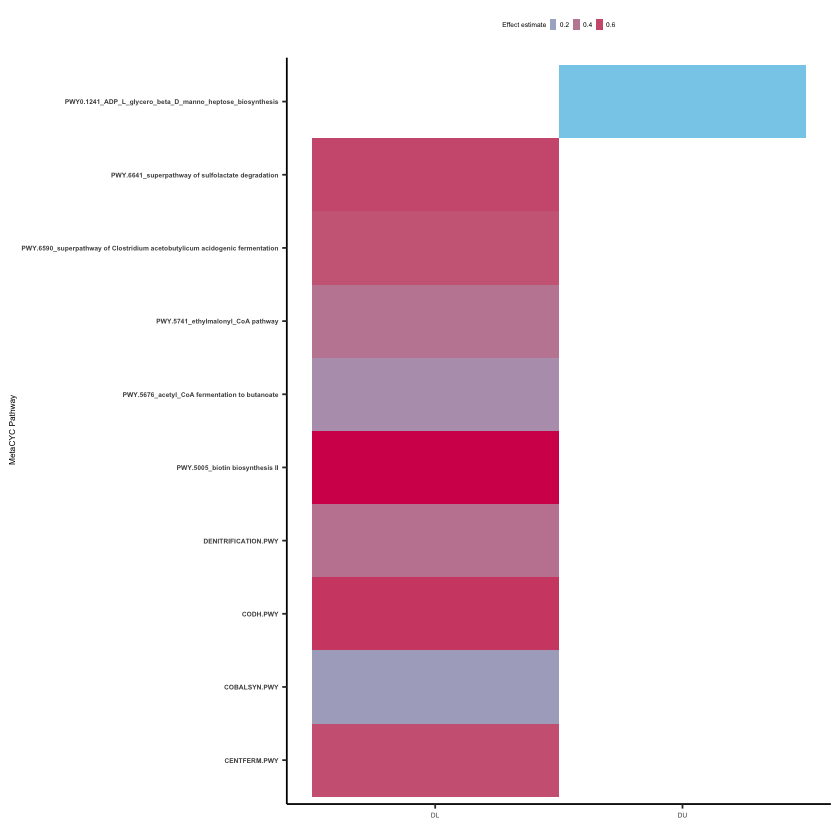

In [149]:
fig_sig = sig %>%
#filter(qval <0.00001) %>%
#filter(coef > .45 | coef < -.45) %>%
#filter(coef > .5 | coef < -.5) %>%
#arrange(desc(-qval)) %>% 
 # slice(1:10)%>% 
filter(Pathway!="NA") %>% 
ggplot( 
    aes(x = value, y = Pathway , fill = coef)) + 
    geom_tile() +

theme_classic() +
scale_fill_continuous(guide = guide_legend(keywidth = 0.30, keyheight = 0.50), low = "skyblue",
  high = "#D41159",

name = "Effect estimate") +
#guides(fill = guide_legend(keywidth = 0.30, keyheight = 0.50)) +
 #scale_fill_manual(ow = "blue", high = "red") +
theme(axis.title.x = element_text(size = 5)) +
theme(axis.title.y = element_text(size = 5)) +
theme(axis.text.y = element_text(size =4, face="bold")) +
theme(axis.text.x = element_text(size =4)) +
theme(legend.text =element_text(size=4)) +
theme(legend.title = element_text(size=4)) +
theme(legend.position="top") +
xlab("") +
ylab(" MetaCYC Pathway")
fig_sig



ggsave("/Users/stephanie.rosales/Documents/Tissueloss/SCTLD_MetaAnalysis/figs/picrust.png",
    width = 5.5, height = 5, units = "in", dpi=250)

In [16]:
# Read in the 16S qza files and clean them up for phyloseq
table_Ko <- read_qza("/Users/stephanie.rosales/Documents/Tissueloss/SCTLD_MetaAnalysis/out_picrust/picrust_Ko_meta.qza")
table_KO <- table_Ko$data # Extract the count data from list



In [17]:
ps_ko <- phyloseq(otu_table(table_KO, taxa_are_rows= T),
 sample_data(meta))
ps_ko

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 6749 taxa and 2029 samples ]
sample_data() Sample Data:       [ 2029 samples by 68 sample variables ]

In [18]:
ps.coral_Ko =subset_samples(ps_ko, sample_type %in% sub_samples2 & Alias!="AcroporaDisease"
                       )

ps.coral_Ko

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 6749 taxa and 1935 samples ]
sample_data() Sample Data:       [ 1935 samples by 68 sample variables ]

[1] "Warning: Deleting existing log file: /Users/stephanie.rosales/Documents/Tissueloss/SCTLD_MetaAnalysis/out_picrust/output_Maslin_KO/maaslin2.log"
2022-05-26 14:37:07 INFO::Writing function arguments to log file
2022-05-26 14:37:07 INFO::Verifying options selected are valid
2022-05-26 14:37:07 INFO::Determining format of input files
2022-05-26 14:37:07 INFO::Input format is data samples as columns and metadata samples as rows
2022-05-26 14:37:16 INFO::Formula for random effects: expr ~ (1 | Study)
2022-05-26 14:37:16 INFO::Formula for fixed effects: expr ~  tissue_type
2022-05-26 14:37:16 INFO::Filter data based on min abundance and min prevalence
2022-05-26 14:37:16 INFO::Total samples in data: 1935
2022-05-26 14:37:16 INFO::Min samples required with min abundance for a feature not to be filtered: 193.500000
2022-05-26 14:37:17 INFO::Total filtered features: 242
2022-05-26 14:37:17 INFO::Filtered feature names from abundance and prevalence filtering: K00109, K00125, K00186, K00189,

2022-05-26 14:40:48 INFO::Creating boxplot for categorical data, tissue_type vs K16619
2022-05-26 14:40:48 INFO::Creating boxplot for categorical data, tissue_type vs K00043
2022-05-26 14:40:48 INFO::Creating boxplot for categorical data, tissue_type vs K11689
2022-05-26 14:40:48 INFO::Creating boxplot for categorical data, tissue_type vs K05934
2022-05-26 14:40:48 INFO::Creating boxplot for categorical data, tissue_type vs K04712
2022-05-26 14:40:49 INFO::Creating boxplot for categorical data, tissue_type vs K09711
2022-05-26 14:40:49 INFO::Creating boxplot for categorical data, tissue_type vs K03380
2022-05-26 14:40:49 INFO::Creating boxplot for categorical data, tissue_type vs K08068
2022-05-26 14:40:49 INFO::Creating boxplot for categorical data, tissue_type vs K02189
2022-05-26 14:40:49 INFO::Creating boxplot for categorical data, tissue_type vs K11690
2022-05-26 14:40:49 INFO::Creating boxplot for categorical data, tissue_type vs K05773
2022-05-26 14:40:49 INFO::Creating boxplot 

2022-05-26 14:40:55 INFO::Creating boxplot for categorical data, tissue_type vs K06034
2022-05-26 14:40:55 INFO::Creating boxplot for categorical data, tissue_type vs K13039
2022-05-26 14:40:55 INFO::Creating boxplot for categorical data, tissue_type vs K19572
2022-05-26 14:40:55 INFO::Creating boxplot for categorical data, tissue_type vs K00437
2022-05-26 14:40:55 INFO::Creating boxplot for categorical data, tissue_type vs K18008
2022-05-26 14:40:55 INFO::Creating boxplot for categorical data, tissue_type vs K06857
2022-05-26 14:40:56 INFO::Creating boxplot for categorical data, tissue_type vs K16784
2022-05-26 14:40:56 INFO::Creating boxplot for categorical data, tissue_type vs K16783
2022-05-26 14:40:56 INFO::Creating boxplot for categorical data, tissue_type vs K00293
2022-05-26 14:40:56 INFO::Creating boxplot for categorical data, tissue_type vs K00180
2022-05-26 14:40:56 INFO::Creating boxplot for categorical data, tissue_type vs K07023
2022-05-26 14:40:56 INFO::Creating boxplot 

2022-05-26 14:41:01 INFO::Creating boxplot for categorical data, tissue_type vs K14446
2022-05-26 14:41:01 INFO::Creating boxplot for categorical data, tissue_type vs K00177
2022-05-26 14:41:01 INFO::Creating boxplot for categorical data, tissue_type vs K09781
2022-05-26 14:41:01 INFO::Creating boxplot for categorical data, tissue_type vs K14448
2022-05-26 14:41:01 INFO::Creating boxplot for categorical data, tissue_type vs K00002
2022-05-26 14:41:02 INFO::Creating boxplot for categorical data, tissue_type vs K07471
2022-05-26 14:41:02 INFO::Creating boxplot for categorical data, tissue_type vs K14449
2022-05-26 14:41:02 INFO::Creating boxplot for categorical data, tissue_type vs K07097
2022-05-26 14:41:02 INFO::Creating boxplot for categorical data, tissue_type vs K14447
2022-05-26 14:41:02 INFO::Creating boxplot for categorical data, tissue_type vs K04102
2022-05-26 14:41:02 INFO::Creating boxplot for categorical data, tissue_type vs K12308
2022-05-26 14:41:02 INFO::Creating boxplot 

2022-05-26 14:41:07 INFO::Creating boxplot for categorical data, tissue_type vs K06162
2022-05-26 14:41:07 INFO::Creating boxplot for categorical data, tissue_type vs K02411
2022-05-26 14:41:08 INFO::Creating boxplot for categorical data, tissue_type vs K18226
2022-05-26 14:41:08 INFO::Creating boxplot for categorical data, tissue_type vs K01677
2022-05-26 14:41:08 INFO::Creating boxplot for categorical data, tissue_type vs K01678
2022-05-26 14:41:08 INFO::Creating boxplot for categorical data, tissue_type vs K05895
2022-05-26 14:41:08 INFO::Creating boxplot for categorical data, tissue_type vs K02596
2022-05-26 14:41:08 INFO::Creating boxplot for categorical data, tissue_type vs K09936
2022-05-26 14:41:08 INFO::Creating boxplot for categorical data, tissue_type vs K13002
2022-05-26 14:41:09 INFO::Creating boxplot for categorical data, tissue_type vs K07488
2022-05-26 14:41:09 INFO::Creating boxplot for categorical data, tissue_type vs K01995
2022-05-26 14:41:09 INFO::Creating boxplot 

2022-05-26 14:41:14 INFO::Creating boxplot for categorical data, tissue_type vs K02051
2022-05-26 14:41:14 INFO::Creating boxplot for categorical data, tissue_type vs K08295
2022-05-26 14:41:14 INFO::Creating boxplot for categorical data, tissue_type vs K09777
2022-05-26 14:41:14 INFO::Creating boxplot for categorical data, tissue_type vs K00768
2022-05-26 14:41:14 INFO::Creating boxplot for categorical data, tissue_type vs K00929
2022-05-26 14:41:14 INFO::Creating boxplot for categorical data, tissue_type vs K18344
2022-05-26 14:41:15 INFO::Creating boxplot for categorical data, tissue_type vs K00532
2022-05-26 14:41:15 INFO::Creating boxplot for categorical data, tissue_type vs K19058
2022-05-26 14:41:15 INFO::Creating boxplot for categorical data, tissue_type vs K07321
2022-05-26 14:41:15 INFO::Creating boxplot for categorical data, tissue_type vs K02595
2022-05-26 14:41:15 INFO::Creating boxplot for categorical data, tissue_type vs K01457
2022-05-26 14:41:15 INFO::Creating boxplot 

2022-05-26 14:41:20 INFO::Creating boxplot for categorical data, tissue_type vs K06042
2022-05-26 14:41:20 INFO::Creating boxplot for categorical data, tissue_type vs K07080
2022-05-26 14:41:20 INFO::Creating boxplot for categorical data, tissue_type vs K15724
2022-05-26 14:41:21 INFO::Creating boxplot for categorical data, tissue_type vs K06897
2022-05-26 14:41:21 INFO::Creating boxplot for categorical data, tissue_type vs K09461
2022-05-26 14:41:21 INFO::Creating boxplot for categorical data, tissue_type vs K02050
2022-05-26 14:41:21 INFO::Creating boxplot for categorical data, tissue_type vs K07486
2022-05-26 14:41:21 INFO::Creating boxplot for categorical data, tissue_type vs K18330
2022-05-26 14:41:21 INFO::Creating boxplot for categorical data, tissue_type vs K17865
2022-05-26 14:41:21 INFO::Creating boxplot for categorical data, tissue_type vs K00496
2022-05-26 14:41:22 INFO::Creating boxplot for categorical data, tissue_type vs K00526
2022-05-26 14:41:22 INFO::Creating boxplot 

2022-05-26 14:41:27 INFO::Creating boxplot for categorical data, tissue_type vs K06177
2022-05-26 14:41:27 INFO::Creating boxplot for categorical data, tissue_type vs K09967
2022-05-26 14:41:27 INFO::Creating boxplot for categorical data, tissue_type vs K09944
2022-05-26 14:41:27 INFO::Creating boxplot for categorical data, tissue_type vs K03762
2022-05-26 14:41:27 INFO::Creating boxplot for categorical data, tissue_type vs K13288
2022-05-26 14:41:27 INFO::Creating boxplot for categorical data, tissue_type vs K01799
2022-05-26 14:41:28 INFO::Creating boxplot for categorical data, tissue_type vs K01055
2022-05-26 14:41:28 INFO::Creating boxplot for categorical data, tissue_type vs K05601
2022-05-26 14:41:28 INFO::Creating boxplot for categorical data, tissue_type vs K16915
2022-05-26 14:41:28 INFO::Creating boxplot for categorical data, tissue_type vs K18223
2022-05-26 14:41:28 INFO::Creating boxplot for categorical data, tissue_type vs K18224
2022-05-26 14:41:28 INFO::Creating boxplot 

2022-05-26 14:41:33 INFO::Creating boxplot for categorical data, tissue_type vs K17227
2022-05-26 14:41:34 INFO::Creating boxplot for categorical data, tissue_type vs K09804
2022-05-26 14:41:34 INFO::Creating boxplot for categorical data, tissue_type vs K19345
2022-05-26 14:41:34 INFO::Creating boxplot for categorical data, tissue_type vs K00651
2022-05-26 14:41:34 INFO::Creating boxplot for categorical data, tissue_type vs K05818
2022-05-26 14:41:34 INFO::Creating boxplot for categorical data, tissue_type vs K03406
2022-05-26 14:41:34 INFO::Creating boxplot for categorical data, tissue_type vs K19342
2022-05-26 14:41:35 INFO::Creating boxplot for categorical data, tissue_type vs K00355
2022-05-26 14:41:35 INFO::Creating boxplot for categorical data, tissue_type vs K16841
2022-05-26 14:41:35 INFO::Creating boxplot for categorical data, tissue_type vs K18829
2022-05-26 14:41:35 INFO::Creating boxplot for categorical data, tissue_type vs K02396
2022-05-26 14:41:35 INFO::Creating boxplot 

2022-05-26 14:41:40 INFO::Creating boxplot for categorical data, tissue_type vs K06382
2022-05-26 14:41:41 INFO::Creating boxplot for categorical data, tissue_type vs K06438
2022-05-26 14:41:41 INFO::Creating boxplot for categorical data, tissue_type vs K07742
2022-05-26 14:41:41 INFO::Creating boxplot for categorical data, tissue_type vs K07813
2022-05-26 14:41:41 INFO::Creating boxplot for categorical data, tissue_type vs K16898
2022-05-26 14:41:41 INFO::Creating boxplot for categorical data, tissue_type vs K03271
2022-05-26 14:41:41 INFO::Creating boxplot for categorical data, tissue_type vs K07138
2022-05-26 14:41:42 INFO::Creating boxplot for categorical data, tissue_type vs K11070
2022-05-26 14:41:42 INFO::Creating boxplot for categorical data, tissue_type vs K02610
2022-05-26 14:41:42 INFO::Creating boxplot for categorical data, tissue_type vs K02612
2022-05-26 14:41:42 INFO::Creating boxplot for categorical data, tissue_type vs K07006
2022-05-26 14:41:42 INFO::Creating boxplot 

2022-05-26 14:41:47 INFO::Creating boxplot for categorical data, tissue_type vs K07317
2022-05-26 14:41:48 INFO::Creating boxplot for categorical data, tissue_type vs K00517
2022-05-26 14:41:48 INFO::Creating boxplot for categorical data, tissue_type vs K19091
2022-05-26 14:41:48 INFO::Creating boxplot for categorical data, tissue_type vs K06196
2022-05-26 14:41:48 INFO::Creating boxplot for categorical data, tissue_type vs K02609
2022-05-26 14:41:48 INFO::Creating boxplot for categorical data, tissue_type vs K16698
2022-05-26 14:41:48 INFO::Creating boxplot for categorical data, tissue_type vs K12452
2022-05-26 14:41:49 INFO::Creating boxplot for categorical data, tissue_type vs K00194
2022-05-26 14:41:49 INFO::Creating boxplot for categorical data, tissue_type vs K14138
2022-05-26 14:41:49 INFO::Creating boxplot for categorical data, tissue_type vs K03557
2022-05-26 14:41:49 INFO::Creating boxplot for categorical data, tissue_type vs K05800
2022-05-26 14:41:49 INFO::Creating boxplot 

2022-05-26 14:41:55 INFO::Creating boxplot for categorical data, tissue_type vs K18927
2022-05-26 14:41:55 INFO::Creating boxplot for categorical data, tissue_type vs K00198
2022-05-26 14:41:55 INFO::Creating boxplot for categorical data, tissue_type vs K02029
2022-05-26 14:41:55 INFO::Creating boxplot for categorical data, tissue_type vs K02279
2022-05-26 14:41:55 INFO::Creating boxplot for categorical data, tissue_type vs K18702
2022-05-26 14:41:55 INFO::Creating boxplot for categorical data, tissue_type vs K10228
2022-05-26 14:41:56 INFO::Creating boxplot for categorical data, tissue_type vs K10229
2022-05-26 14:41:56 INFO::Creating boxplot for categorical data, tissue_type vs K09988
2022-05-26 14:41:56 INFO::Creating boxplot for categorical data, tissue_type vs K08602
2022-05-26 14:41:56 INFO::Creating boxplot for categorical data, tissue_type vs K03091
2022-05-26 14:41:56 INFO::Creating boxplot for categorical data, tissue_type vs K17206
2022-05-26 14:41:56 INFO::Creating boxplot 

2022-05-26 14:42:01 INFO::Creating boxplot for categorical data, tissue_type vs K02225
2022-05-26 14:42:01 INFO::Creating boxplot for categorical data, tissue_type vs K07782
2022-05-26 14:42:01 INFO::Creating boxplot for categorical data, tissue_type vs K17226
2022-05-26 14:42:01 INFO::Creating boxplot for categorical data, tissue_type vs K02031
2022-05-26 14:42:02 INFO::Creating boxplot for categorical data, tissue_type vs K06188
2022-05-26 14:42:02 INFO::Creating boxplot for categorical data, tissue_type vs K04020
2022-05-26 14:42:02 INFO::Creating boxplot for categorical data, tissue_type vs K01751
2022-05-26 14:42:02 INFO::Creating boxplot for categorical data, tissue_type vs K11475
2022-05-26 14:42:02 INFO::Creating boxplot for categorical data, tissue_type vs K09386
2022-05-26 14:42:02 INFO::Creating boxplot for categorical data, tissue_type vs K17884
2022-05-26 14:42:02 INFO::Creating boxplot for categorical data, tissue_type vs K09801
2022-05-26 14:42:03 INFO::Creating boxplot 

2022-05-26 14:42:08 INFO::Creating boxplot for categorical data, tissue_type vs K07699
2022-05-26 14:42:08 INFO::Creating boxplot for categorical data, tissue_type vs K14470
2022-05-26 14:42:08 INFO::Creating boxplot for categorical data, tissue_type vs K06374
2022-05-26 14:42:08 INFO::Creating boxplot for categorical data, tissue_type vs K06416
2022-05-26 14:42:08 INFO::Creating boxplot for categorical data, tissue_type vs K03642
2022-05-26 14:42:09 INFO::Creating boxplot for categorical data, tissue_type vs K06876
2022-05-26 14:42:09 INFO::Creating boxplot for categorical data, tissue_type vs K18587
2022-05-26 14:42:09 INFO::Creating boxplot for categorical data, tissue_type vs K07807
2022-05-26 14:42:09 INFO::Creating boxplot for categorical data, tissue_type vs K06720
2022-05-26 14:42:09 INFO::Creating boxplot for categorical data, tissue_type vs K09749
2022-05-26 14:42:09 INFO::Creating boxplot for categorical data, tissue_type vs K05559
2022-05-26 14:42:09 INFO::Creating boxplot 

2022-05-26 14:42:14 INFO::Creating boxplot for categorical data, tissue_type vs K00151
2022-05-26 14:42:14 INFO::Creating boxplot for categorical data, tissue_type vs K06896
2022-05-26 14:42:14 INFO::Creating boxplot for categorical data, tissue_type vs K17713
2022-05-26 14:42:15 INFO::Creating boxplot for categorical data, tissue_type vs K01823
2022-05-26 14:42:15 INFO::Creating boxplot for categorical data, tissue_type vs K03205
2022-05-26 14:42:15 INFO::Creating boxplot for categorical data, tissue_type vs K02400
2022-05-26 14:42:15 INFO::Creating boxplot for categorical data, tissue_type vs K01772
2022-05-26 14:42:15 INFO::Creating boxplot for categorical data, tissue_type vs K07166
2022-05-26 14:42:15 INFO::Creating boxplot for categorical data, tissue_type vs K00547
2022-05-26 14:42:15 INFO::Creating boxplot for categorical data, tissue_type vs K03582
2022-05-26 14:42:16 INFO::Creating boxplot for categorical data, tissue_type vs K00156
2022-05-26 14:42:16 INFO::Creating boxplot 

2022-05-26 14:42:21 INFO::Creating boxplot for categorical data, tissue_type vs K06281
2022-05-26 14:42:21 INFO::Creating boxplot for categorical data, tissue_type vs K19191
2022-05-26 14:42:21 INFO::Creating boxplot for categorical data, tissue_type vs K00772
2022-05-26 14:42:21 INFO::Creating boxplot for categorical data, tissue_type vs K02656
2022-05-26 14:42:21 INFO::Creating boxplot for categorical data, tissue_type vs K07338
2022-05-26 14:42:22 INFO::Creating boxplot for categorical data, tissue_type vs K00219
2022-05-26 14:42:22 INFO::Creating boxplot for categorical data, tissue_type vs K12448
2022-05-26 14:42:22 INFO::Creating boxplot for categorical data, tissue_type vs K12511
2022-05-26 14:42:22 INFO::Creating boxplot for categorical data, tissue_type vs K06908
2022-05-26 14:42:22 INFO::Creating boxplot for categorical data, tissue_type vs K16515
2022-05-26 14:42:22 INFO::Creating boxplot for categorical data, tissue_type vs K09758
2022-05-26 14:42:23 INFO::Creating boxplot 

2022-05-26 14:42:28 INFO::Creating boxplot for categorical data, tissue_type vs K03579
2022-05-26 14:42:28 INFO::Creating boxplot for categorical data, tissue_type vs K07666
2022-05-26 14:42:28 INFO::Creating boxplot for categorical data, tissue_type vs K06145
2022-05-26 14:42:28 INFO::Creating boxplot for categorical data, tissue_type vs K08084
2022-05-26 14:42:28 INFO::Creating boxplot for categorical data, tissue_type vs K03690
2022-05-26 14:42:28 INFO::Creating boxplot for categorical data, tissue_type vs K06952
2022-05-26 14:42:29 INFO::Creating boxplot for categorical data, tissue_type vs K01800
2022-05-26 14:42:29 INFO::Creating boxplot for categorical data, tissue_type vs K02027
2022-05-26 14:42:29 INFO::Creating boxplot for categorical data, tissue_type vs K02298
2022-05-26 14:42:29 INFO::Creating boxplot for categorical data, tissue_type vs K03706
2022-05-26 14:42:29 INFO::Creating boxplot for categorical data, tissue_type vs K11392
2022-05-26 14:42:29 INFO::Creating boxplot 

2022-05-26 14:42:34 INFO::Creating boxplot for categorical data, tissue_type vs K01459
2022-05-26 14:42:35 INFO::Creating boxplot for categorical data, tissue_type vs K15773
2022-05-26 14:42:35 INFO::Creating boxplot for categorical data, tissue_type vs K12978
2022-05-26 14:42:35 INFO::Creating boxplot for categorical data, tissue_type vs K03388
2022-05-26 14:42:35 INFO::Creating boxplot for categorical data, tissue_type vs K01495
2022-05-26 14:42:35 INFO::Creating boxplot for categorical data, tissue_type vs K01663
2022-05-26 14:42:35 INFO::Creating boxplot for categorical data, tissue_type vs K02663
2022-05-26 14:42:35 INFO::Creating boxplot for categorical data, tissue_type vs K07454
2022-05-26 14:42:36 INFO::Creating boxplot for categorical data, tissue_type vs K02300
2022-05-26 14:42:36 INFO::Creating boxplot for categorical data, tissue_type vs K08600
2022-05-26 14:42:36 INFO::Creating boxplot for categorical data, tissue_type vs K02409
2022-05-26 14:42:36 INFO::Creating boxplot 

2022-05-26 14:42:41 INFO::Creating boxplot for categorical data, tissue_type vs K00364
2022-05-26 14:42:41 INFO::Creating boxplot for categorical data, tissue_type vs K05375
2022-05-26 14:42:42 INFO::Creating boxplot for categorical data, tissue_type vs K07140
2022-05-26 14:42:42 INFO::Creating boxplot for categorical data, tissue_type vs K02421
2022-05-26 14:42:42 INFO::Creating boxplot for categorical data, tissue_type vs K05299
2022-05-26 14:42:42 INFO::Creating boxplot for categorical data, tissue_type vs K01277
2022-05-26 14:42:42 INFO::Creating boxplot for categorical data, tissue_type vs K15784
2022-05-26 14:42:42 INFO::Creating boxplot for categorical data, tissue_type vs K01008
2022-05-26 14:42:43 INFO::Creating boxplot for categorical data, tissue_type vs K12255
2022-05-26 14:42:43 INFO::Creating boxplot for categorical data, tissue_type vs K02054
2022-05-26 14:42:43 INFO::Creating boxplot for categorical data, tissue_type vs K12056
2022-05-26 14:42:43 INFO::Creating boxplot 

2022-05-26 14:42:48 INFO::Creating boxplot for categorical data, tissue_type vs K00197
2022-05-26 14:42:49 INFO::Creating boxplot for categorical data, tissue_type vs K06076
2022-05-26 14:42:49 INFO::Creating boxplot for categorical data, tissue_type vs K00631
2022-05-26 14:42:49 INFO::Creating boxplot for categorical data, tissue_type vs K13626
2022-05-26 14:42:49 INFO::Creating boxplot for categorical data, tissue_type vs K17762
2022-05-26 14:42:49 INFO::Creating boxplot for categorical data, tissue_type vs K03981
2022-05-26 14:42:49 INFO::Creating boxplot for categorical data, tissue_type vs K04091
2022-05-26 14:42:49 INFO::Creating boxplot for categorical data, tissue_type vs K03734
2022-05-26 14:42:50 INFO::Creating boxplot for categorical data, tissue_type vs K02665
2022-05-26 14:42:50 INFO::Creating boxplot for categorical data, tissue_type vs K01141
2022-05-26 14:42:50 INFO::Creating boxplot for categorical data, tissue_type vs K07464
2022-05-26 14:42:50 INFO::Creating boxplot 

2022-05-26 14:42:55 INFO::Creating boxplot for categorical data, tissue_type vs K09165
2022-05-26 14:42:55 INFO::Creating boxplot for categorical data, tissue_type vs K07302
2022-05-26 14:42:56 INFO::Creating boxplot for categorical data, tissue_type vs K15866
2022-05-26 14:42:56 INFO::Creating boxplot for categorical data, tissue_type vs K03465
2022-05-26 14:42:56 INFO::Creating boxplot for categorical data, tissue_type vs K07035
2022-05-26 14:42:56 INFO::Creating boxplot for categorical data, tissue_type vs K15023
2022-05-26 14:42:56 INFO::Creating boxplot for categorical data, tissue_type vs K06726
2022-05-26 14:42:56 INFO::Creating boxplot for categorical data, tissue_type vs K00821
2022-05-26 14:42:57 INFO::Creating boxplot for categorical data, tissue_type vs K12506
2022-05-26 14:42:57 INFO::Creating boxplot for categorical data, tissue_type vs K06895
2022-05-26 14:42:57 INFO::Creating boxplot for categorical data, tissue_type vs K02063
2022-05-26 14:42:57 INFO::Creating boxplot 

2022-05-26 14:43:02 INFO::Creating boxplot for categorical data, tissue_type vs K00303
2022-05-26 14:43:02 INFO::Creating boxplot for categorical data, tissue_type vs K11894
2022-05-26 14:43:02 INFO::Creating boxplot for categorical data, tissue_type vs K15551
2022-05-26 14:43:03 INFO::Creating boxplot for categorical data, tissue_type vs K16149
2022-05-26 14:43:03 INFO::Creating boxplot for categorical data, tissue_type vs K19147
2022-05-26 14:43:03 INFO::Creating boxplot for categorical data, tissue_type vs K05813
2022-05-26 14:43:03 INFO::Creating boxplot for categorical data, tissue_type vs K06320
2022-05-26 14:43:03 INFO::Creating boxplot for categorical data, tissue_type vs K00626
2022-05-26 14:43:03 INFO::Creating boxplot for categorical data, tissue_type vs K13584
2022-05-26 14:43:03 INFO::Creating boxplot for categorical data, tissue_type vs K16963
2022-05-26 14:43:04 INFO::Creating boxplot for categorical data, tissue_type vs K00220
2022-05-26 14:43:04 INFO::Creating boxplot 

2022-05-26 14:43:09 INFO::Creating boxplot for categorical data, tissue_type vs K05785
2022-05-26 14:43:09 INFO::Creating boxplot for categorical data, tissue_type vs K04564
2022-05-26 14:43:09 INFO::Creating boxplot for categorical data, tissue_type vs K05986
2022-05-26 14:43:09 INFO::Creating boxplot for categorical data, tissue_type vs K02594
2022-05-26 14:43:09 INFO::Creating boxplot for categorical data, tissue_type vs K15527
2022-05-26 14:43:10 INFO::Creating boxplot for categorical data, tissue_type vs K06015
2022-05-26 14:43:10 INFO::Creating boxplot for categorical data, tissue_type vs K02276
2022-05-26 14:43:10 INFO::Creating boxplot for categorical data, tissue_type vs K05922
2022-05-26 14:43:10 INFO::Creating boxplot for categorical data, tissue_type vs K01266
2022-05-26 14:43:10 INFO::Creating boxplot for categorical data, tissue_type vs K02419
2022-05-26 14:43:10 INFO::Creating boxplot for categorical data, tissue_type vs K08083
2022-05-26 14:43:10 INFO::Creating boxplot 

2022-05-26 14:43:16 INFO::Creating boxplot for categorical data, tissue_type vs K16846
2022-05-26 14:43:16 INFO::Creating boxplot for categorical data, tissue_type vs K02488
2022-05-26 14:43:16 INFO::Creating boxplot for categorical data, tissue_type vs K07710
2022-05-26 14:43:16 INFO::Creating boxplot for categorical data, tissue_type vs K13529
2022-05-26 14:43:16 INFO::Creating boxplot for categorical data, tissue_type vs K08082
2022-05-26 14:43:17 INFO::Creating boxplot for categorical data, tissue_type vs K00239
2022-05-26 14:43:17 INFO::Creating boxplot for categorical data, tissue_type vs K00824
2022-05-26 14:43:17 INFO::Creating boxplot for categorical data, tissue_type vs K06191
2022-05-26 14:43:17 INFO::Creating boxplot for categorical data, tissue_type vs K09883
2022-05-26 14:43:17 INFO::Creating boxplot for categorical data, tissue_type vs K03528
2022-05-26 14:43:17 INFO::Creating boxplot for categorical data, tissue_type vs K06350
2022-05-26 14:43:18 INFO::Creating boxplot 

2022-05-26 14:43:23 INFO::Creating boxplot for categorical data, tissue_type vs K09882
2022-05-26 14:43:23 INFO::Creating boxplot for categorical data, tissue_type vs K16558
2022-05-26 14:43:23 INFO::Creating boxplot for categorical data, tissue_type vs K01916
2022-05-26 14:43:23 INFO::Creating boxplot for categorical data, tissue_type vs K06148
2022-05-26 14:43:23 INFO::Creating boxplot for categorical data, tissue_type vs K02001
2022-05-26 14:43:24 INFO::Creating boxplot for categorical data, tissue_type vs K11003
2022-05-26 14:43:24 INFO::Creating boxplot for categorical data, tissue_type vs K15396
2022-05-26 14:43:24 INFO::Creating boxplot for categorical data, tissue_type vs K03635
2022-05-26 14:43:24 INFO::Creating boxplot for categorical data, tissue_type vs K07217
2022-05-26 14:43:24 INFO::Creating boxplot for categorical data, tissue_type vs K00980
2022-05-26 14:43:24 INFO::Creating boxplot for categorical data, tissue_type vs K11940
2022-05-26 14:43:25 INFO::Creating boxplot 

2022-05-26 14:43:30 INFO::Creating boxplot for categorical data, tissue_type vs K03449
2022-05-26 14:43:30 INFO::Creating boxplot for categorical data, tissue_type vs K01595
2022-05-26 14:43:30 INFO::Creating boxplot for categorical data, tissue_type vs K03548
2022-05-26 14:43:30 INFO::Creating boxplot for categorical data, tissue_type vs K00324
2022-05-26 14:43:30 INFO::Creating boxplot for categorical data, tissue_type vs K03752
2022-05-26 14:43:30 INFO::Creating boxplot for categorical data, tissue_type vs K09935
2022-05-26 14:43:31 INFO::Creating boxplot for categorical data, tissue_type vs K00788
2022-05-26 14:43:31 INFO::Creating boxplot for categorical data, tissue_type vs K10206
2022-05-26 14:43:31 INFO::Creating boxplot for categorical data, tissue_type vs K14161
2022-05-26 14:43:31 INFO::Creating boxplot for categorical data, tissue_type vs K18475
2022-05-26 14:43:31 INFO::Creating boxplot for categorical data, tissue_type vs K02793
2022-05-26 14:43:31 INFO::Creating boxplot 

2022-05-26 14:43:36 INFO::Creating boxplot for categorical data, tissue_type vs K04568
2022-05-26 14:43:36 INFO::Creating boxplot for categorical data, tissue_type vs K11895
2022-05-26 14:43:36 INFO::Creating boxplot for categorical data, tissue_type vs K02674
2022-05-26 14:43:36 INFO::Creating boxplot for categorical data, tissue_type vs K07482
2022-05-26 14:43:37 INFO::Creating boxplot for categorical data, tissue_type vs K01512
2022-05-26 14:43:37 INFO::Creating boxplot for categorical data, tissue_type vs K03767
2022-05-26 14:43:37 INFO::Creating boxplot for categorical data, tissue_type vs K15554
2022-05-26 14:43:37 INFO::Creating boxplot for categorical data, tissue_type vs K07778
2022-05-26 14:43:37 INFO::Creating boxplot for categorical data, tissue_type vs K02496
2022-05-26 14:43:37 INFO::Creating boxplot for categorical data, tissue_type vs K07661
2022-05-26 14:43:37 INFO::Creating boxplot for categorical data, tissue_type vs K05304
2022-05-26 14:43:37 INFO::Creating boxplot 

2022-05-26 14:43:42 INFO::Creating boxplot for categorical data, tissue_type vs K03219
2022-05-26 14:43:42 INFO::Creating boxplot for categorical data, tissue_type vs K13993
2022-05-26 14:43:42 INFO::Creating boxplot for categorical data, tissue_type vs K15785
2022-05-26 14:43:42 INFO::Creating boxplot for categorical data, tissue_type vs K03710
2022-05-26 14:43:43 INFO::Creating boxplot for categorical data, tissue_type vs K07508
2022-05-26 14:43:43 INFO::Creating boxplot for categorical data, tissue_type vs K03203
2022-05-26 14:43:43 INFO::Creating boxplot for categorical data, tissue_type vs K13012
2022-05-26 14:43:43 INFO::Creating boxplot for categorical data, tissue_type vs K02226
2022-05-26 14:43:43 INFO::Creating boxplot for categorical data, tissue_type vs K03181
2022-05-26 14:43:43 INFO::Creating boxplot for categorical data, tissue_type vs K07005
2022-05-26 14:43:44 INFO::Creating boxplot for categorical data, tissue_type vs K03118
2022-05-26 14:43:44 INFO::Creating boxplot 

2022-05-26 14:43:48 INFO::Creating boxplot for categorical data, tissue_type vs K03315
2022-05-26 14:43:48 INFO::Creating boxplot for categorical data, tissue_type vs K00611
2022-05-26 14:43:49 INFO::Creating boxplot for categorical data, tissue_type vs K06113
2022-05-26 14:43:49 INFO::Creating boxplot for categorical data, tissue_type vs K03566
2022-05-26 14:43:49 INFO::Creating boxplot for categorical data, tissue_type vs K02474
2022-05-26 14:43:49 INFO::Creating boxplot for categorical data, tissue_type vs K07262
2022-05-26 14:43:49 INFO::Creating boxplot for categorical data, tissue_type vs K07168
2022-05-26 14:43:49 INFO::Creating boxplot for categorical data, tissue_type vs K12251
2022-05-26 14:43:49 INFO::Creating boxplot for categorical data, tissue_type vs K18552
2022-05-26 14:43:50 INFO::Creating boxplot for categorical data, tissue_type vs K15578
2022-05-26 14:43:50 INFO::Creating boxplot for categorical data, tissue_type vs K02452
2022-05-26 14:43:50 INFO::Creating boxplot 

2022-05-26 14:43:55 INFO::Creating boxplot for categorical data, tissue_type vs K15553
2022-05-26 14:43:55 INFO::Creating boxplot for categorical data, tissue_type vs K07173
2022-05-26 14:43:55 INFO::Creating boxplot for categorical data, tissue_type vs K03273
2022-05-26 14:43:55 INFO::Creating boxplot for categorical data, tissue_type vs K02007
2022-05-26 14:43:55 INFO::Creating boxplot for categorical data, tissue_type vs K04094
2022-05-26 14:43:55 INFO::Creating boxplot for categorical data, tissue_type vs K16213
2022-05-26 14:43:55 INFO::Creating boxplot for categorical data, tissue_type vs K19784
2022-05-26 14:43:56 INFO::Creating boxplot for categorical data, tissue_type vs K03753
2022-05-26 14:43:56 INFO::Creating boxplot for categorical data, tissue_type vs K01915
2022-05-26 14:43:56 INFO::Creating boxplot for categorical data, tissue_type vs K02348
2022-05-26 14:43:56 INFO::Creating boxplot for categorical data, tissue_type vs K02230
2022-05-26 14:43:56 INFO::Creating boxplot 

2022-05-26 14:44:01 INFO::Creating boxplot for categorical data, tissue_type vs K13572
2022-05-26 14:44:01 INFO::Creating boxplot for categorical data, tissue_type vs K01950
2022-05-26 14:44:01 INFO::Creating boxplot for categorical data, tissue_type vs K00477
2022-05-26 14:44:01 INFO::Creating boxplot for categorical data, tissue_type vs K15577
2022-05-26 14:44:01 INFO::Creating boxplot for categorical data, tissue_type vs K02006
2022-05-26 14:44:02 INFO::Creating boxplot for categorical data, tissue_type vs K03116
2022-05-26 14:44:02 INFO::Creating boxplot for categorical data, tissue_type vs K11903
2022-05-26 14:44:02 INFO::Creating boxplot for categorical data, tissue_type vs K12950
2022-05-26 14:44:02 INFO::Creating boxplot for categorical data, tissue_type vs K01322
2022-05-26 14:44:02 INFO::Creating boxplot for categorical data, tissue_type vs K00674
2022-05-26 14:44:02 INFO::Creating boxplot for categorical data, tissue_type vs K11004
2022-05-26 14:44:02 INFO::Creating boxplot 

2022-05-26 14:44:07 INFO::Creating boxplot for categorical data, tissue_type vs K00656
2022-05-26 14:44:07 INFO::Creating boxplot for categorical data, tissue_type vs K07305
2022-05-26 14:44:07 INFO::Creating boxplot for categorical data, tissue_type vs K00997
2022-05-26 14:44:08 INFO::Creating boxplot for categorical data, tissue_type vs K02548
2022-05-26 14:44:08 INFO::Creating boxplot for categorical data, tissue_type vs K01448
2022-05-26 14:44:08 INFO::Creating boxplot for categorical data, tissue_type vs K00209
2022-05-26 14:44:08 INFO::Creating boxplot for categorical data, tissue_type vs K01560
2022-05-26 14:44:08 INFO::Creating boxplot for categorical data, tissue_type vs K18588
2022-05-26 14:44:08 INFO::Creating boxplot for categorical data, tissue_type vs K02424
2022-05-26 14:44:09 INFO::Creating boxplot for categorical data, tissue_type vs K05515
2022-05-26 14:44:09 INFO::Creating boxplot for categorical data, tissue_type vs K04049
2022-05-26 14:44:09 INFO::Creating boxplot 

2022-05-26 14:44:14 INFO::Creating boxplot for categorical data, tissue_type vs K00523
2022-05-26 14:44:14 INFO::Creating boxplot for categorical data, tissue_type vs K02160
2022-05-26 14:44:14 INFO::Creating boxplot for categorical data, tissue_type vs K10552
2022-05-26 14:44:14 INFO::Creating boxplot for categorical data, tissue_type vs K00833
2022-05-26 14:44:14 INFO::Creating boxplot for categorical data, tissue_type vs K18893
2022-05-26 14:44:14 INFO::Creating boxplot for categorical data, tissue_type vs K05245
2022-05-26 14:44:14 INFO::Creating boxplot for categorical data, tissue_type vs K04566
2022-05-26 14:44:15 INFO::Creating boxplot for categorical data, tissue_type vs K02668
2022-05-26 14:44:15 INFO::Creating boxplot for categorical data, tissue_type vs K07678
2022-05-26 14:44:15 INFO::Creating boxplot for categorical data, tissue_type vs K03305
2022-05-26 14:44:15 INFO::Creating boxplot for categorical data, tissue_type vs K09932
2022-05-26 14:44:15 INFO::Creating boxplot 

2022-05-26 14:44:20 INFO::Creating boxplot for categorical data, tissue_type vs K01218
2022-05-26 14:44:21 INFO::Creating boxplot for categorical data, tissue_type vs K01971
2022-05-26 14:44:21 INFO::Creating boxplot for categorical data, tissue_type vs K07400
2022-05-26 14:44:21 INFO::Creating boxplot for categorical data, tissue_type vs K08324
2022-05-26 14:44:21 INFO::Creating boxplot for categorical data, tissue_type vs K02676
2022-05-26 14:44:21 INFO::Creating boxplot for categorical data, tissue_type vs K06391
2022-05-26 14:44:21 INFO::Creating boxplot for categorical data, tissue_type vs K04068
2022-05-26 14:44:22 INFO::Creating boxplot for categorical data, tissue_type vs K02481
2022-05-26 14:44:22 INFO::Creating boxplot for categorical data, tissue_type vs K00758
2022-05-26 14:44:22 INFO::Creating boxplot for categorical data, tissue_type vs K01808
2022-05-26 14:44:22 INFO::Creating boxplot for categorical data, tissue_type vs K00038
2022-05-26 14:44:22 INFO::Creating boxplot 

2022-05-26 14:44:28 INFO::Creating boxplot for categorical data, tissue_type vs K14665
2022-05-26 14:44:28 INFO::Creating boxplot for categorical data, tissue_type vs K07156
2022-05-26 14:44:28 INFO::Creating boxplot for categorical data, tissue_type vs K01035
2022-05-26 14:44:28 INFO::Creating boxplot for categorical data, tissue_type vs K12574
2022-05-26 14:44:28 INFO::Creating boxplot for categorical data, tissue_type vs K12989
2022-05-26 14:44:28 INFO::Creating boxplot for categorical data, tissue_type vs K13541
2022-05-26 14:44:29 INFO::Creating boxplot for categorical data, tissue_type vs K00266
2022-05-26 14:44:29 INFO::Creating boxplot for categorical data, tissue_type vs K10111
2022-05-26 14:44:29 INFO::Creating boxplot for categorical data, tissue_type vs K08352
2022-05-26 14:44:29 INFO::Creating boxplot for categorical data, tissue_type vs K01129
2022-05-26 14:44:29 INFO::Creating boxplot for categorical data, tissue_type vs K05816
2022-05-26 14:44:29 INFO::Creating boxplot 

2022-05-26 14:44:35 INFO::Creating boxplot for categorical data, tissue_type vs K18930
2022-05-26 14:44:35 INFO::Creating boxplot for categorical data, tissue_type vs K03720
2022-05-26 14:44:35 INFO::Creating boxplot for categorical data, tissue_type vs K13642
2022-05-26 14:44:35 INFO::Creating boxplot for categorical data, tissue_type vs K19173
2022-05-26 14:44:35 INFO::Creating boxplot for categorical data, tissue_type vs K19175
2022-05-26 14:44:36 INFO::Creating boxplot for categorical data, tissue_type vs K09998
2022-05-26 14:44:36 INFO::Creating boxplot for categorical data, tissue_type vs K09999
2022-05-26 14:44:36 INFO::Creating boxplot for categorical data, tissue_type vs K13929
2022-05-26 14:44:36 INFO::Creating boxplot for categorical data, tissue_type vs K13930
2022-05-26 14:44:36 INFO::Creating boxplot for categorical data, tissue_type vs K13932
2022-05-26 14:44:36 INFO::Creating boxplot for categorical data, tissue_type vs K13933
2022-05-26 14:44:37 INFO::Creating boxplot 

2022-05-26 14:44:42 INFO::Creating boxplot for categorical data, tissue_type vs K11904
2022-05-26 14:44:42 INFO::Creating boxplot for categorical data, tissue_type vs K09926
2022-05-26 14:44:42 INFO::Creating boxplot for categorical data, tissue_type vs K00334
2022-05-26 14:44:42 INFO::Creating boxplot for categorical data, tissue_type vs K01283
2022-05-26 14:44:43 INFO::Creating boxplot for categorical data, tissue_type vs K01186
2022-05-26 14:44:43 INFO::Creating boxplot for categorical data, tissue_type vs K02039
2022-05-26 14:44:43 INFO::Creating boxplot for categorical data, tissue_type vs K00836
2022-05-26 14:44:43 INFO::Creating boxplot for categorical data, tissue_type vs K00692
2022-05-26 14:44:43 INFO::Creating boxplot for categorical data, tissue_type vs K12542
2022-05-26 14:44:43 INFO::Creating boxplot for categorical data, tissue_type vs K00452
2022-05-26 14:44:44 INFO::Creating boxplot for categorical data, tissue_type vs K00370
2022-05-26 14:44:44 INFO::Creating boxplot 

2022-05-26 14:44:49 INFO::Creating boxplot for categorical data, tissue_type vs K13531
2022-05-26 14:44:49 INFO::Creating boxplot for categorical data, tissue_type vs K00641
2022-05-26 14:44:49 INFO::Creating boxplot for categorical data, tissue_type vs K13599
2022-05-26 14:44:50 INFO::Creating boxplot for categorical data, tissue_type vs K13810
2022-05-26 14:44:50 INFO::Creating boxplot for categorical data, tissue_type vs K02465
2022-05-26 14:44:50 INFO::Creating boxplot for categorical data, tissue_type vs K19734
2022-05-26 14:44:50 INFO::Creating boxplot for categorical data, tissue_type vs K19641
2022-05-26 14:44:50 INFO::Creating boxplot for categorical data, tissue_type vs K01567
2022-05-26 14:44:50 INFO::Creating boxplot for categorical data, tissue_type vs K09456
2022-05-26 14:44:51 INFO::Creating boxplot for categorical data, tissue_type vs K00427
2022-05-26 14:44:51 INFO::Creating boxplot for categorical data, tissue_type vs K14348
2022-05-26 14:44:51 INFO::Creating boxplot 

2022-05-26 14:44:56 INFO::Creating boxplot for categorical data, tissue_type vs K02445
2022-05-26 14:44:57 INFO::Creating boxplot for categorical data, tissue_type vs K16011
2022-05-26 14:44:57 INFO::Creating boxplot for categorical data, tissue_type vs K18831
2022-05-26 14:44:57 INFO::Creating boxplot for categorical data, tissue_type vs K02076
2022-05-26 14:44:57 INFO::Creating boxplot for categorical data, tissue_type vs K01195
2022-05-26 14:44:57 INFO::Creating boxplot for categorical data, tissue_type vs K09162
2022-05-26 14:44:57 INFO::Creating boxplot for categorical data, tissue_type vs K03321
2022-05-26 14:44:57 INFO::Creating boxplot for categorical data, tissue_type vs K06199
2022-05-26 14:44:58 INFO::Creating boxplot for categorical data, tissue_type vs K07039
2022-05-26 14:44:58 INFO::Creating boxplot for categorical data, tissue_type vs K12528
2022-05-26 14:44:58 INFO::Creating boxplot for categorical data, tissue_type vs K12529
2022-05-26 14:44:58 INFO::Creating boxplot 

2022-05-26 14:45:04 INFO::Creating boxplot for categorical data, tissue_type vs K08086
2022-05-26 14:45:04 INFO::Creating boxplot for categorical data, tissue_type vs K11923
2022-05-26 14:45:04 INFO::Creating boxplot for categorical data, tissue_type vs K15331
2022-05-26 14:45:04 INFO::Creating boxplot for categorical data, tissue_type vs K07231
2022-05-26 14:45:05 INFO::Creating boxplot for categorical data, tissue_type vs K07154
2022-05-26 14:45:05 INFO::Creating boxplot for categorical data, tissue_type vs K00087
2022-05-26 14:45:05 INFO::Creating boxplot for categorical data, tissue_type vs K15772
2022-05-26 14:45:05 INFO::Creating boxplot for categorical data, tissue_type vs K02243
2022-05-26 14:45:05 INFO::Creating boxplot for categorical data, tissue_type vs K18692
2022-05-26 14:45:05 INFO::Creating boxplot for categorical data, tissue_type vs K07651
2022-05-26 14:45:05 INFO::Creating boxplot for categorical data, tissue_type vs K01753
2022-05-26 14:45:06 INFO::Creating boxplot 

2022-05-26 14:45:10 INFO::Creating boxplot for categorical data, tissue_type vs K00130
2022-05-26 14:45:10 INFO::Creating boxplot for categorical data, tissue_type vs K11144
2022-05-26 14:45:11 INFO::Creating boxplot for categorical data, tissue_type vs K19170
2022-05-26 14:45:11 INFO::Creating boxplot for categorical data, tissue_type vs K08097
2022-05-26 14:45:11 INFO::Creating boxplot for categorical data, tissue_type vs K03817
2022-05-26 14:45:11 INFO::Creating boxplot for categorical data, tissue_type vs K01070
2022-05-26 14:45:11 INFO::Creating boxplot for categorical data, tissue_type vs K02244
2022-05-26 14:45:11 INFO::Creating boxplot for categorical data, tissue_type vs K01825
2022-05-26 14:45:11 INFO::Creating boxplot for categorical data, tissue_type vs K14205
2022-05-26 14:45:12 INFO::Creating boxplot for categorical data, tissue_type vs K10026
2022-05-26 14:45:12 INFO::Creating boxplot for categorical data, tissue_type vs K02086
2022-05-26 14:45:12 INFO::Creating boxplot 

2022-05-26 14:45:17 INFO::Creating boxplot for categorical data, tissue_type vs K06314
2022-05-26 14:45:17 INFO::Creating boxplot for categorical data, tissue_type vs K12992
2022-05-26 14:45:17 INFO::Creating boxplot for categorical data, tissue_type vs K07145
2022-05-26 14:45:17 INFO::Creating boxplot for categorical data, tissue_type vs K06960
2022-05-26 14:45:17 INFO::Creating boxplot for categorical data, tissue_type vs K12976
2022-05-26 14:45:18 INFO::Creating boxplot for categorical data, tissue_type vs K07026
2022-05-26 14:45:18 INFO::Creating boxplot for categorical data, tissue_type vs K02304
2022-05-26 14:45:18 INFO::Creating boxplot for categorical data, tissue_type vs K01201
2022-05-26 14:45:18 INFO::Creating boxplot for categorical data, tissue_type vs K06286
2022-05-26 14:45:18 INFO::Creating boxplot for categorical data, tissue_type vs K02497
2022-05-26 14:45:18 INFO::Creating boxplot for categorical data, tissue_type vs K03693
2022-05-26 14:45:18 INFO::Creating boxplot 

2022-05-26 14:45:23 INFO::Creating boxplot for categorical data, tissue_type vs K10941
2022-05-26 14:45:24 INFO::Creating boxplot for categorical data, tissue_type vs K10545
2022-05-26 14:45:24 INFO::Creating boxplot for categorical data, tissue_type vs K04062
2022-05-26 14:45:24 INFO::Creating boxplot for categorical data, tissue_type vs K19242
2022-05-26 14:45:24 INFO::Creating boxplot for categorical data, tissue_type vs K02065
2022-05-26 14:45:24 INFO::Creating boxplot for categorical data, tissue_type vs K07746
2022-05-26 14:45:24 INFO::Creating boxplot for categorical data, tissue_type vs K13894
2022-05-26 14:45:24 INFO::Creating boxplot for categorical data, tissue_type vs K07215
2022-05-26 14:45:25 INFO::Creating boxplot for categorical data, tissue_type vs K06202
2022-05-26 14:45:25 INFO::Creating boxplot for categorical data, tissue_type vs K13895
2022-05-26 14:45:25 INFO::Creating boxplot for categorical data, tissue_type vs K06884
2022-05-26 14:45:25 INFO::Creating boxplot 

2022-05-26 14:45:30 INFO::Creating boxplot for categorical data, tissue_type vs K16509
2022-05-26 14:45:30 INFO::Creating boxplot for categorical data, tissue_type vs K07476
2022-05-26 14:45:30 INFO::Creating boxplot for categorical data, tissue_type vs K00137
2022-05-26 14:45:30 INFO::Creating boxplot for categorical data, tissue_type vs K08261
2022-05-26 14:45:30 INFO::Creating boxplot for categorical data, tissue_type vs K09680
2022-05-26 14:45:30 INFO::Creating boxplot for categorical data, tissue_type vs K03500
2022-05-26 14:45:31 INFO::Creating boxplot for categorical data, tissue_type vs K03313
2022-05-26 14:45:31 INFO::Creating boxplot for categorical data, tissue_type vs K06147
2022-05-26 14:45:31 INFO::Creating boxplot for categorical data, tissue_type vs K09958
2022-05-26 14:45:31 INFO::Creating boxplot for categorical data, tissue_type vs K15540
2022-05-26 14:45:31 INFO::Creating boxplot for categorical data, tissue_type vs K11476
2022-05-26 14:45:31 INFO::Creating boxplot 

2022-05-26 14:45:36 INFO::Creating boxplot for categorical data, tissue_type vs K09806
2022-05-26 14:45:36 INFO::Creating boxplot for categorical data, tissue_type vs K01640
2022-05-26 14:45:37 INFO::Creating boxplot for categorical data, tissue_type vs K15982
2022-05-26 14:45:37 INFO::Creating boxplot for categorical data, tissue_type vs K09972
2022-05-26 14:45:37 INFO::Creating boxplot for categorical data, tissue_type vs K12111
2022-05-26 14:45:37 INFO::Creating boxplot for categorical data, tissue_type vs K09121
2022-05-26 14:45:37 INFO::Creating boxplot for categorical data, tissue_type vs K11685
2022-05-26 14:45:37 INFO::Creating boxplot for categorical data, tissue_type vs K18586
2022-05-26 14:45:37 INFO::Creating boxplot for categorical data, tissue_type vs K01584
2022-05-26 14:45:38 INFO::Creating boxplot for categorical data, tissue_type vs K11930
2022-05-26 14:45:38 INFO::Creating boxplot for categorical data, tissue_type vs K04032
2022-05-26 14:45:38 INFO::Creating boxplot 

2022-05-26 14:45:43 INFO::Creating boxplot for categorical data, tissue_type vs K01489
2022-05-26 14:45:43 INFO::Creating boxplot for categorical data, tissue_type vs K11706
2022-05-26 14:45:43 INFO::Creating boxplot for categorical data, tissue_type vs K09929
2022-05-26 14:45:43 INFO::Creating boxplot for categorical data, tissue_type vs K02744
2022-05-26 14:45:43 INFO::Creating boxplot for categorical data, tissue_type vs K02574
2022-05-26 14:45:43 INFO::Creating boxplot for categorical data, tissue_type vs K04343
2022-05-26 14:45:43 INFO::Creating boxplot for categorical data, tissue_type vs K00104
2022-05-26 14:45:44 INFO::Creating boxplot for categorical data, tissue_type vs K00453
2022-05-26 14:45:44 INFO::Creating boxplot for categorical data, tissue_type vs K04080
2022-05-26 14:45:44 INFO::Creating boxplot for categorical data, tissue_type vs K13853
2022-05-26 14:45:44 INFO::Creating boxplot for categorical data, tissue_type vs K00048
2022-05-26 14:45:44 INFO::Creating boxplot 

2022-05-26 14:45:49 INFO::Creating boxplot for categorical data, tissue_type vs K07696
2022-05-26 14:45:49 INFO::Creating boxplot for categorical data, tissue_type vs K01244
2022-05-26 14:45:49 INFO::Creating boxplot for categorical data, tissue_type vs K01378
2022-05-26 14:45:49 INFO::Creating boxplot for categorical data, tissue_type vs K06002
2022-05-26 14:45:50 INFO::Creating boxplot for categorical data, tissue_type vs K06058
2022-05-26 14:45:50 INFO::Creating boxplot for categorical data, tissue_type vs K07750
2022-05-26 14:45:50 INFO::Creating boxplot for categorical data, tissue_type vs K08961
2022-05-26 14:45:50 INFO::Creating boxplot for categorical data, tissue_type vs K09124
2022-05-26 14:45:50 INFO::Creating boxplot for categorical data, tissue_type vs K10343
2022-05-26 14:45:50 INFO::Creating boxplot for categorical data, tissue_type vs K13195
2022-05-26 14:45:50 INFO::Creating boxplot for categorical data, tissue_type vs K13988
2022-05-26 14:45:50 INFO::Creating boxplot 

2022-05-26 14:45:56 INFO::Creating boxplot for categorical data, tissue_type vs K10909
2022-05-26 14:45:56 INFO::Creating boxplot for categorical data, tissue_type vs K03643
2022-05-26 14:45:56 INFO::Creating boxplot for categorical data, tissue_type vs K02404
2022-05-26 14:45:56 INFO::Creating boxplot for categorical data, tissue_type vs K03060
2022-05-26 14:45:56 INFO::Creating boxplot for categorical data, tissue_type vs K06434
2022-05-26 14:45:56 INFO::Creating boxplot for categorical data, tissue_type vs K12685
2022-05-26 14:45:56 INFO::Creating boxplot for categorical data, tissue_type vs K06413
2022-05-26 14:45:57 INFO::Creating boxplot for categorical data, tissue_type vs K09946
2022-05-26 14:45:57 INFO::Creating boxplot for categorical data, tissue_type vs K03325
2022-05-26 14:45:57 INFO::Creating boxplot for categorical data, tissue_type vs K05778
2022-05-26 14:45:57 INFO::Creating boxplot for categorical data, tissue_type vs K12234
2022-05-26 14:45:57 INFO::Creating boxplot 

2022-05-26 14:46:02 INFO::Creating boxplot for categorical data, tissue_type vs K01577
2022-05-26 14:46:02 INFO::Creating boxplot for categorical data, tissue_type vs K06893
2022-05-26 14:46:03 INFO::Creating boxplot for categorical data, tissue_type vs K04561
2022-05-26 14:46:03 INFO::Creating boxplot for categorical data, tissue_type vs K00564
2022-05-26 14:46:03 INFO::Creating boxplot for categorical data, tissue_type vs K00756
2022-05-26 14:46:03 INFO::Creating boxplot for categorical data, tissue_type vs K11907
2022-05-26 14:46:03 INFO::Creating boxplot for categorical data, tissue_type vs K07670
2022-05-26 14:46:03 INFO::Creating boxplot for categorical data, tissue_type vs K06929
2022-05-26 14:46:03 INFO::Creating boxplot for categorical data, tissue_type vs K07706
2022-05-26 14:46:04 INFO::Creating boxplot for categorical data, tissue_type vs K07640
2022-05-26 14:46:04 INFO::Creating boxplot for categorical data, tissue_type vs K04046
2022-05-26 14:46:04 INFO::Creating boxplot 

2022-05-26 14:46:09 INFO::Creating boxplot for categorical data, tissue_type vs K05823
2022-05-26 14:46:09 INFO::Creating boxplot for categorical data, tissue_type vs K15634
2022-05-26 14:46:09 INFO::Creating boxplot for categorical data, tissue_type vs K06972
2022-05-26 14:46:09 INFO::Creating boxplot for categorical data, tissue_type vs K13069
2022-05-26 14:46:10 INFO::Creating boxplot for categorical data, tissue_type vs K19128
2022-05-26 14:46:10 INFO::Creating boxplot for categorical data, tissue_type vs K19129
2022-05-26 14:46:10 INFO::Creating boxplot for categorical data, tissue_type vs K19130
2022-05-26 14:46:10 INFO::Creating boxplot for categorical data, tissue_type vs K10542
2022-05-26 14:46:10 INFO::Creating boxplot for categorical data, tissue_type vs K09773
2022-05-26 14:46:10 INFO::Creating boxplot for categorical data, tissue_type vs K18979
2022-05-26 14:46:10 INFO::Creating boxplot for categorical data, tissue_type vs K06883
2022-05-26 14:46:11 INFO::Creating boxplot 

2022-05-26 14:46:16 INFO::Creating boxplot for categorical data, tissue_type vs K08995
2022-05-26 14:46:16 INFO::Creating boxplot for categorical data, tissue_type vs K00406
2022-05-26 14:46:16 INFO::Creating boxplot for categorical data, tissue_type vs K03299
2022-05-26 14:46:16 INFO::Creating boxplot for categorical data, tissue_type vs K10108
2022-05-26 14:46:16 INFO::Creating boxplot for categorical data, tissue_type vs K17292
2022-05-26 14:46:16 INFO::Creating boxplot for categorical data, tissue_type vs K17898
2022-05-26 14:46:17 INFO::Creating boxplot for categorical data, tissue_type vs K17899
2022-05-26 14:46:17 INFO::Creating boxplot for categorical data, tissue_type vs K09836
2022-05-26 14:46:17 INFO::Creating boxplot for categorical data, tissue_type vs K07343
2022-05-26 14:46:17 INFO::Creating boxplot for categorical data, tissue_type vs K06317
2022-05-26 14:46:17 INFO::Creating boxplot for categorical data, tissue_type vs K02371
2022-05-26 14:46:17 INFO::Creating boxplot 

2022-05-26 14:46:23 INFO::Creating boxplot for categorical data, tissue_type vs K06969
2022-05-26 14:46:23 INFO::Creating boxplot for categorical data, tissue_type vs K09810
2022-05-26 14:46:23 INFO::Creating boxplot for categorical data, tissue_type vs K16049
2022-05-26 14:46:23 INFO::Creating boxplot for categorical data, tissue_type vs K19519
2022-05-26 14:46:24 INFO::Creating boxplot for categorical data, tissue_type vs K05786
2022-05-26 14:46:24 INFO::Creating boxplot for categorical data, tissue_type vs K05898
2022-05-26 14:46:24 INFO::Creating boxplot for categorical data, tissue_type vs K09912
2022-05-26 14:46:24 INFO::Creating boxplot for categorical data, tissue_type vs K11893
2022-05-26 14:46:24 INFO::Creating boxplot for categorical data, tissue_type vs K02589
2022-05-26 14:46:25 INFO::Creating boxplot for categorical data, tissue_type vs K02590
2022-05-26 14:46:25 INFO::Creating boxplot for categorical data, tissue_type vs K09001
2022-05-26 14:46:25 INFO::Creating boxplot 

2022-05-26 14:46:30 INFO::Creating boxplot for categorical data, tissue_type vs K00971
2022-05-26 14:46:30 INFO::Creating boxplot for categorical data, tissue_type vs K06402
2022-05-26 14:46:31 INFO::Creating boxplot for categorical data, tissue_type vs K07277
2022-05-26 14:46:31 INFO::Creating boxplot for categorical data, tissue_type vs K01428
2022-05-26 14:46:31 INFO::Creating boxplot for categorical data, tissue_type vs K05524
2022-05-26 14:46:31 INFO::Creating boxplot for categorical data, tissue_type vs K02246
2022-05-26 14:46:31 INFO::Creating boxplot for categorical data, tissue_type vs K10001
2022-05-26 14:46:31 INFO::Creating boxplot for categorical data, tissue_type vs K05834
2022-05-26 14:46:32 INFO::Creating boxplot for categorical data, tissue_type vs K07246
2022-05-26 14:46:32 INFO::Creating boxplot for categorical data, tissue_type vs K08928
2022-05-26 14:46:32 INFO::Creating boxplot for categorical data, tissue_type vs K11333
2022-05-26 14:46:32 INFO::Creating boxplot 

2022-05-26 14:46:38 INFO::Creating boxplot for categorical data, tissue_type vs K05522
2022-05-26 14:46:38 INFO::Creating boxplot for categorical data, tissue_type vs K06080
2022-05-26 14:46:38 INFO::Creating boxplot for categorical data, tissue_type vs K00297
2022-05-26 14:46:39 INFO::Creating boxplot for categorical data, tissue_type vs K02688
2022-05-26 14:46:39 INFO::Creating boxplot for categorical data, tissue_type vs K06604
2022-05-26 14:46:39 INFO::Creating boxplot for categorical data, tissue_type vs K07147
2022-05-26 14:46:39 INFO::Creating boxplot for categorical data, tissue_type vs K02794
2022-05-26 14:46:39 INFO::Creating boxplot for categorical data, tissue_type vs K03889
2022-05-26 14:46:39 INFO::Creating boxplot for categorical data, tissue_type vs K03890
2022-05-26 14:46:39 INFO::Creating boxplot for categorical data, tissue_type vs K03891
2022-05-26 14:46:40 INFO::Creating boxplot for categorical data, tissue_type vs K11203
2022-05-26 14:46:40 INFO::Creating boxplot 

2022-05-26 14:46:45 INFO::Creating boxplot for categorical data, tissue_type vs K03195
2022-05-26 14:46:45 INFO::Creating boxplot for categorical data, tissue_type vs K15012
2022-05-26 14:46:45 INFO::Creating boxplot for categorical data, tissue_type vs K07740
2022-05-26 14:46:45 INFO::Creating boxplot for categorical data, tissue_type vs K12263
2022-05-26 14:46:45 INFO::Creating boxplot for categorical data, tissue_type vs K19693
2022-05-26 14:46:45 INFO::Creating boxplot for categorical data, tissue_type vs K15052
2022-05-26 14:46:45 INFO::Creating boxplot for categorical data, tissue_type vs K07152
2022-05-26 14:46:46 INFO::Creating boxplot for categorical data, tissue_type vs K01617
2022-05-26 14:46:46 INFO::Creating boxplot for categorical data, tissue_type vs K07776
2022-05-26 14:46:46 INFO::Creating boxplot for categorical data, tissue_type vs K03740
2022-05-26 14:46:46 INFO::Creating boxplot for categorical data, tissue_type vs K10540
2022-05-26 14:46:46 INFO::Creating boxplot 

2022-05-26 14:46:51 INFO::Creating boxplot for categorical data, tissue_type vs K13693
2022-05-26 14:46:51 INFO::Creating boxplot for categorical data, tissue_type vs K06968
2022-05-26 14:46:51 INFO::Creating boxplot for categorical data, tissue_type vs K11962
2022-05-26 14:46:51 INFO::Creating boxplot for categorical data, tissue_type vs K01078
2022-05-26 14:46:52 INFO::Creating boxplot for categorical data, tissue_type vs K09722
2022-05-26 14:46:52 INFO::Creating boxplot for categorical data, tissue_type vs K05602
2022-05-26 14:46:52 INFO::Creating boxplot for categorical data, tissue_type vs K00169
2022-05-26 14:46:52 INFO::Creating boxplot for categorical data, tissue_type vs K08310
2022-05-26 14:46:52 INFO::Creating boxplot for categorical data, tissue_type vs K18235
2022-05-26 14:46:52 INFO::Creating boxplot for categorical data, tissue_type vs K16842
2022-05-26 14:46:52 INFO::Creating boxplot for categorical data, tissue_type vs K11963
2022-05-26 14:46:53 INFO::Creating boxplot 

2022-05-26 14:46:57 INFO::Creating boxplot for categorical data, tissue_type vs K02914
2022-05-26 14:46:57 INFO::Creating boxplot for categorical data, tissue_type vs K10716
2022-05-26 14:46:58 INFO::Creating boxplot for categorical data, tissue_type vs K01155
2022-05-26 14:46:58 INFO::Creating boxplot for categorical data, tissue_type vs K01134
2022-05-26 14:46:58 INFO::Creating boxplot for categorical data, tissue_type vs K07159
2022-05-26 14:46:58 INFO::Creating boxplot for categorical data, tissue_type vs K13527
2022-05-26 14:46:58 INFO::Creating boxplot for categorical data, tissue_type vs K13570
2022-05-26 14:46:58 INFO::Creating boxplot for categorical data, tissue_type vs K10220
2022-05-26 14:46:59 INFO::Creating boxplot for categorical data, tissue_type vs K02073
2022-05-26 14:46:59 INFO::Creating boxplot for categorical data, tissue_type vs K01304
2022-05-26 14:46:59 INFO::Creating boxplot for categorical data, tissue_type vs K11632
2022-05-26 14:46:59 INFO::Creating boxplot 

2022-05-26 14:47:04 INFO::Creating boxplot for categorical data, tissue_type vs K07405
2022-05-26 14:47:04 INFO::Creating boxplot for categorical data, tissue_type vs K03778
2022-05-26 14:47:04 INFO::Creating boxplot for categorical data, tissue_type vs K08307
2022-05-26 14:47:04 INFO::Creating boxplot for categorical data, tissue_type vs K04754
2022-05-26 14:47:05 INFO::Creating boxplot for categorical data, tissue_type vs K13935
2022-05-26 14:47:05 INFO::Creating boxplot for categorical data, tissue_type vs K07506
2022-05-26 14:47:05 INFO::Creating boxplot for categorical data, tissue_type vs K17716
2022-05-26 14:47:05 INFO::Creating boxplot for categorical data, tissue_type vs K14761
2022-05-26 14:47:05 INFO::Creating boxplot for categorical data, tissue_type vs K02451
2022-05-26 14:47:05 INFO::Creating boxplot for categorical data, tissue_type vs K13775
2022-05-26 14:47:05 INFO::Creating boxplot for categorical data, tissue_type vs K00561
2022-05-26 14:47:06 INFO::Creating boxplot 

2022-05-26 14:47:11 INFO::Creating boxplot for categorical data, tissue_type vs K03633
2022-05-26 14:47:11 INFO::Creating boxplot for categorical data, tissue_type vs K03804
2022-05-26 14:47:11 INFO::Creating boxplot for categorical data, tissue_type vs K10000
2022-05-26 14:47:11 INFO::Creating boxplot for categorical data, tissue_type vs K11746
2022-05-26 14:47:12 INFO::Creating boxplot for categorical data, tissue_type vs K00021
2022-05-26 14:47:12 INFO::Creating boxplot for categorical data, tissue_type vs K01318
2022-05-26 14:47:12 INFO::Creating boxplot for categorical data, tissue_type vs K02538
2022-05-26 14:47:12 INFO::Creating boxplot for categorical data, tissue_type vs K04478
2022-05-26 14:47:12 INFO::Creating boxplot for categorical data, tissue_type vs K05338
2022-05-26 14:47:12 INFO::Creating boxplot for categorical data, tissue_type vs K05339
2022-05-26 14:47:12 INFO::Creating boxplot for categorical data, tissue_type vs K05787
2022-05-26 14:47:13 INFO::Creating boxplot 

2022-05-26 14:47:18 INFO::Creating boxplot for categorical data, tissue_type vs K00086
2022-05-26 14:47:18 INFO::Creating boxplot for categorical data, tissue_type vs K09140
2022-05-26 14:47:18 INFO::Creating boxplot for categorical data, tissue_type vs K07493
2022-05-26 14:47:18 INFO::Creating boxplot for categorical data, tissue_type vs K03430
2022-05-26 14:47:19 INFO::Creating boxplot for categorical data, tissue_type vs K01840
2022-05-26 14:47:19 INFO::Creating boxplot for categorical data, tissue_type vs K03367
2022-05-26 14:47:19 INFO::Creating boxplot for categorical data, tissue_type vs K03739
2022-05-26 14:47:19 INFO::Creating boxplot for categorical data, tissue_type vs K02566
2022-05-26 14:47:19 INFO::Creating boxplot for categorical data, tissue_type vs K10217
2022-05-26 14:47:19 INFO::Creating boxplot for categorical data, tissue_type vs K08322
2022-05-26 14:47:20 INFO::Creating boxplot for categorical data, tissue_type vs K14061
2022-05-26 14:47:20 INFO::Creating boxplot 

2022-05-26 14:47:25 INFO::Creating boxplot for categorical data, tissue_type vs K10725
2022-05-26 14:47:26 INFO::Creating boxplot for categorical data, tissue_type vs K06048
2022-05-26 14:47:26 INFO::Creating boxplot for categorical data, tissue_type vs K16048
2022-05-26 14:47:26 INFO::Creating boxplot for categorical data, tissue_type vs K00918
2022-05-26 14:47:26 INFO::Creating boxplot for categorical data, tissue_type vs K14596
2022-05-26 14:47:26 INFO::Creating boxplot for categorical data, tissue_type vs K18642
2022-05-26 14:47:26 INFO::Creating boxplot for categorical data, tissue_type vs K19761
2022-05-26 14:47:26 INFO::Creating boxplot for categorical data, tissue_type vs K09788
2022-05-26 14:47:27 INFO::Creating boxplot for categorical data, tissue_type vs K02322
2022-05-26 14:47:27 INFO::Creating boxplot for categorical data, tissue_type vs K02323
2022-05-26 14:47:27 INFO::Creating boxplot for categorical data, tissue_type vs K02683
2022-05-26 14:47:27 INFO::Creating boxplot 

2022-05-26 14:47:32 INFO::Creating boxplot for categorical data, tissue_type vs K03231
2022-05-26 14:47:33 INFO::Creating boxplot for categorical data, tissue_type vs K03232
2022-05-26 14:47:33 INFO::Creating boxplot for categorical data, tissue_type vs K03234
2022-05-26 14:47:33 INFO::Creating boxplot for categorical data, tissue_type vs K03236
2022-05-26 14:47:33 INFO::Creating boxplot for categorical data, tissue_type vs K03237
2022-05-26 14:47:33 INFO::Creating boxplot for categorical data, tissue_type vs K03238
2022-05-26 14:47:33 INFO::Creating boxplot for categorical data, tissue_type vs K03242
2022-05-26 14:47:33 INFO::Creating boxplot for categorical data, tissue_type vs K03243
2022-05-26 14:47:34 INFO::Creating boxplot for categorical data, tissue_type vs K03263
2022-05-26 14:47:34 INFO::Creating boxplot for categorical data, tissue_type vs K03264
2022-05-26 14:47:34 INFO::Creating boxplot for categorical data, tissue_type vs K03330
2022-05-26 14:47:34 INFO::Creating boxplot 

2022-05-26 14:47:39 INFO::Creating boxplot for categorical data, tissue_type vs K10726
2022-05-26 14:47:40 INFO::Creating boxplot for categorical data, tissue_type vs K10896
2022-05-26 14:47:40 INFO::Creating boxplot for categorical data, tissue_type vs K11131
2022-05-26 14:47:40 INFO::Creating boxplot for categorical data, tissue_type vs K11600
2022-05-26 14:47:40 INFO::Creating boxplot for categorical data, tissue_type vs K12589
2022-05-26 14:47:40 INFO::Creating boxplot for categorical data, tissue_type vs K13571
2022-05-26 14:47:40 INFO::Creating boxplot for categorical data, tissue_type vs K14564
2022-05-26 14:47:41 INFO::Creating boxplot for categorical data, tissue_type vs K14574
2022-05-26 14:47:41 INFO::Creating boxplot for categorical data, tissue_type vs K14656
2022-05-26 14:47:41 INFO::Creating boxplot for categorical data, tissue_type vs K15449
2022-05-26 14:47:41 INFO::Creating boxplot for categorical data, tissue_type vs K15888
2022-05-26 14:47:41 INFO::Creating boxplot 

2022-05-26 14:47:46 INFO::Creating boxplot for categorical data, tissue_type vs K01622
2022-05-26 14:47:46 INFO::Creating boxplot for categorical data, tissue_type vs K08169
2022-05-26 14:47:47 INFO::Creating boxplot for categorical data, tissue_type vs K00494
2022-05-26 14:47:47 INFO::Creating boxplot for categorical data, tissue_type vs K03400
2022-05-26 14:47:47 INFO::Creating boxplot for categorical data, tissue_type vs K06046
2022-05-26 14:47:47 INFO::Creating boxplot for categorical data, tissue_type vs K07432
2022-05-26 14:47:47 INFO::Creating boxplot for categorical data, tissue_type vs K10948
2022-05-26 14:47:47 INFO::Creating boxplot for categorical data, tissue_type vs K11009
2022-05-26 14:47:48 INFO::Creating boxplot for categorical data, tissue_type vs K15853
2022-05-26 14:47:48 INFO::Creating boxplot for categorical data, tissue_type vs K15854
2022-05-26 14:47:48 INFO::Creating boxplot for categorical data, tissue_type vs K16435
2022-05-26 14:47:48 INFO::Creating boxplot 

2022-05-26 14:47:53 INFO::Creating boxplot for categorical data, tissue_type vs K00847
2022-05-26 14:47:54 INFO::Creating boxplot for categorical data, tissue_type vs K01136
2022-05-26 14:47:54 INFO::Creating boxplot for categorical data, tissue_type vs K03187
2022-05-26 14:47:54 INFO::Creating boxplot for categorical data, tissue_type vs K07241
2022-05-26 14:47:54 INFO::Creating boxplot for categorical data, tissue_type vs K06959
2022-05-26 14:47:54 INFO::Creating boxplot for categorical data, tissue_type vs K11264
2022-05-26 14:47:54 INFO::Creating boxplot for categorical data, tissue_type vs K00928
2022-05-26 14:47:55 INFO::Creating boxplot for categorical data, tissue_type vs K12555
2022-05-26 14:47:55 INFO::Creating boxplot for categorical data, tissue_type vs K07644
2022-05-26 14:47:55 INFO::Creating boxplot for categorical data, tissue_type vs K03124
2022-05-26 14:47:55 INFO::Creating boxplot for categorical data, tissue_type vs K01167
2022-05-26 14:47:55 INFO::Creating boxplot 

2022-05-26 14:48:01 INFO::Creating boxplot for categorical data, tissue_type vs K13990
2022-05-26 14:48:01 INFO::Creating boxplot for categorical data, tissue_type vs K16135
2022-05-26 14:48:01 INFO::Creating boxplot for categorical data, tissue_type vs K12138
2022-05-26 14:48:01 INFO::Creating boxplot for categorical data, tissue_type vs K03824
2022-05-26 14:48:01 INFO::Creating boxplot for categorical data, tissue_type vs K07347
2022-05-26 14:48:02 INFO::Creating boxplot for categorical data, tissue_type vs K06139
2022-05-26 14:48:02 INFO::Creating boxplot for categorical data, tissue_type vs K07788
2022-05-26 14:48:02 INFO::Creating boxplot for categorical data, tissue_type vs K08678
2022-05-26 14:48:02 INFO::Creating boxplot for categorical data, tissue_type vs K07480
2022-05-26 14:48:02 INFO::Creating boxplot for categorical data, tissue_type vs K17248
2022-05-26 14:48:02 INFO::Creating boxplot for categorical data, tissue_type vs K10681
2022-05-26 14:48:03 INFO::Creating boxplot 

2022-05-26 14:48:08 INFO::Creating boxplot for categorical data, tissue_type vs K02788
2022-05-26 14:48:08 INFO::Creating boxplot for categorical data, tissue_type vs K16957
2022-05-26 14:48:08 INFO::Creating boxplot for categorical data, tissue_type vs K16958
2022-05-26 14:48:08 INFO::Creating boxplot for categorical data, tissue_type vs K16959
2022-05-26 14:48:08 INFO::Creating boxplot for categorical data, tissue_type vs K16960
2022-05-26 14:48:09 INFO::Creating boxplot for categorical data, tissue_type vs K16074
2022-05-26 14:48:09 INFO::Creating boxplot for categorical data, tissue_type vs K10018
2022-05-26 14:48:09 INFO::Creating boxplot for categorical data, tissue_type vs K05377
2022-05-26 14:48:09 INFO::Creating boxplot for categorical data, tissue_type vs K17215
2022-05-26 14:48:09 INFO::Creating boxplot for categorical data, tissue_type vs K00675
2022-05-26 14:48:09 INFO::Creating boxplot for categorical data, tissue_type vs K07059
2022-05-26 14:48:10 INFO::Creating boxplot 

2022-05-26 14:48:15 INFO::Creating boxplot for categorical data, tissue_type vs K06970
2022-05-26 14:48:15 INFO::Creating boxplot for categorical data, tissue_type vs K03089
2022-05-26 14:48:15 INFO::Creating boxplot for categorical data, tissue_type vs K15922
2022-05-26 14:48:15 INFO::Creating boxplot for categorical data, tissue_type vs K03634
2022-05-26 14:48:15 INFO::Creating boxplot for categorical data, tissue_type vs K18855
2022-05-26 14:48:16 INFO::Creating boxplot for categorical data, tissue_type vs K03336
2022-05-26 14:48:16 INFO::Creating boxplot for categorical data, tissue_type vs K08358
2022-05-26 14:48:16 INFO::Creating boxplot for categorical data, tissue_type vs K13735
2022-05-26 14:48:16 INFO::Creating boxplot for categorical data, tissue_type vs K16053
2022-05-26 14:48:17 INFO::Creating boxplot for categorical data, tissue_type vs K17736
2022-05-26 14:48:17 INFO::Creating boxplot for categorical data, tissue_type vs K00803
2022-05-26 14:48:17 INFO::Creating boxplot 

2022-05-26 14:48:22 INFO::Creating boxplot for categorical data, tissue_type vs K00507
2022-05-26 14:48:22 INFO::Creating boxplot for categorical data, tissue_type vs K03639
2022-05-26 14:48:22 INFO::Creating boxplot for categorical data, tissue_type vs K11189
2022-05-26 14:48:22 INFO::Creating boxplot for categorical data, tissue_type vs K04030
2022-05-26 14:48:22 INFO::Creating boxplot for categorical data, tissue_type vs K18431
2022-05-26 14:48:22 INFO::Creating boxplot for categorical data, tissue_type vs K03481
2022-05-26 14:48:23 INFO::Creating boxplot for categorical data, tissue_type vs K03697
2022-05-26 14:48:23 INFO::Creating boxplot for categorical data, tissue_type vs K00926
2022-05-26 14:48:23 INFO::Creating boxplot for categorical data, tissue_type vs K09909
2022-05-26 14:48:23 INFO::Creating boxplot for categorical data, tissue_type vs K18991
2022-05-26 14:48:23 INFO::Creating boxplot for categorical data, tissue_type vs K12113
2022-05-26 14:48:23 INFO::Creating boxplot 

2022-05-26 14:48:28 INFO::Creating boxplot for categorical data, tissue_type vs K06131
2022-05-26 14:48:28 INFO::Creating boxplot for categorical data, tissue_type vs K05797
2022-05-26 14:48:28 INFO::Creating boxplot for categorical data, tissue_type vs K06299
2022-05-26 14:48:28 INFO::Creating boxplot for categorical data, tissue_type vs K06401
2022-05-26 14:48:29 INFO::Creating boxplot for categorical data, tissue_type vs K09681
2022-05-26 14:48:29 INFO::Creating boxplot for categorical data, tissue_type vs K13935
2022-05-26 14:48:29 INFO::Creating boxplot for categorical data, tissue_type vs K13593
2022-05-26 14:48:29 INFO::Creating boxplot for categorical data, tissue_type vs K16147
2022-05-26 14:48:29 INFO::Creating boxplot for categorical data, tissue_type vs K00984
2022-05-26 14:48:29 INFO::Creating boxplot for categorical data, tissue_type vs K17103
2022-05-26 14:48:29 INFO::Creating boxplot for categorical data, tissue_type vs K16968
2022-05-26 14:48:30 INFO::Creating boxplot 

2022-05-26 14:48:35 INFO::Creating boxplot for categorical data, tissue_type vs K10762
2022-05-26 14:48:35 INFO::Creating boxplot for categorical data, tissue_type vs K12684
2022-05-26 14:48:35 INFO::Creating boxplot for categorical data, tissue_type vs K12687
2022-05-26 14:48:35 INFO::Creating boxplot for categorical data, tissue_type vs K13620
2022-05-26 14:48:35 INFO::Creating boxplot for categorical data, tissue_type vs K13683
2022-05-26 14:48:35 INFO::Creating boxplot for categorical data, tissue_type vs K13684
2022-05-26 14:48:36 INFO::Creating boxplot for categorical data, tissue_type vs K16695
2022-05-26 14:48:36 INFO::Creating boxplot for categorical data, tissue_type vs K16711
2022-05-26 14:48:36 INFO::Creating boxplot for categorical data, tissue_type vs K17463
2022-05-26 14:48:36 INFO::Creating boxplot for categorical data, tissue_type vs K17465
2022-05-26 14:48:36 INFO::Creating boxplot for categorical data, tissue_type vs K17466
2022-05-26 14:48:36 INFO::Creating boxplot 

2022-05-26 14:48:41 INFO::Creating boxplot for categorical data, tissue_type vs K12524
2022-05-26 14:48:41 INFO::Creating boxplot for categorical data, tissue_type vs K07011
2022-05-26 14:48:41 INFO::Creating boxplot for categorical data, tissue_type vs K12537
2022-05-26 14:48:42 INFO::Creating boxplot for categorical data, tissue_type vs K12538
2022-05-26 14:48:42 INFO::Creating boxplot for categorical data, tissue_type vs K08178
2022-05-26 14:48:42 INFO::Creating boxplot for categorical data, tissue_type vs K11081
2022-05-26 14:48:42 INFO::Creating boxplot for categorical data, tissue_type vs K11082
2022-05-26 14:48:42 INFO::Creating boxplot for categorical data, tissue_type vs K11083
2022-05-26 14:48:42 INFO::Creating boxplot for categorical data, tissue_type vs K11084
2022-05-26 14:48:43 INFO::Creating boxplot for categorical data, tissue_type vs K13021
2022-05-26 14:48:43 INFO::Creating boxplot for categorical data, tissue_type vs K19587
2022-05-26 14:48:43 INFO::Creating boxplot 

2022-05-26 14:48:48 INFO::Creating boxplot for categorical data, tissue_type vs K18139
2022-05-26 14:48:48 INFO::Creating boxplot for categorical data, tissue_type vs K02696
2022-05-26 14:48:48 INFO::Creating boxplot for categorical data, tissue_type vs K01611
2022-05-26 14:48:48 INFO::Creating boxplot for categorical data, tissue_type vs K15226
2022-05-26 14:48:48 INFO::Creating boxplot for categorical data, tissue_type vs K07290
2022-05-26 14:48:49 INFO::Creating boxplot for categorical data, tissue_type vs K09470
2022-05-26 14:48:49 INFO::Creating boxplot for categorical data, tissue_type vs K09956
2022-05-26 14:48:49 INFO::Creating boxplot for categorical data, tissue_type vs K01007
2022-05-26 14:48:49 INFO::Creating boxplot for categorical data, tissue_type vs K03337
2022-05-26 14:48:49 INFO::Creating boxplot for categorical data, tissue_type vs K16555
2022-05-26 14:48:49 INFO::Creating boxplot for categorical data, tissue_type vs K02461
2022-05-26 14:48:49 INFO::Creating boxplot 

2022-05-26 14:48:55 INFO::Creating boxplot for categorical data, tissue_type vs K03412
2022-05-26 14:48:55 INFO::Creating boxplot for categorical data, tissue_type vs K03405
2022-05-26 14:48:55 INFO::Creating boxplot for categorical data, tissue_type vs K02248
2022-05-26 14:48:55 INFO::Creating boxplot for categorical data, tissue_type vs K05962
2022-05-26 14:48:55 INFO::Creating boxplot for categorical data, tissue_type vs K15643
2022-05-26 14:48:55 INFO::Creating boxplot for categorical data, tissue_type vs K19119
2022-05-26 14:48:55 INFO::Creating boxplot for categorical data, tissue_type vs K00524
2022-05-26 14:48:56 INFO::Creating boxplot for categorical data, tissue_type vs K16692
2022-05-26 14:48:56 INFO::Creating boxplot for categorical data, tissue_type vs K13635
2022-05-26 14:48:56 INFO::Creating boxplot for categorical data, tissue_type vs K09888
2022-05-26 14:48:56 INFO::Creating boxplot for categorical data, tissue_type vs K05526
2022-05-26 14:48:56 INFO::Creating boxplot 

2022-05-26 14:49:01 INFO::Creating boxplot for categorical data, tissue_type vs K02697
2022-05-26 14:49:01 INFO::Creating boxplot for categorical data, tissue_type vs K10537
2022-05-26 14:49:01 INFO::Creating boxplot for categorical data, tissue_type vs K00008
2022-05-26 14:49:02 INFO::Creating boxplot for categorical data, tissue_type vs K16371
2022-05-26 14:49:02 INFO::Creating boxplot for categorical data, tissue_type vs K04029
2022-05-26 14:49:02 INFO::Creating boxplot for categorical data, tissue_type vs K02506
2022-05-26 14:49:02 INFO::Creating boxplot for categorical data, tissue_type vs K02812
2022-05-26 14:49:02 INFO::Creating boxplot for categorical data, tissue_type vs K02813
2022-05-26 14:49:02 INFO::Creating boxplot for categorical data, tissue_type vs K02814
2022-05-26 14:49:03 INFO::Creating boxplot for categorical data, tissue_type vs K03803
2022-05-26 14:49:03 INFO::Creating boxplot for categorical data, tissue_type vs K07351
2022-05-26 14:49:03 INFO::Creating boxplot 

2022-05-26 14:49:09 INFO::Creating boxplot for categorical data, tissue_type vs K15830
2022-05-26 14:49:09 INFO::Creating boxplot for categorical data, tissue_type vs K15834
2022-05-26 14:49:09 INFO::Creating boxplot for categorical data, tissue_type vs K06605
2022-05-26 14:49:09 INFO::Creating boxplot for categorical data, tissue_type vs K06126
2022-05-26 14:49:10 INFO::Creating boxplot for categorical data, tissue_type vs K08193
2022-05-26 14:49:10 INFO::Creating boxplot for categorical data, tissue_type vs K18678
2022-05-26 14:49:10 INFO::Creating boxplot for categorical data, tissue_type vs K01153
2022-05-26 14:49:10 INFO::Creating boxplot for categorical data, tissue_type vs K02571
2022-05-26 14:49:10 INFO::Creating boxplot for categorical data, tissue_type vs K09123
2022-05-26 14:49:10 INFO::Creating boxplot for categorical data, tissue_type vs K07679
2022-05-26 14:49:11 INFO::Creating boxplot for categorical data, tissue_type vs K13053
2022-05-26 14:49:11 INFO::Creating boxplot 

2022-05-26 14:49:16 INFO::Creating boxplot for categorical data, tissue_type vs K02704
2022-05-26 14:49:16 INFO::Creating boxplot for categorical data, tissue_type vs K02707
2022-05-26 14:49:16 INFO::Creating boxplot for categorical data, tissue_type vs K02708
2022-05-26 14:49:17 INFO::Creating boxplot for categorical data, tissue_type vs K02709
2022-05-26 14:49:17 INFO::Creating boxplot for categorical data, tissue_type vs K02710
2022-05-26 14:49:17 INFO::Creating boxplot for categorical data, tissue_type vs K02711
2022-05-26 14:49:17 INFO::Creating boxplot for categorical data, tissue_type vs K02712
2022-05-26 14:49:17 INFO::Creating boxplot for categorical data, tissue_type vs K02714
2022-05-26 14:49:17 INFO::Creating boxplot for categorical data, tissue_type vs K02715
2022-05-26 14:49:18 INFO::Creating boxplot for categorical data, tissue_type vs K02716
2022-05-26 14:49:18 INFO::Creating boxplot for categorical data, tissue_type vs K02717
2022-05-26 14:49:18 INFO::Creating boxplot 

2022-05-26 14:49:24 INFO::Creating boxplot for categorical data, tissue_type vs K11603
2022-05-26 14:49:24 INFO::Creating boxplot for categorical data, tissue_type vs K19270
2022-05-26 14:49:24 INFO::Creating boxplot for categorical data, tissue_type vs K02693
2022-05-26 14:49:24 INFO::Creating boxplot for categorical data, tissue_type vs K05371
2022-05-26 14:49:24 INFO::Creating boxplot for categorical data, tissue_type vs K09120
2022-05-26 14:49:25 INFO::Creating boxplot for categorical data, tissue_type vs K13019
2022-05-26 14:49:25 INFO::Creating boxplot for categorical data, tissue_type vs K13497
2022-05-26 14:49:25 INFO::Creating boxplot for categorical data, tissue_type vs K18230
2022-05-26 14:49:25 INFO::Creating boxplot for categorical data, tissue_type vs K03412
2022-05-26 14:49:25 INFO::Creating boxplot for categorical data, tissue_type vs K19033
2022-05-26 14:49:25 INFO::Creating boxplot for categorical data, tissue_type vs K05921
2022-05-26 14:49:26 INFO::Creating boxplot 

2022-05-26 14:49:31 INFO::Creating boxplot for categorical data, tissue_type vs K16647
2022-05-26 14:49:32 INFO::Creating boxplot for categorical data, tissue_type vs K16649
2022-05-26 14:49:32 INFO::Creating boxplot for categorical data, tissue_type vs K07712
2022-05-26 14:49:32 INFO::Creating boxplot for categorical data, tissue_type vs K09879
2022-05-26 14:49:32 INFO::Creating boxplot for categorical data, tissue_type vs K00507
2022-05-26 14:49:32 INFO::Creating boxplot for categorical data, tissue_type vs K03931
2022-05-26 14:49:32 INFO::Creating boxplot for categorical data, tissue_type vs K08320
2022-05-26 14:49:33 INFO::Creating boxplot for categorical data, tissue_type vs K03417
2022-05-26 14:49:33 INFO::Creating boxplot for categorical data, tissue_type vs K14268
2022-05-26 14:49:33 INFO::Creating boxplot for categorical data, tissue_type vs K04764
2022-05-26 14:49:33 INFO::Creating boxplot for categorical data, tissue_type vs K07474
2022-05-26 14:49:33 INFO::Creating boxplot 

2022-05-26 14:49:39 INFO::Creating boxplot for categorical data, tissue_type vs K01207
2022-05-26 14:49:39 INFO::Creating boxplot for categorical data, tissue_type vs K03338
2022-05-26 14:49:39 INFO::Creating boxplot for categorical data, tissue_type vs K07066
2022-05-26 14:49:40 INFO::Creating boxplot for categorical data, tissue_type vs K01086
2022-05-26 14:49:40 INFO::Creating boxplot for categorical data, tissue_type vs K04783
2022-05-26 14:49:40 INFO::Creating boxplot for categorical data, tissue_type vs K01087
2022-05-26 14:49:40 INFO::Creating boxplot for categorical data, tissue_type vs K10112
2022-05-26 14:49:40 INFO::Creating boxplot for categorical data, tissue_type vs K13487
2022-05-26 14:49:40 INFO::Creating boxplot for categorical data, tissue_type vs K02584
2022-05-26 14:49:41 INFO::Creating boxplot for categorical data, tissue_type vs K13636
2022-05-26 14:49:41 INFO::Creating boxplot for categorical data, tissue_type vs K09975
2022-05-26 14:49:41 INFO::Creating boxplot 

2022-05-26 14:49:46 INFO::Creating boxplot for categorical data, tissue_type vs K07663
2022-05-26 14:49:46 INFO::Creating boxplot for categorical data, tissue_type vs K13931
2022-05-26 14:49:46 INFO::Creating boxplot for categorical data, tissue_type vs K03270
2022-05-26 14:49:47 INFO::Creating boxplot for categorical data, tissue_type vs K12941
2022-05-26 14:49:47 INFO::Creating boxplot for categorical data, tissue_type vs K13051
2022-05-26 14:49:47 INFO::Creating boxplot for categorical data, tissue_type vs K11916
2022-05-26 14:49:47 INFO::Creating boxplot for categorical data, tissue_type vs K12549
2022-05-26 14:49:47 INFO::Creating boxplot for categorical data, tissue_type vs K16263
2022-05-26 14:49:47 INFO::Creating boxplot for categorical data, tissue_type vs K10012
2022-05-26 14:49:48 INFO::Creating boxplot for categorical data, tissue_type vs K06139
2022-05-26 14:49:48 INFO::Creating boxplot for categorical data, tissue_type vs K05576
2022-05-26 14:49:48 INFO::Creating boxplot 

2022-05-26 14:49:53 INFO::Creating boxplot for categorical data, tissue_type vs K01602
2022-05-26 14:49:53 INFO::Creating boxplot for categorical data, tissue_type vs K16878
2022-05-26 14:49:54 INFO::Creating boxplot for categorical data, tissue_type vs K00325
2022-05-26 14:49:54 INFO::Creating boxplot for categorical data, tissue_type vs K02639
2022-05-26 14:49:54 INFO::Creating boxplot for categorical data, tissue_type vs K02706
2022-05-26 14:49:54 INFO::Creating boxplot for categorical data, tissue_type vs K16076
2022-05-26 14:49:55 INFO::Creating boxplot for categorical data, tissue_type vs K12600
2022-05-26 14:49:55 INFO::Creating boxplot for categorical data, tissue_type vs K07130
2022-05-26 14:49:55 INFO::Creating boxplot for categorical data, tissue_type vs K01740
2022-05-26 14:49:55 INFO::Creating boxplot for categorical data, tissue_type vs K03972
2022-05-26 14:49:55 INFO::Creating boxplot for categorical data, tissue_type vs K12207
2022-05-26 14:49:55 INFO::Creating boxplot 

2022-05-26 14:50:00 INFO::Creating boxplot for categorical data, tissue_type vs K01458
2022-05-26 14:50:00 INFO::Creating boxplot for categorical data, tissue_type vs K00963
2022-05-26 14:50:00 INFO::Creating boxplot for categorical data, tissue_type vs K00466
2022-05-26 14:50:00 INFO::Creating boxplot for categorical data, tissue_type vs K17716
2022-05-26 14:50:00 INFO::Creating boxplot for categorical data, tissue_type vs K01089
2022-05-26 14:50:01 INFO::Creating boxplot for categorical data, tissue_type vs K01609
2022-05-26 14:50:01 INFO::Creating boxplot for categorical data, tissue_type vs K17947
2022-05-26 14:50:01 INFO::Creating boxplot for categorical data, tissue_type vs K02572
2022-05-26 14:50:01 INFO::Creating boxplot for categorical data, tissue_type vs K06158
2022-05-26 14:50:01 INFO::Creating boxplot for categorical data, tissue_type vs K02525
2022-05-26 14:50:01 INFO::Creating boxplot for categorical data, tissue_type vs K11192
2022-05-26 14:50:01 INFO::Creating boxplot 

2022-05-26 14:50:06 INFO::Creating boxplot for categorical data, tissue_type vs K16899
2022-05-26 14:50:06 INFO::Creating boxplot for categorical data, tissue_type vs K05989
2022-05-26 14:50:06 INFO::Creating boxplot for categorical data, tissue_type vs K11734
2022-05-26 14:50:06 INFO::Creating boxplot for categorical data, tissue_type vs K03788
2022-05-26 14:50:07 INFO::Creating boxplot for categorical data, tissue_type vs K10014
2022-05-26 14:50:07 INFO::Creating boxplot for categorical data, tissue_type vs K02533
2022-05-26 14:50:07 INFO::Creating boxplot for categorical data, tissue_type vs K02238
2022-05-26 14:50:07 INFO::Creating boxplot for categorical data, tissue_type vs K11177
2022-05-26 14:50:07 INFO::Creating boxplot for categorical data, tissue_type vs K18297
2022-05-26 14:50:07 INFO::Creating boxplot for categorical data, tissue_type vs K01729
2022-05-26 14:50:07 INFO::Creating boxplot for categorical data, tissue_type vs K06423
2022-05-26 14:50:08 INFO::Creating boxplot 

2022-05-26 14:50:12 INFO::Creating boxplot for categorical data, tissue_type vs K11311
2022-05-26 14:50:12 INFO::Creating boxplot for categorical data, tissue_type vs K14333
2022-05-26 14:50:13 INFO::Creating boxplot for categorical data, tissue_type vs K15658
2022-05-26 14:50:13 INFO::Creating boxplot for categorical data, tissue_type vs K15659
2022-05-26 14:50:13 INFO::Creating boxplot for categorical data, tissue_type vs K15660
2022-05-26 14:50:13 INFO::Creating boxplot for categorical data, tissue_type vs K16152
2022-05-26 14:50:13 INFO::Creating boxplot for categorical data, tissue_type vs K18100
2022-05-26 14:50:13 INFO::Creating boxplot for categorical data, tissue_type vs K18295
2022-05-26 14:50:13 INFO::Creating boxplot for categorical data, tissue_type vs K18296
2022-05-26 14:50:14 INFO::Creating boxplot for categorical data, tissue_type vs K18337
2022-05-26 14:50:14 INFO::Creating boxplot for categorical data, tissue_type vs K19716
2022-05-26 14:50:14 INFO::Creating boxplot 

2022-05-26 14:50:19 INFO::Creating boxplot for categorical data, tissue_type vs K10857
2022-05-26 14:50:19 INFO::Creating boxplot for categorical data, tissue_type vs K09065
2022-05-26 14:50:19 INFO::Creating boxplot for categorical data, tissue_type vs K08983
2022-05-26 14:50:19 INFO::Creating boxplot for categorical data, tissue_type vs K15584
2022-05-26 14:50:19 INFO::Creating boxplot for categorical data, tissue_type vs K11178
2022-05-26 14:50:19 INFO::Creating boxplot for categorical data, tissue_type vs K00138
2022-05-26 14:50:20 INFO::Creating boxplot for categorical data, tissue_type vs K00813
2022-05-26 14:50:20 INFO::Creating boxplot for categorical data, tissue_type vs K02495
2022-05-26 14:50:20 INFO::Creating boxplot for categorical data, tissue_type vs K00114
2022-05-26 14:50:20 INFO::Creating boxplot for categorical data, tissue_type vs K00375
2022-05-26 14:50:20 INFO::Creating boxplot for categorical data, tissue_type vs K06218
2022-05-26 14:50:20 INFO::Creating boxplot 

2022-05-26 14:50:26 INFO::Creating boxplot for categorical data, tissue_type vs K06978
2022-05-26 14:50:26 INFO::Creating boxplot for categorical data, tissue_type vs K00456
2022-05-26 14:50:26 INFO::Creating boxplot for categorical data, tissue_type vs K00501
2022-05-26 14:50:26 INFO::Creating boxplot for categorical data, tissue_type vs K12733
2022-05-26 14:50:26 INFO::Creating boxplot for categorical data, tissue_type vs K13237
2022-05-26 14:50:26 INFO::Creating boxplot for categorical data, tissue_type vs K18816
2022-05-26 14:50:27 INFO::Creating boxplot for categorical data, tissue_type vs K19064
2022-05-26 14:50:27 INFO::Creating boxplot for categorical data, tissue_type vs K16088
2022-05-26 14:50:27 INFO::Creating boxplot for categorical data, tissue_type vs K16842
2022-05-26 14:50:27 INFO::Creating boxplot for categorical data, tissue_type vs K07246
2022-05-26 14:50:27 INFO::Creating boxplot for categorical data, tissue_type vs K08728
2022-05-26 14:50:27 INFO::Creating boxplot 

2022-05-26 14:50:33 INFO::Creating boxplot for categorical data, tissue_type vs K07309
2022-05-26 14:50:33 INFO::Creating boxplot for categorical data, tissue_type vs K07592
2022-05-26 14:50:33 INFO::Creating boxplot for categorical data, tissue_type vs K07757
2022-05-26 14:50:33 INFO::Creating boxplot for categorical data, tissue_type vs K09016
2022-05-26 14:50:33 INFO::Creating boxplot for categorical data, tissue_type vs K10555
2022-05-26 14:50:34 INFO::Creating boxplot for categorical data, tissue_type vs K10557
2022-05-26 14:50:34 INFO::Creating boxplot for categorical data, tissue_type vs K10558
2022-05-26 14:50:34 INFO::Creating boxplot for categorical data, tissue_type vs K10824
2022-05-26 14:50:34 INFO::Creating boxplot for categorical data, tissue_type vs K11249
2022-05-26 14:50:34 INFO::Creating boxplot for categorical data, tissue_type vs K11531
2022-05-26 14:50:34 INFO::Creating boxplot for categorical data, tissue_type vs K12299
2022-05-26 14:50:34 INFO::Creating boxplot 

2022-05-26 14:50:40 INFO::Creating boxplot for categorical data, tissue_type vs K13795
2022-05-26 14:50:40 INFO::Creating boxplot for categorical data, tissue_type vs K19290
2022-05-26 14:50:40 INFO::Creating boxplot for categorical data, tissue_type vs K05874
2022-05-26 14:50:40 INFO::Creating boxplot for categorical data, tissue_type vs K07668
2022-05-26 14:50:40 INFO::Creating boxplot for categorical data, tissue_type vs K03078
2022-05-26 14:50:40 INFO::Creating boxplot for categorical data, tissue_type vs K07734
2022-05-26 14:50:41 INFO::Creating boxplot for categorical data, tissue_type vs K09811
2022-05-26 14:50:41 INFO::Creating boxplot for categorical data, tissue_type vs K17883
2022-05-26 14:50:41 INFO::Creating boxplot for categorical data, tissue_type vs K06197
2022-05-26 14:50:41 INFO::Creating boxplot for categorical data, tissue_type vs K00864
2022-05-26 14:50:41 INFO::Creating boxplot for categorical data, tissue_type vs K08191
2022-05-26 14:50:41 INFO::Creating boxplot 

2022-05-26 14:50:47 INFO::Creating boxplot for categorical data, tissue_type vs K03431
2022-05-26 14:50:47 INFO::Creating boxplot for categorical data, tissue_type vs K09483
2022-05-26 14:50:47 INFO::Creating boxplot for categorical data, tissue_type vs K13041
2022-05-26 14:50:47 INFO::Creating boxplot for categorical data, tissue_type vs K14742
2022-05-26 14:50:47 INFO::Creating boxplot for categorical data, tissue_type vs K09709
2022-05-26 14:50:48 INFO::Creating boxplot for categorical data, tissue_type vs K02450
2022-05-26 14:50:48 INFO::Creating boxplot for categorical data, tissue_type vs K09978
2022-05-26 14:50:48 INFO::Creating boxplot for categorical data, tissue_type vs K00852
2022-05-26 14:50:48 INFO::Creating boxplot for categorical data, tissue_type vs K01185
2022-05-26 14:50:48 INFO::Creating boxplot for categorical data, tissue_type vs K18139
2022-05-26 14:50:49 INFO::Creating boxplot for categorical data, tissue_type vs K02221
2022-05-26 14:50:49 INFO::Creating boxplot 

2022-05-26 14:50:55 INFO::Creating boxplot for categorical data, tissue_type vs K17060
2022-05-26 14:50:55 INFO::Creating boxplot for categorical data, tissue_type vs K17061
2022-05-26 14:50:55 INFO::Creating boxplot for categorical data, tissue_type vs K19291
2022-05-26 14:50:55 INFO::Creating boxplot for categorical data, tissue_type vs K19293
2022-05-26 14:50:55 INFO::Creating boxplot for categorical data, tissue_type vs K19296
2022-05-26 14:50:56 INFO::Creating boxplot for categorical data, tissue_type vs K13042
2022-05-26 14:50:56 INFO::Creating boxplot for categorical data, tissue_type vs K03405
2022-05-26 14:50:56 INFO::Creating boxplot for categorical data, tissue_type vs K02024
2022-05-26 14:50:56 INFO::Creating boxplot for categorical data, tissue_type vs K18785
2022-05-26 14:50:56 INFO::Creating boxplot for categorical data, tissue_type vs K09983
2022-05-26 14:50:56 INFO::Creating boxplot for categorical data, tissue_type vs K01635
2022-05-26 14:50:57 INFO::Creating boxplot 

2022-05-26 14:51:02 INFO::Creating boxplot for categorical data, tissue_type vs K00261
2022-05-26 14:51:02 INFO::Creating boxplot for categorical data, tissue_type vs K02363
2022-05-26 14:51:02 INFO::Creating boxplot for categorical data, tissue_type vs K02038
2022-05-26 14:51:03 INFO::Creating boxplot for categorical data, tissue_type vs K03752
2022-05-26 14:51:03 INFO::Creating boxplot for categorical data, tissue_type vs K01555
2022-05-26 14:51:03 INFO::Creating boxplot for categorical data, tissue_type vs K08301
2022-05-26 14:51:03 INFO::Creating boxplot for categorical data, tissue_type vs K02239
2022-05-26 14:51:03 INFO::Creating boxplot for categorical data, tissue_type vs K08222
2022-05-26 14:51:03 INFO::Creating boxplot for categorical data, tissue_type vs K03077
2022-05-26 14:51:04 INFO::Creating boxplot for categorical data, tissue_type vs K09812
2022-05-26 14:51:04 INFO::Creating boxplot for categorical data, tissue_type vs K10921
2022-05-26 14:51:04 INFO::Creating boxplot 

2022-05-26 14:51:09 INFO::Creating boxplot for categorical data, tissue_type vs K00411
2022-05-26 14:51:09 INFO::Creating boxplot for categorical data, tissue_type vs K07504
2022-05-26 14:51:10 INFO::Creating boxplot for categorical data, tissue_type vs K08159
2022-05-26 14:51:10 INFO::Creating boxplot for categorical data, tissue_type vs K00099
2022-05-26 14:51:10 INFO::Creating boxplot for categorical data, tissue_type vs K01355
2022-05-26 14:51:10 INFO::Creating boxplot for categorical data, tissue_type vs K02192
2022-05-26 14:51:10 INFO::Creating boxplot for categorical data, tissue_type vs K03280
2022-05-26 14:51:10 INFO::Creating boxplot for categorical data, tissue_type vs K03896
2022-05-26 14:51:11 INFO::Creating boxplot for categorical data, tissue_type vs K04785
2022-05-26 14:51:11 INFO::Creating boxplot for categorical data, tissue_type vs K04786
2022-05-26 14:51:11 INFO::Creating boxplot for categorical data, tissue_type vs K05374
2022-05-26 14:51:11 INFO::Creating boxplot 

2022-05-26 14:51:16 INFO::Creating boxplot for categorical data, tissue_type vs K02467
2022-05-26 14:51:16 INFO::Creating boxplot for categorical data, tissue_type vs K02511
2022-05-26 14:51:17 INFO::Creating boxplot for categorical data, tissue_type vs K03971
2022-05-26 14:51:17 INFO::Creating boxplot for categorical data, tissue_type vs K07470
2022-05-26 14:51:17 INFO::Creating boxplot for categorical data, tissue_type vs K08225
2022-05-26 14:51:17 INFO::Creating boxplot for categorical data, tissue_type vs K08308
2022-05-26 14:51:17 INFO::Creating boxplot for categorical data, tissue_type vs K09473
2022-05-26 14:51:17 INFO::Creating boxplot for categorical data, tissue_type vs K09475
2022-05-26 14:51:17 INFO::Creating boxplot for categorical data, tissue_type vs K09612
2022-05-26 14:51:18 INFO::Creating boxplot for categorical data, tissue_type vs K11216
2022-05-26 14:51:18 INFO::Creating boxplot for categorical data, tissue_type vs K11929
2022-05-26 14:51:18 INFO::Creating boxplot 

2022-05-26 14:51:23 INFO::Creating boxplot for categorical data, tissue_type vs K07230
2022-05-26 14:51:24 INFO::Creating boxplot for categorical data, tissue_type vs K02080
2022-05-26 14:51:24 INFO::Creating boxplot for categorical data, tissue_type vs K13580
2022-05-26 14:51:24 INFO::Creating boxplot for categorical data, tissue_type vs K02504
2022-05-26 14:51:24 INFO::Creating boxplot for categorical data, tissue_type vs K02505
2022-05-26 14:51:24 INFO::Creating boxplot for categorical data, tissue_type vs K02507
2022-05-26 14:51:25 INFO::Creating boxplot for categorical data, tissue_type vs K02681
2022-05-26 14:51:25 INFO::Creating boxplot for categorical data, tissue_type vs K02853
2022-05-26 14:51:25 INFO::Creating boxplot for categorical data, tissue_type vs K03468
2022-05-26 14:51:25 INFO::Creating boxplot for categorical data, tissue_type vs K04753
2022-05-26 14:51:25 INFO::Creating boxplot for categorical data, tissue_type vs K05790
2022-05-26 14:51:25 INFO::Creating boxplot 

2022-05-26 14:51:31 INFO::Creating boxplot for categorical data, tissue_type vs K17743
2022-05-26 14:51:31 INFO::Creating boxplot for categorical data, tissue_type vs K03333
2022-05-26 14:51:31 INFO::Creating boxplot for categorical data, tissue_type vs K03207
2022-05-26 14:51:31 INFO::Creating boxplot for categorical data, tissue_type vs K12554
2022-05-26 14:51:32 INFO::Creating boxplot for categorical data, tissue_type vs K07042
2022-05-26 14:51:32 INFO::Creating boxplot for categorical data, tissue_type vs K08676
2022-05-26 14:51:32 INFO::Creating boxplot for categorical data, tissue_type vs K15580
2022-05-26 14:51:32 INFO::Creating boxplot for categorical data, tissue_type vs K12149
2022-05-26 14:51:33 INFO::Creating boxplot for categorical data, tissue_type vs K06182
2022-05-26 14:51:33 INFO::Creating boxplot for categorical data, tissue_type vs K03597
2022-05-26 14:51:33 INFO::Creating boxplot for categorical data, tissue_type vs K10027
2022-05-26 14:51:33 INFO::Creating boxplot 

2022-05-26 14:51:38 INFO::Creating boxplot for categorical data, tissue_type vs K09125
2022-05-26 14:51:38 INFO::Creating boxplot for categorical data, tissue_type vs K03497
2022-05-26 14:51:38 INFO::Creating boxplot for categorical data, tissue_type vs K01462
2022-05-26 14:51:38 INFO::Creating boxplot for categorical data, tissue_type vs K06034
2022-05-26 14:51:38 INFO::Creating boxplot for categorical data, tissue_type vs K13039
2022-05-26 14:51:39 INFO::Creating boxplot for categorical data, tissue_type vs K01818
2022-05-26 14:51:39 INFO::Creating boxplot for categorical data, tissue_type vs K18297
2022-05-26 14:51:39 INFO::Creating boxplot for categorical data, tissue_type vs K09793
2022-05-26 14:51:39 INFO::Creating boxplot for categorical data, tissue_type vs K11384
2022-05-26 14:51:39 INFO::Creating boxplot for categorical data, tissue_type vs K03758
2022-05-26 14:51:39 INFO::Creating boxplot for categorical data, tissue_type vs K09007
2022-05-26 14:51:39 INFO::Creating boxplot 

2022-05-26 14:51:45 INFO::Creating boxplot for categorical data, tissue_type vs K04069
2022-05-26 14:51:45 INFO::Creating boxplot for categorical data, tissue_type vs K07677
2022-05-26 14:51:45 INFO::Creating boxplot for categorical data, tissue_type vs K07516
2022-05-26 14:51:45 INFO::Creating boxplot for categorical data, tissue_type vs K00216
2022-05-26 14:51:45 INFO::Creating boxplot for categorical data, tissue_type vs K01252
2022-05-26 14:51:45 INFO::Creating boxplot for categorical data, tissue_type vs K10679
2022-05-26 14:51:45 INFO::Creating boxplot for categorical data, tissue_type vs K12283
2022-05-26 14:51:45 INFO::Creating boxplot for categorical data, tissue_type vs K03943
2022-05-26 14:51:46 INFO::Creating boxplot for categorical data, tissue_type vs K03521
2022-05-26 14:51:46 INFO::Creating boxplot for categorical data, tissue_type vs K06981
2022-05-26 14:51:46 INFO::Creating boxplot for categorical data, tissue_type vs K02399
2022-05-26 14:51:46 INFO::Creating boxplot 

2022-05-26 14:51:51 INFO::Creating boxplot for categorical data, tissue_type vs K05572
2022-05-26 14:51:51 INFO::Creating boxplot for categorical data, tissue_type vs K05574
2022-05-26 14:51:51 INFO::Creating boxplot for categorical data, tissue_type vs K05579
2022-05-26 14:51:51 INFO::Creating boxplot for categorical data, tissue_type vs K05580
2022-05-26 14:51:52 INFO::Creating boxplot for categorical data, tissue_type vs K05581
2022-05-26 14:51:52 INFO::Creating boxplot for categorical data, tissue_type vs K05582
2022-05-26 14:51:52 INFO::Creating boxplot for categorical data, tissue_type vs K05583
2022-05-26 14:51:52 INFO::Creating boxplot for categorical data, tissue_type vs K05584
2022-05-26 14:51:52 INFO::Creating boxplot for categorical data, tissue_type vs K05585
2022-05-26 14:51:52 INFO::Creating boxplot for categorical data, tissue_type vs K07350
2022-05-26 14:51:52 INFO::Creating boxplot for categorical data, tissue_type vs K07785
2022-05-26 14:51:53 INFO::Creating boxplot 

2022-05-26 14:51:57 INFO::Creating boxplot for categorical data, tissue_type vs K00689
2022-05-26 14:51:58 INFO::Creating boxplot for categorical data, tissue_type vs K07511
2022-05-26 14:51:58 INFO::Creating boxplot for categorical data, tissue_type vs K13703
2022-05-26 14:51:58 INFO::Creating boxplot for categorical data, tissue_type vs K13818
2022-05-26 14:51:58 INFO::Creating boxplot for categorical data, tissue_type vs K15919
2022-05-26 14:51:58 INFO::Creating boxplot for categorical data, tissue_type vs K16877
2022-05-26 14:51:58 INFO::Creating boxplot for categorical data, tissue_type vs K16880
2022-05-26 14:51:58 INFO::Creating boxplot for categorical data, tissue_type vs K18703
2022-05-26 14:51:58 INFO::Creating boxplot for categorical data, tissue_type vs K04335
2022-05-26 14:51:59 INFO::Creating boxplot for categorical data, tissue_type vs K01042
2022-05-26 14:51:59 INFO::Creating boxplot for categorical data, tissue_type vs K03532
2022-05-26 14:51:59 INFO::Creating boxplot 

2022-05-26 14:52:04 INFO::Creating boxplot for categorical data, tissue_type vs K07004
2022-05-26 14:52:04 INFO::Creating boxplot for categorical data, tissue_type vs K06905
2022-05-26 14:52:04 INFO::Creating boxplot for categorical data, tissue_type vs K02713
2022-05-26 14:52:04 INFO::Creating boxplot for categorical data, tissue_type vs K00101
2022-05-26 14:52:04 INFO::Creating boxplot for categorical data, tissue_type vs K00932
2022-05-26 14:52:05 INFO::Creating boxplot for categorical data, tissue_type vs K01169
2022-05-26 14:52:05 INFO::Creating boxplot for categorical data, tissue_type vs K02100
2022-05-26 14:52:05 INFO::Creating boxplot for categorical data, tissue_type vs K02255
2022-05-26 14:52:05 INFO::Creating boxplot for categorical data, tissue_type vs K02317
2022-05-26 14:52:05 INFO::Creating boxplot for categorical data, tissue_type vs K02436
2022-05-26 14:52:05 INFO::Creating boxplot for categorical data, tissue_type vs K02972
2022-05-26 14:52:05 INFO::Creating boxplot 

2022-05-26 14:52:10 INFO::Creating boxplot for categorical data, tissue_type vs K15833
2022-05-26 14:52:10 INFO::Creating boxplot for categorical data, tissue_type vs K16347
2022-05-26 14:52:11 INFO::Creating boxplot for categorical data, tissue_type vs K18140
2022-05-26 14:52:11 INFO::Creating boxplot for categorical data, tissue_type vs K18141
2022-05-26 14:52:11 INFO::Creating boxplot for categorical data, tissue_type vs K18142
2022-05-26 14:52:11 INFO::Creating boxplot for categorical data, tissue_type vs K19234
2022-05-26 14:52:11 INFO::Creating boxplot for categorical data, tissue_type vs K19335
2022-05-26 14:52:11 INFO::Creating boxplot for categorical data, tissue_type vs K19336
2022-05-26 14:52:11 INFO::Creating boxplot for categorical data, tissue_type vs K19688
2022-05-26 14:52:12 INFO::Creating boxplot for categorical data, tissue_type vs K19776
2022-05-26 14:52:12 INFO::Creating boxplot for categorical data, tissue_type vs K01714
2022-05-26 14:52:12 INFO::Creating boxplot 

2022-05-26 14:52:17 INFO::Creating boxplot for categorical data, tissue_type vs K01619
2022-05-26 14:52:18 INFO::Creating boxplot for categorical data, tissue_type vs K18029
2022-05-26 14:52:18 INFO::Creating boxplot for categorical data, tissue_type vs K00998
2022-05-26 14:52:18 INFO::Creating boxplot for categorical data, tissue_type vs K01002
2022-05-26 14:52:18 INFO::Creating boxplot for categorical data, tissue_type vs K00036
2022-05-26 14:52:18 INFO::Creating boxplot for categorical data, tissue_type vs K05714
2022-05-26 14:52:19 INFO::Creating boxplot for categorical data, tissue_type vs K11893
2022-05-26 14:52:19 INFO::Creating boxplot for categorical data, tissue_type vs K11892
2022-05-26 14:52:19 INFO::Creating boxplot for categorical data, tissue_type vs K06188
2022-05-26 14:52:19 INFO::Creating boxplot for categorical data, tissue_type vs K06209
2022-05-26 14:52:19 INFO::Creating boxplot for categorical data, tissue_type vs K02554
2022-05-26 14:52:19 INFO::Creating boxplot 

2022-05-26 14:52:25 INFO::Creating boxplot for categorical data, tissue_type vs K02723
2022-05-26 14:52:25 INFO::Creating boxplot for categorical data, tissue_type vs K08918
2022-05-26 14:52:25 INFO::Creating boxplot for categorical data, tissue_type vs K11102
2022-05-26 14:52:25 INFO::Creating boxplot for categorical data, tissue_type vs K17205
2022-05-26 14:52:26 INFO::Creating boxplot for categorical data, tissue_type vs K17207
2022-05-26 14:52:26 INFO::Creating boxplot for categorical data, tissue_type vs K05571
2022-05-26 14:52:26 INFO::Creating boxplot for categorical data, tissue_type vs K00874
2022-05-26 14:52:26 INFO::Creating boxplot for categorical data, tissue_type vs K14155
2022-05-26 14:52:26 INFO::Creating boxplot for categorical data, tissue_type vs K02402
2022-05-26 14:52:26 INFO::Creating boxplot for categorical data, tissue_type vs K02403
2022-05-26 14:52:27 INFO::Creating boxplot for categorical data, tissue_type vs K04750
2022-05-26 14:52:27 INFO::Creating boxplot 

2022-05-26 14:52:32 INFO::Creating boxplot for categorical data, tissue_type vs K09906
2022-05-26 14:52:32 INFO::Creating boxplot for categorical data, tissue_type vs K04097
2022-05-26 14:52:32 INFO::Creating boxplot for categorical data, tissue_type vs K10216
2022-05-26 14:52:33 INFO::Creating boxplot for categorical data, tissue_type vs K00001
2022-05-26 14:52:33 INFO::Creating boxplot for categorical data, tissue_type vs K05337
2022-05-26 14:52:33 INFO::Creating boxplot for categorical data, tissue_type vs K10938
2022-05-26 14:52:33 INFO::Creating boxplot for categorical data, tissue_type vs K12508
2022-05-26 14:52:33 INFO::Creating boxplot for categorical data, tissue_type vs K07262
2022-05-26 14:52:33 INFO::Creating boxplot for categorical data, tissue_type vs K01253
2022-05-26 14:52:34 INFO::Creating boxplot for categorical data, tissue_type vs K01716
2022-05-26 14:52:34 INFO::Creating boxplot for categorical data, tissue_type vs K02529
2022-05-26 14:52:34 INFO::Creating boxplot 

2022-05-26 14:52:39 INFO::Creating boxplot for categorical data, tissue_type vs K11933
2022-05-26 14:52:40 INFO::Creating boxplot for categorical data, tissue_type vs K02072
2022-05-26 14:52:40 INFO::Creating boxplot for categorical data, tissue_type vs K00514
2022-05-26 14:52:40 INFO::Creating boxplot for categorical data, tissue_type vs K02293
2022-05-26 14:52:40 INFO::Creating boxplot for categorical data, tissue_type vs K09835
2022-05-26 14:52:40 INFO::Creating boxplot for categorical data, tissue_type vs K03427
2022-05-26 14:52:40 INFO::Creating boxplot for categorical data, tissue_type vs K11068
2022-05-26 14:52:41 INFO::Creating boxplot for categorical data, tissue_type vs K00870
2022-05-26 14:52:41 INFO::Creating boxplot for categorical data, tissue_type vs K06013
2022-05-26 14:52:41 INFO::Creating boxplot for categorical data, tissue_type vs K04337
2022-05-26 14:52:41 INFO::Creating boxplot for categorical data, tissue_type vs K10710
2022-05-26 14:52:41 INFO::Creating boxplot 

2022-05-26 14:52:47 INFO::Creating boxplot for categorical data, tissue_type vs K03290
2022-05-26 14:52:47 INFO::Creating boxplot for categorical data, tissue_type vs K03329
2022-05-26 14:52:47 INFO::Creating boxplot for categorical data, tissue_type vs K03459
2022-05-26 14:52:48 INFO::Creating boxplot for categorical data, tissue_type vs K03836
2022-05-26 14:52:48 INFO::Creating boxplot for categorical data, tissue_type vs K04016
2022-05-26 14:52:48 INFO::Creating boxplot for categorical data, tissue_type vs K04017
2022-05-26 14:52:48 INFO::Creating boxplot for categorical data, tissue_type vs K04336
2022-05-26 14:52:48 INFO::Creating boxplot for categorical data, tissue_type vs K04844
2022-05-26 14:52:48 INFO::Creating boxplot for categorical data, tissue_type vs K05709
2022-05-26 14:52:49 INFO::Creating boxplot for categorical data, tissue_type vs K05711
2022-05-26 14:52:49 INFO::Creating boxplot for categorical data, tissue_type vs K05876
2022-05-26 14:52:49 INFO::Creating boxplot 

2022-05-26 14:52:54 INFO::Creating boxplot for categorical data, tissue_type vs K16139
2022-05-26 14:52:54 INFO::Creating boxplot for categorical data, tissue_type vs K16140
2022-05-26 14:52:55 INFO::Creating boxplot for categorical data, tissue_type vs K16325
2022-05-26 14:52:55 INFO::Creating boxplot for categorical data, tissue_type vs K16326
2022-05-26 14:52:55 INFO::Creating boxplot for categorical data, tissue_type vs K18015
2022-05-26 14:52:55 INFO::Creating boxplot for categorical data, tissue_type vs K18479
2022-05-26 14:52:55 INFO::Creating boxplot for categorical data, tissue_type vs K18530
2022-05-26 14:52:55 INFO::Creating boxplot for categorical data, tissue_type vs K18531
2022-05-26 14:52:56 INFO::Creating boxplot for categorical data, tissue_type vs K18841
2022-05-26 14:52:56 INFO::Creating boxplot for categorical data, tissue_type vs K18862
2022-05-26 14:52:56 INFO::Creating boxplot for categorical data, tissue_type vs K18898
2022-05-26 14:52:56 INFO::Creating boxplot 

2022-05-26 14:53:02 INFO::Creating boxplot for categorical data, tissue_type vs K14640
2022-05-26 14:53:02 INFO::Creating boxplot for categorical data, tissue_type vs K16648
2022-05-26 14:53:02 INFO::Creating boxplot for categorical data, tissue_type vs K01415
2022-05-26 14:53:02 INFO::Creating boxplot for categorical data, tissue_type vs K05791
2022-05-26 14:53:02 INFO::Creating boxplot for categorical data, tissue_type vs K16346
2022-05-26 14:53:02 INFO::Creating boxplot for categorical data, tissue_type vs K12055
2022-05-26 14:53:03 INFO::Creating boxplot for categorical data, tissue_type vs K14267
2022-05-26 14:53:03 INFO::Creating boxplot for categorical data, tissue_type vs K02668
2022-05-26 14:53:03 INFO::Creating boxplot for categorical data, tissue_type vs K02362
2022-05-26 14:53:03 INFO::Creating boxplot for categorical data, tissue_type vs K07267
2022-05-26 14:53:03 INFO::Creating boxplot for categorical data, tissue_type vs K10242
2022-05-26 14:53:03 INFO::Creating boxplot 

2022-05-26 14:53:10 INFO::Creating boxplot for categorical data, tissue_type vs K03276
2022-05-26 14:53:10 INFO::Creating boxplot for categorical data, tissue_type vs K06911
2022-05-26 14:53:10 INFO::Creating boxplot for categorical data, tissue_type vs K01356
2022-05-26 14:53:10 INFO::Creating boxplot for categorical data, tissue_type vs K06595
2022-05-26 14:53:10 INFO::Creating boxplot for categorical data, tissue_type vs K07749
2022-05-26 14:53:10 INFO::Creating boxplot for categorical data, tissue_type vs K18900
2022-05-26 14:53:10 INFO::Creating boxplot for categorical data, tissue_type vs K05383
2022-05-26 14:53:11 INFO::Creating boxplot for categorical data, tissue_type vs K05384
2022-05-26 14:53:11 INFO::Creating boxplot for categorical data, tissue_type vs K05385
2022-05-26 14:53:11 INFO::Creating boxplot for categorical data, tissue_type vs K05386
2022-05-26 14:53:11 INFO::Creating boxplot for categorical data, tissue_type vs K02451
2022-05-26 14:53:11 INFO::Creating boxplot 

2022-05-26 14:53:16 INFO::Creating boxplot for categorical data, tissue_type vs K01437
2022-05-26 14:53:16 INFO::Creating boxplot for categorical data, tissue_type vs K16088
2022-05-26 14:53:17 INFO::Creating boxplot for categorical data, tissue_type vs K03321
2022-05-26 14:53:17 INFO::Creating boxplot for categorical data, tissue_type vs K01002
2022-05-26 14:53:17 INFO::Creating boxplot for categorical data, tissue_type vs K01711
2022-05-26 14:53:17 INFO::Creating boxplot for categorical data, tissue_type vs K11357
2022-05-26 14:53:17 INFO::Creating boxplot for categorical data, tissue_type vs K00455
2022-05-26 14:53:17 INFO::Creating boxplot for categorical data, tissue_type vs K09692
2022-05-26 14:53:17 INFO::Creating boxplot for categorical data, tissue_type vs K03591
2022-05-26 14:53:18 INFO::Creating boxplot for categorical data, tissue_type vs K12973
2022-05-26 14:53:18 INFO::Creating boxplot for categorical data, tissue_type vs K00163
2022-05-26 14:53:18 INFO::Creating boxplot 

2022-05-26 14:53:23 INFO::Creating boxplot for categorical data, tissue_type vs K00032
2022-05-26 14:53:23 INFO::Creating boxplot for categorical data, tissue_type vs K06006
2022-05-26 14:53:23 INFO::Creating boxplot for categorical data, tissue_type vs K11441
2022-05-26 14:53:23 INFO::Creating boxplot for categorical data, tissue_type vs K09923
2022-05-26 14:53:24 INFO::Creating boxplot for categorical data, tissue_type vs K01624
2022-05-26 14:53:24 INFO::Creating boxplot for categorical data, tissue_type vs K03718
2022-05-26 14:53:24 INFO::Creating boxplot for categorical data, tissue_type vs K15583
2022-05-26 14:53:24 INFO::Creating boxplot for categorical data, tissue_type vs K03291
2022-05-26 14:53:24 INFO::Creating boxplot for categorical data, tissue_type vs K03204
2022-05-26 14:53:24 INFO::Creating boxplot for categorical data, tissue_type vs K01407
2022-05-26 14:53:24 INFO::Creating boxplot for categorical data, tissue_type vs K03278
2022-05-26 14:53:25 INFO::Creating boxplot 

2022-05-26 14:53:30 INFO::Creating boxplot for categorical data, tissue_type vs K02029
2022-05-26 14:53:30 INFO::Creating boxplot for categorical data, tissue_type vs K07286
2022-05-26 14:53:30 INFO::Creating boxplot for categorical data, tissue_type vs K05597
2022-05-26 14:53:30 INFO::Creating boxplot for categorical data, tissue_type vs K13450
2022-05-26 14:53:30 INFO::Creating boxplot for categorical data, tissue_type vs K11184
2022-05-26 14:53:30 INFO::Creating boxplot for categorical data, tissue_type vs K15555
2022-05-26 14:53:30 INFO::Creating boxplot for categorical data, tissue_type vs K08172
2022-05-26 14:53:31 INFO::Creating boxplot for categorical data, tissue_type vs K07025
2022-05-26 14:53:31 INFO::Creating boxplot for categorical data, tissue_type vs K16922
2022-05-26 14:53:31 INFO::Creating boxplot for categorical data, tissue_type vs K11903
2022-05-26 14:53:31 INFO::Creating boxplot for categorical data, tissue_type vs K18907
2022-05-26 14:53:31 INFO::Creating boxplot 

2022-05-26 14:53:36 INFO::Creating boxplot for categorical data, tissue_type vs K18072
2022-05-26 14:53:37 INFO::Creating boxplot for categorical data, tissue_type vs K18073
2022-05-26 14:53:37 INFO::Creating boxplot for categorical data, tissue_type vs K00763
2022-05-26 14:53:37 INFO::Creating boxplot for categorical data, tissue_type vs K07054
2022-05-26 14:53:37 INFO::Creating boxplot for categorical data, tissue_type vs K03431
2022-05-26 14:53:37 INFO::Creating boxplot for categorical data, tissue_type vs K18457
2022-05-26 14:53:37 INFO::Creating boxplot for categorical data, tissue_type vs K07325
2022-05-26 14:53:38 INFO::Creating boxplot for categorical data, tissue_type vs K09780
2022-05-26 14:53:38 INFO::Creating boxplot for categorical data, tissue_type vs K16013
2022-05-26 14:53:38 INFO::Creating boxplot for categorical data, tissue_type vs K00840
2022-05-26 14:53:38 INFO::Creating boxplot for categorical data, tissue_type vs K02562
2022-05-26 14:53:38 INFO::Creating boxplot 

2022-05-26 14:53:43 INFO::Creating boxplot for categorical data, tissue_type vs K19278
2022-05-26 14:53:44 INFO::Creating boxplot for categorical data, tissue_type vs K19504
2022-05-26 14:53:44 INFO::Creating boxplot for categorical data, tissue_type vs K02800
2022-05-26 14:53:44 INFO::Creating boxplot for categorical data, tissue_type vs K00348
2022-05-26 14:53:44 INFO::Creating boxplot for categorical data, tissue_type vs K09946
2022-05-26 14:53:44 INFO::Creating boxplot for categorical data, tissue_type vs K04062
2022-05-26 14:53:44 INFO::Creating boxplot for categorical data, tissue_type vs K00035
2022-05-26 14:53:45 INFO::Creating boxplot for categorical data, tissue_type vs K03835
2022-05-26 14:53:45 INFO::Creating boxplot for categorical data, tissue_type vs K06402
2022-05-26 14:53:45 INFO::Creating boxplot for categorical data, tissue_type vs K06182
2022-05-26 14:53:45 INFO::Creating boxplot for categorical data, tissue_type vs K02010
2022-05-26 14:53:45 INFO::Creating boxplot 

2022-05-26 14:53:50 INFO::Creating boxplot for categorical data, tissue_type vs K07562
2022-05-26 14:53:51 INFO::Creating boxplot for categorical data, tissue_type vs K07579
2022-05-26 14:53:51 INFO::Creating boxplot for categorical data, tissue_type vs K07728
2022-05-26 14:53:51 INFO::Creating boxplot for categorical data, tissue_type vs K07731
2022-05-26 14:53:51 INFO::Creating boxplot for categorical data, tissue_type vs K08682
2022-05-26 14:53:51 INFO::Creating boxplot for categorical data, tissue_type vs K08971
2022-05-26 14:53:51 INFO::Creating boxplot for categorical data, tissue_type vs K09119
2022-05-26 14:53:51 INFO::Creating boxplot for categorical data, tissue_type vs K09694
2022-05-26 14:53:52 INFO::Creating boxplot for categorical data, tissue_type vs K09695
2022-05-26 14:53:52 INFO::Creating boxplot for categorical data, tissue_type vs K09725
2022-05-26 14:53:52 INFO::Creating boxplot for categorical data, tissue_type vs K09728
2022-05-26 14:53:52 INFO::Creating boxplot 

2022-05-26 14:53:57 INFO::Creating boxplot for categorical data, tissue_type vs K17464
2022-05-26 14:53:57 INFO::Creating boxplot for categorical data, tissue_type vs K16149
2022-05-26 14:53:58 INFO::Creating boxplot for categorical data, tissue_type vs K18369
2022-05-26 14:53:58 INFO::Creating boxplot for categorical data, tissue_type vs K07178
2022-05-26 14:53:58 INFO::Creating boxplot for categorical data, tissue_type vs K02483
2022-05-26 14:53:58 INFO::Creating boxplot for categorical data, tissue_type vs K19686
2022-05-26 14:53:58 INFO::Creating boxplot for categorical data, tissue_type vs K09974
2022-05-26 14:53:58 INFO::Creating boxplot for categorical data, tissue_type vs K04335
2022-05-26 14:53:59 INFO::Creating boxplot for categorical data, tissue_type vs K07590
2022-05-26 14:53:59 INFO::Creating boxplot for categorical data, tissue_type vs K12990
2022-05-26 14:53:59 INFO::Creating boxplot for categorical data, tissue_type vs K17737
2022-05-26 14:53:59 INFO::Creating boxplot 

2022-05-26 14:54:04 INFO::Creating boxplot for categorical data, tissue_type vs K06922
2022-05-26 14:54:04 INFO::Creating boxplot for categorical data, tissue_type vs K16345
2022-05-26 14:54:04 INFO::Creating boxplot for categorical data, tissue_type vs K01788
2022-05-26 14:54:05 INFO::Creating boxplot for categorical data, tissue_type vs K18292
2022-05-26 14:54:05 INFO::Creating boxplot for categorical data, tissue_type vs K01436
2022-05-26 14:54:05 INFO::Creating boxplot for categorical data, tissue_type vs K05710
2022-05-26 14:54:05 INFO::Creating boxplot for categorical data, tissue_type vs K03746
2022-05-26 14:54:05 INFO::Creating boxplot for categorical data, tissue_type vs K05775
2022-05-26 14:54:05 INFO::Creating boxplot for categorical data, tissue_type vs K03179
2022-05-26 14:54:06 INFO::Creating boxplot for categorical data, tissue_type vs K11041
2022-05-26 14:54:06 INFO::Creating boxplot for categorical data, tissue_type vs K05985
2022-05-26 14:54:06 INFO::Creating boxplot 

2022-05-26 14:54:11 INFO::Creating boxplot for categorical data, tissue_type vs K19611
2022-05-26 14:54:11 INFO::Creating boxplot for categorical data, tissue_type vs K01521
2022-05-26 14:54:12 INFO::Creating boxplot for categorical data, tissue_type vs K00528
2022-05-26 14:54:12 INFO::Creating boxplot for categorical data, tissue_type vs K01142
2022-05-26 14:54:12 INFO::Creating boxplot for categorical data, tissue_type vs K03343
2022-05-26 14:54:12 INFO::Creating boxplot for categorical data, tissue_type vs K11065
2022-05-26 14:54:12 INFO::Creating boxplot for categorical data, tissue_type vs K00520
2022-05-26 14:54:12 INFO::Creating boxplot for categorical data, tissue_type vs K19244
2022-05-26 14:54:13 INFO::Creating boxplot for categorical data, tissue_type vs K09167
2022-05-26 14:54:13 INFO::Creating boxplot for categorical data, tissue_type vs K03474
2022-05-26 14:54:13 INFO::Creating boxplot for categorical data, tissue_type vs K00096
2022-05-26 14:54:13 INFO::Creating boxplot 

2022-05-26 14:54:18 INFO::Creating boxplot for categorical data, tissue_type vs K07723
2022-05-26 14:54:19 INFO::Creating boxplot for categorical data, tissue_type vs K03219
2022-05-26 14:54:19 INFO::Creating boxplot for categorical data, tissue_type vs K03312
2022-05-26 14:54:19 INFO::Creating boxplot for categorical data, tissue_type vs K19697
2022-05-26 14:54:19 INFO::Creating boxplot for categorical data, tissue_type vs K16845
2022-05-26 14:54:19 INFO::Creating boxplot for categorical data, tissue_type vs K16846
2022-05-26 14:54:19 INFO::Creating boxplot for categorical data, tissue_type vs K04654
2022-05-26 14:54:19 INFO::Creating boxplot for categorical data, tissue_type vs K13819
2022-05-26 14:54:20 INFO::Creating boxplot for categorical data, tissue_type vs K19155
2022-05-26 14:54:20 INFO::Creating boxplot for categorical data, tissue_type vs K19156
2022-05-26 14:54:20 INFO::Creating boxplot for categorical data, tissue_type vs K01912
2022-05-26 14:54:20 INFO::Creating boxplot 

2022-05-26 14:54:26 INFO::Creating boxplot for categorical data, tissue_type vs K08659
2022-05-26 14:54:26 INFO::Creating boxplot for categorical data, tissue_type vs K01574
2022-05-26 14:54:26 INFO::Creating boxplot for categorical data, tissue_type vs K11939
2022-05-26 14:54:26 INFO::Creating boxplot for categorical data, tissue_type vs K16254
2022-05-26 14:54:26 INFO::Creating boxplot for categorical data, tissue_type vs K11073
2022-05-26 14:54:26 INFO::Creating boxplot for categorical data, tissue_type vs K18555
2022-05-26 14:54:27 INFO::Creating boxplot for categorical data, tissue_type vs K09803
2022-05-26 14:54:27 INFO::Creating boxplot for categorical data, tissue_type vs K00625
2022-05-26 14:54:27 INFO::Creating boxplot for categorical data, tissue_type vs K17318
2022-05-26 14:54:27 INFO::Creating boxplot for categorical data, tissue_type vs K06887
2022-05-26 14:54:27 INFO::Creating boxplot for categorical data, tissue_type vs K11089
2022-05-26 14:54:27 INFO::Creating boxplot 

2022-05-26 14:54:33 INFO::Creating boxplot for categorical data, tissue_type vs K07786
2022-05-26 14:54:33 INFO::Creating boxplot for categorical data, tissue_type vs K07797
2022-05-26 14:54:33 INFO::Creating boxplot for categorical data, tissue_type vs K08092
2022-05-26 14:54:33 INFO::Creating boxplot for categorical data, tissue_type vs K08277
2022-05-26 14:54:33 INFO::Creating boxplot for categorical data, tissue_type vs K08326
2022-05-26 14:54:33 INFO::Creating boxplot for categorical data, tissue_type vs K08353
2022-05-26 14:54:34 INFO::Creating boxplot for categorical data, tissue_type vs K10673
2022-05-26 14:54:34 INFO::Creating boxplot for categorical data, tissue_type vs K10708
2022-05-26 14:54:34 INFO::Creating boxplot for categorical data, tissue_type vs K10972
2022-05-26 14:54:34 INFO::Creating boxplot for categorical data, tissue_type vs K10973
2022-05-26 14:54:34 INFO::Creating boxplot for categorical data, tissue_type vs K10984
2022-05-26 14:54:34 INFO::Creating boxplot 

2022-05-26 14:54:40 INFO::Creating boxplot for categorical data, tissue_type vs K02463
2022-05-26 14:54:40 INFO::Creating boxplot for categorical data, tissue_type vs K08319
2022-05-26 14:54:40 INFO::Creating boxplot for categorical data, tissue_type vs K13503
2022-05-26 14:54:41 INFO::Creating boxplot for categorical data, tissue_type vs K07702
2022-05-26 14:54:41 INFO::Creating boxplot for categorical data, tissue_type vs K14266
2022-05-26 14:54:41 INFO::Creating boxplot for categorical data, tissue_type vs K01494
2022-05-26 14:54:41 INFO::Creating boxplot for categorical data, tissue_type vs K11749
2022-05-26 14:54:41 INFO::Creating boxplot for categorical data, tissue_type vs K09759
2022-05-26 14:54:41 INFO::Creating boxplot for categorical data, tissue_type vs K06080
2022-05-26 14:54:42 INFO::Creating boxplot for categorical data, tissue_type vs K07787
2022-05-26 14:54:42 INFO::Creating boxplot for categorical data, tissue_type vs K11529
2022-05-26 14:54:42 INFO::Creating boxplot 

2022-05-26 14:54:48 INFO::Creating boxplot for categorical data, tissue_type vs K15515
2022-05-26 14:54:48 INFO::Creating boxplot for categorical data, tissue_type vs K03609
2022-05-26 14:54:48 INFO::Creating boxplot for categorical data, tissue_type vs K03582
2022-05-26 14:54:48 INFO::Creating boxplot for categorical data, tissue_type vs K06310
2022-05-26 14:54:48 INFO::Creating boxplot for categorical data, tissue_type vs K03433
2022-05-26 14:54:48 INFO::Creating boxplot for categorical data, tissue_type vs K01838
2022-05-26 14:54:49 INFO::Creating boxplot for categorical data, tissue_type vs K01505
2022-05-26 14:54:49 INFO::Creating boxplot for categorical data, tissue_type vs K06991
2022-05-26 14:54:49 INFO::Creating boxplot for categorical data, tissue_type vs K05396
2022-05-26 14:54:49 INFO::Creating boxplot for categorical data, tissue_type vs K06921
2022-05-26 14:54:49 INFO::Creating boxplot for categorical data, tissue_type vs K01232
2022-05-26 14:54:49 INFO::Creating boxplot 

2022-05-26 14:54:55 INFO::Creating boxplot for categorical data, tissue_type vs K16200
2022-05-26 14:54:55 INFO::Creating boxplot for categorical data, tissue_type vs K16201
2022-05-26 14:54:55 INFO::Creating boxplot for categorical data, tissue_type vs K16202
2022-05-26 14:54:56 INFO::Creating boxplot for categorical data, tissue_type vs K01569
2022-05-26 14:54:56 INFO::Creating boxplot for categorical data, tissue_type vs K01835
2022-05-26 14:54:56 INFO::Creating boxplot for categorical data, tissue_type vs K06074
2022-05-26 14:54:56 INFO::Creating boxplot for categorical data, tissue_type vs K10253
2022-05-26 14:54:56 INFO::Creating boxplot for categorical data, tissue_type vs K01409
2022-05-26 14:54:56 INFO::Creating boxplot for categorical data, tissue_type vs K01799
2022-05-26 14:54:56 INFO::Creating boxplot for categorical data, tissue_type vs K02431
2022-05-26 14:54:57 INFO::Creating boxplot for categorical data, tissue_type vs K18862
2022-05-26 14:54:57 INFO::Creating boxplot 

2022-05-26 14:55:02 INFO::Creating boxplot for categorical data, tissue_type vs K03418
2022-05-26 14:55:02 INFO::Creating boxplot for categorical data, tissue_type vs K06384
2022-05-26 14:55:02 INFO::Creating boxplot for categorical data, tissue_type vs K02610
2022-05-26 14:55:02 INFO::Creating boxplot for categorical data, tissue_type vs K02612
2022-05-26 14:55:02 INFO::Creating boxplot for categorical data, tissue_type vs K09932
2022-05-26 14:55:03 INFO::Creating boxplot for categorical data, tissue_type vs K09859
2022-05-26 14:55:03 INFO::Creating boxplot for categorical data, tissue_type vs K03449
2022-05-26 14:55:03 INFO::Creating boxplot for categorical data, tissue_type vs K08137
2022-05-26 14:55:03 INFO::Creating boxplot for categorical data, tissue_type vs K11748
2022-05-26 14:55:03 INFO::Creating boxplot for categorical data, tissue_type vs K13938
2022-05-26 14:55:03 INFO::Creating boxplot for categorical data, tissue_type vs K03975
2022-05-26 14:55:04 INFO::Creating boxplot 

2022-05-26 14:55:09 INFO::Creating boxplot for categorical data, tissue_type vs K06118
2022-05-26 14:55:09 INFO::Creating boxplot for categorical data, tissue_type vs K07653
2022-05-26 14:55:09 INFO::Creating boxplot for categorical data, tissue_type vs K18286
2022-05-26 14:55:09 INFO::Creating boxplot for categorical data, tissue_type vs K07014
2022-05-26 14:55:09 INFO::Creating boxplot for categorical data, tissue_type vs K09942
2022-05-26 14:55:09 INFO::Creating boxplot for categorical data, tissue_type vs K13497
2022-05-26 14:55:10 INFO::Creating boxplot for categorical data, tissue_type vs K04338
2022-05-26 14:55:10 INFO::Creating boxplot for categorical data, tissue_type vs K01051
2022-05-26 14:55:10 INFO::Creating boxplot for categorical data, tissue_type vs K01095
2022-05-26 14:55:10 INFO::Creating boxplot for categorical data, tissue_type vs K00832
2022-05-26 14:55:10 INFO::Creating boxplot for categorical data, tissue_type vs K14052
2022-05-26 14:55:10 INFO::Creating boxplot 

2022-05-26 14:55:16 INFO::Creating boxplot for categorical data, tissue_type vs K11912
2022-05-26 14:55:16 INFO::Creating boxplot for categorical data, tissue_type vs K02173
2022-05-26 14:55:16 INFO::Creating boxplot for categorical data, tissue_type vs K07346
2022-05-26 14:55:16 INFO::Creating boxplot for categorical data, tissue_type vs K11739
2022-05-26 14:55:16 INFO::Creating boxplot for categorical data, tissue_type vs K00007
2022-05-26 14:55:16 INFO::Creating boxplot for categorical data, tissue_type vs K04020
2022-05-26 14:55:17 INFO::Creating boxplot for categorical data, tissue_type vs K10797
2022-05-26 14:55:17 INFO::Creating boxplot for categorical data, tissue_type vs K15524
2022-05-26 14:55:17 INFO::Creating boxplot for categorical data, tissue_type vs K16168
2022-05-26 14:55:17 INFO::Creating boxplot for categorical data, tissue_type vs K00809
2022-05-26 14:55:17 INFO::Creating boxplot for categorical data, tissue_type vs K00845
2022-05-26 14:55:17 INFO::Creating boxplot 

2022-05-26 14:55:23 INFO::Creating boxplot for categorical data, tissue_type vs K08966
2022-05-26 14:55:23 INFO::Creating boxplot for categorical data, tissue_type vs K05367
2022-05-26 14:55:23 INFO::Creating boxplot for categorical data, tissue_type vs K07101
2022-05-26 14:55:23 INFO::Creating boxplot for categorical data, tissue_type vs K09991
2022-05-26 14:55:23 INFO::Creating boxplot for categorical data, tissue_type vs K01485
2022-05-26 14:55:24 INFO::Creating boxplot for categorical data, tissue_type vs K04027
2022-05-26 14:55:24 INFO::Creating boxplot for categorical data, tissue_type vs K17736
2022-05-26 14:55:24 INFO::Creating boxplot for categorical data, tissue_type vs K16235
2022-05-26 14:55:24 INFO::Creating boxplot for categorical data, tissue_type vs K03292
2022-05-26 14:55:24 INFO::Creating boxplot for categorical data, tissue_type vs K02121
2022-05-26 14:55:24 INFO::Creating boxplot for categorical data, tissue_type vs K03618
2022-05-26 14:55:24 INFO::Creating boxplot 

2022-05-26 14:55:30 INFO::Creating boxplot for categorical data, tissue_type vs K00362
2022-05-26 14:55:30 INFO::Creating boxplot for categorical data, tissue_type vs K07726
2022-05-26 14:55:30 INFO::Creating boxplot for categorical data, tissue_type vs K17947
2022-05-26 14:55:30 INFO::Creating boxplot for categorical data, tissue_type vs K03309
2022-05-26 14:55:30 INFO::Creating boxplot for categorical data, tissue_type vs K12976
2022-05-26 14:55:30 INFO::Creating boxplot for categorical data, tissue_type vs K00299
2022-05-26 14:55:31 INFO::Creating boxplot for categorical data, tissue_type vs K06909
2022-05-26 14:55:31 INFO::Creating boxplot for categorical data, tissue_type vs K03305
2022-05-26 14:55:31 INFO::Creating boxplot for categorical data, tissue_type vs K15868
2022-05-26 14:55:31 INFO::Creating boxplot for categorical data, tissue_type vs K00500
2022-05-26 14:55:31 INFO::Creating boxplot for categorical data, tissue_type vs K00138
2022-05-26 14:55:31 INFO::Creating boxplot 

2022-05-26 14:55:37 INFO::Creating boxplot for categorical data, tissue_type vs K11708
2022-05-26 14:55:37 INFO::Creating boxplot for categorical data, tissue_type vs K15512
2022-05-26 14:55:37 INFO::Creating boxplot for categorical data, tissue_type vs K13408
2022-05-26 14:55:37 INFO::Creating boxplot for categorical data, tissue_type vs K14982
2022-05-26 14:55:37 INFO::Creating boxplot for categorical data, tissue_type vs K12525
2022-05-26 14:55:37 INFO::Creating boxplot for categorical data, tissue_type vs K15513
2022-05-26 14:55:37 INFO::Creating boxplot for categorical data, tissue_type vs K09251
2022-05-26 14:55:38 INFO::Creating boxplot for categorical data, tissue_type vs K02821
2022-05-26 14:55:38 INFO::Creating boxplot for categorical data, tissue_type vs K01055
2022-05-26 14:55:38 INFO::Creating boxplot for categorical data, tissue_type vs K01975
2022-05-26 14:55:38 INFO::Creating boxplot for categorical data, tissue_type vs K09786
2022-05-26 14:55:38 INFO::Creating boxplot 

2022-05-26 14:55:44 INFO::Creating boxplot for categorical data, tissue_type vs K01091
2022-05-26 14:55:44 INFO::Creating boxplot for categorical data, tissue_type vs K01585
2022-05-26 14:55:44 INFO::Creating boxplot for categorical data, tissue_type vs K12286
2022-05-26 14:55:44 INFO::Creating boxplot for categorical data, tissue_type vs K19714
2022-05-26 14:55:44 INFO::Creating boxplot for categorical data, tissue_type vs K02669
2022-05-26 14:55:44 INFO::Creating boxplot for categorical data, tissue_type vs K17733
2022-05-26 14:55:44 INFO::Creating boxplot for categorical data, tissue_type vs K03769
2022-05-26 14:55:45 INFO::Creating boxplot for categorical data, tissue_type vs K02568
2022-05-26 14:55:45 INFO::Creating boxplot for categorical data, tissue_type vs K09798
2022-05-26 14:55:45 INFO::Creating boxplot for categorical data, tissue_type vs K00054
2022-05-26 14:55:45 INFO::Creating boxplot for categorical data, tissue_type vs K07251
2022-05-26 14:55:45 INFO::Creating boxplot 

2022-05-26 14:55:51 INFO::Creating boxplot for categorical data, tissue_type vs K06439
2022-05-26 14:55:51 INFO::Creating boxplot for categorical data, tissue_type vs K02237
2022-05-26 14:55:51 INFO::Creating boxplot for categorical data, tissue_type vs K03090
2022-05-26 14:55:51 INFO::Creating boxplot for categorical data, tissue_type vs K03572
2022-05-26 14:55:51 INFO::Creating boxplot for categorical data, tissue_type vs K13941
2022-05-26 14:55:51 INFO::Creating boxplot for categorical data, tissue_type vs K01448
2022-05-26 14:55:52 INFO::Creating boxplot for categorical data, tissue_type vs K13007
2022-05-26 14:55:52 INFO::Creating boxplot for categorical data, tissue_type vs K09933
2022-05-26 14:55:52 INFO::Creating boxplot for categorical data, tissue_type vs K19302
2022-05-26 14:55:52 INFO::Creating boxplot for categorical data, tissue_type vs K16238
2022-05-26 14:55:52 INFO::Creating boxplot for categorical data, tissue_type vs K01759
2022-05-26 14:55:52 INFO::Creating boxplot 

2022-05-26 14:55:58 INFO::Creating boxplot for categorical data, tissue_type vs K06175
2022-05-26 14:55:58 INFO::Creating boxplot for categorical data, tissue_type vs K00790
2022-05-26 14:55:58 INFO::Creating boxplot for categorical data, tissue_type vs K19697
2022-05-26 14:55:58 INFO::Creating boxplot for categorical data, tissue_type vs K04110
2022-05-26 14:55:58 INFO::Creating boxplot for categorical data, tissue_type vs K02551
2022-05-26 14:55:58 INFO::Creating boxplot for categorical data, tissue_type vs K05566
2022-05-26 14:55:59 INFO::Creating boxplot for categorical data, tissue_type vs K07132
2022-05-26 14:55:59 INFO::Creating boxplot for categorical data, tissue_type vs K13633
2022-05-26 14:55:59 INFO::Creating boxplot for categorical data, tissue_type vs K08177
2022-05-26 14:55:59 INFO::Creating boxplot for categorical data, tissue_type vs K06193
2022-05-26 14:55:59 INFO::Creating boxplot for categorical data, tissue_type vs K03475
2022-05-26 14:55:59 INFO::Creating boxplot 

2022-05-26 14:56:05 INFO::Creating boxplot for categorical data, tissue_type vs K02567
2022-05-26 14:56:05 INFO::Creating boxplot for categorical data, tissue_type vs K15736
2022-05-26 14:56:05 INFO::Creating boxplot for categorical data, tissue_type vs K00275
2022-05-26 14:56:05 INFO::Creating boxplot for categorical data, tissue_type vs K14683
2022-05-26 14:56:06 INFO::Creating boxplot for categorical data, tissue_type vs K02856
2022-05-26 14:56:06 INFO::Creating boxplot for categorical data, tissue_type vs K07250
2022-05-26 14:56:06 INFO::Creating boxplot for categorical data, tissue_type vs K03706
2022-05-26 14:56:06 INFO::Creating boxplot for categorical data, tissue_type vs K03672
2022-05-26 14:56:06 INFO::Creating boxplot for categorical data, tissue_type vs K14266
2022-05-26 14:56:06 INFO::Creating boxplot for categorical data, tissue_type vs K03800
2022-05-26 14:56:06 INFO::Creating boxplot for categorical data, tissue_type vs K05844
2022-05-26 14:56:07 INFO::Creating boxplot 

2022-05-26 14:56:12 INFO::Creating boxplot for categorical data, tissue_type vs K15067
2022-05-26 14:56:12 INFO::Creating boxplot for categorical data, tissue_type vs K06597
2022-05-26 14:56:12 INFO::Creating boxplot for categorical data, tissue_type vs K09941
2022-05-26 14:56:13 INFO::Creating boxplot for categorical data, tissue_type vs K01137
2022-05-26 14:56:13 INFO::Creating boxplot for categorical data, tissue_type vs K15726
2022-05-26 14:56:13 INFO::Creating boxplot for categorical data, tissue_type vs K01142
2022-05-26 14:56:13 INFO::Creating boxplot for categorical data, tissue_type vs K04034
2022-05-26 14:56:13 INFO::Creating boxplot for categorical data, tissue_type vs K08476
2022-05-26 14:56:13 INFO::Creating boxplot for categorical data, tissue_type vs K08478
2022-05-26 14:56:14 INFO::Creating boxplot for categorical data, tissue_type vs K08992
2022-05-26 14:56:14 INFO::Creating boxplot for categorical data, tissue_type vs K00103
2022-05-26 14:56:14 INFO::Creating boxplot 

2022-05-26 14:56:19 INFO::Creating boxplot for categorical data, tissue_type vs K18282
2022-05-26 14:56:19 INFO::Creating boxplot for categorical data, tissue_type vs K00046
2022-05-26 14:56:20 INFO::Creating boxplot for categorical data, tissue_type vs K05366
2022-05-26 14:56:20 INFO::Creating boxplot for categorical data, tissue_type vs K05713
2022-05-26 14:56:20 INFO::Creating boxplot for categorical data, tissue_type vs K03487
2022-05-26 14:56:20 INFO::Creating boxplot for categorical data, tissue_type vs K03473
2022-05-26 14:56:20 INFO::Creating boxplot for categorical data, tissue_type vs K17713
2022-05-26 14:56:20 INFO::Creating boxplot for categorical data, tissue_type vs K01465
2022-05-26 14:56:21 INFO::Creating boxplot for categorical data, tissue_type vs K18838
2022-05-26 14:56:21 INFO::Creating boxplot for categorical data, tissue_type vs K02475
2022-05-26 14:56:21 INFO::Creating boxplot for categorical data, tissue_type vs K18552
2022-05-26 14:56:21 INFO::Creating boxplot 

2022-05-26 14:56:26 INFO::Creating boxplot for categorical data, tissue_type vs K03091
2022-05-26 14:56:27 INFO::Creating boxplot for categorical data, tissue_type vs K04772
2022-05-26 14:56:27 INFO::Creating boxplot for categorical data, tissue_type vs K09802
2022-05-26 14:56:27 INFO::Creating boxplot for categorical data, tissue_type vs K19055
2022-05-26 14:56:27 INFO::Creating boxplot for categorical data, tissue_type vs K06077
2022-05-26 14:56:27 INFO::Creating boxplot for categorical data, tissue_type vs K07666
2022-05-26 14:56:27 INFO::Creating boxplot for categorical data, tissue_type vs K02429
2022-05-26 14:56:27 INFO::Creating boxplot for categorical data, tissue_type vs K04515
2022-05-26 14:56:28 INFO::Creating boxplot for categorical data, tissue_type vs K07105
2022-05-26 14:56:28 INFO::Creating boxplot for categorical data, tissue_type vs K05792
2022-05-26 14:56:28 INFO::Creating boxplot for categorical data, tissue_type vs K11202
2022-05-26 14:56:28 INFO::Creating boxplot 

2022-05-26 14:56:33 INFO::Creating boxplot for categorical data, tissue_type vs K10039
2022-05-26 14:56:33 INFO::Creating boxplot for categorical data, tissue_type vs K09005
2022-05-26 14:56:33 INFO::Creating boxplot for categorical data, tissue_type vs K03645
2022-05-26 14:56:33 INFO::Creating boxplot for categorical data, tissue_type vs K03764
2022-05-26 14:56:33 INFO::Creating boxplot for categorical data, tissue_type vs K04028
2022-05-26 14:56:34 INFO::Creating boxplot for categorical data, tissue_type vs K05590
2022-05-26 14:56:34 INFO::Creating boxplot for categorical data, tissue_type vs K06132
2022-05-26 14:56:34 INFO::Creating boxplot for categorical data, tissue_type vs K07479
2022-05-26 14:56:34 INFO::Creating boxplot for categorical data, tissue_type vs K09893
2022-05-26 14:56:34 INFO::Creating boxplot for categorical data, tissue_type vs K09894
2022-05-26 14:56:34 INFO::Creating boxplot for categorical data, tissue_type vs K09899
2022-05-26 14:56:34 INFO::Creating boxplot 

2022-05-26 14:56:39 INFO::Creating boxplot for categorical data, tissue_type vs K16907
2022-05-26 14:56:39 INFO::Creating boxplot for categorical data, tissue_type vs K02355
2022-05-26 14:56:40 INFO::Creating boxplot for categorical data, tissue_type vs K06989
2022-05-26 14:56:40 INFO::Creating boxplot for categorical data, tissue_type vs K09023
2022-05-26 14:56:40 INFO::Creating boxplot for categorical data, tissue_type vs K17836
2022-05-26 14:56:40 INFO::Creating boxplot for categorical data, tissue_type vs K10925
2022-05-26 14:56:40 INFO::Creating boxplot for categorical data, tissue_type vs K14338
2022-05-26 14:56:40 INFO::Creating boxplot for categorical data, tissue_type vs K01256
2022-05-26 14:56:40 INFO::Creating boxplot for categorical data, tissue_type vs K03970
2022-05-26 14:56:41 INFO::Creating boxplot for categorical data, tissue_type vs K11747
2022-05-26 14:56:41 INFO::Creating boxplot for categorical data, tissue_type vs K03839
2022-05-26 14:56:41 INFO::Creating boxplot 

2022-05-26 14:56:46 INFO::Creating boxplot for categorical data, tissue_type vs K13941
2022-05-26 14:56:46 INFO::Creating boxplot for categorical data, tissue_type vs K14164
2022-05-26 14:56:46 INFO::Creating boxplot for categorical data, tissue_type vs K18929
2022-05-26 14:56:46 INFO::Creating boxplot for categorical data, tissue_type vs K09978
2022-05-26 14:56:46 INFO::Creating boxplot for categorical data, tissue_type vs K14187
2022-05-26 14:56:47 INFO::Creating boxplot for categorical data, tissue_type vs K16080
2022-05-26 14:56:47 INFO::Creating boxplot for categorical data, tissue_type vs K18351
2022-05-26 14:56:47 INFO::Creating boxplot for categorical data, tissue_type vs K04754
2022-05-26 14:56:47 INFO::Creating boxplot for categorical data, tissue_type vs K11897
2022-05-26 14:56:47 INFO::Creating boxplot for categorical data, tissue_type vs K01089
2022-05-26 14:56:47 INFO::Creating boxplot for categorical data, tissue_type vs K19505
2022-05-26 14:56:47 INFO::Creating boxplot 

2022-05-26 14:56:52 INFO::Creating boxplot for categorical data, tissue_type vs K10234
2022-05-26 14:56:53 INFO::Creating boxplot for categorical data, tissue_type vs K07172
2022-05-26 14:56:53 INFO::Creating boxplot for categorical data, tissue_type vs K16953
2022-05-26 14:56:53 INFO::Creating boxplot for categorical data, tissue_type vs K01392
2022-05-26 14:56:53 INFO::Creating boxplot for categorical data, tissue_type vs K18137
2022-05-26 14:56:53 INFO::Creating boxplot for categorical data, tissue_type vs K18147
2022-05-26 14:56:53 INFO::Creating boxplot for categorical data, tissue_type vs K06306
2022-05-26 14:56:54 INFO::Creating boxplot for categorical data, tissue_type vs K07013
2022-05-26 14:56:54 INFO::Creating boxplot for categorical data, tissue_type vs K13592
2022-05-26 14:56:54 INFO::Creating boxplot for categorical data, tissue_type vs K05020
2022-05-26 14:56:54 INFO::Creating boxplot for categorical data, tissue_type vs K09692
2022-05-26 14:56:54 INFO::Creating boxplot 

2022-05-26 14:56:59 INFO::Creating boxplot for categorical data, tissue_type vs K02823
2022-05-26 14:56:59 INFO::Creating boxplot for categorical data, tissue_type vs K14665
2022-05-26 14:57:00 INFO::Creating boxplot for categorical data, tissue_type vs K12536
2022-05-26 14:57:00 INFO::Creating boxplot for categorical data, tissue_type vs K03426
2022-05-26 14:57:00 INFO::Creating boxplot for categorical data, tissue_type vs K01135
2022-05-26 14:57:00 INFO::Creating boxplot for categorical data, tissue_type vs K08276
2022-05-26 14:57:00 INFO::Creating boxplot for categorical data, tissue_type vs K06134
2022-05-26 14:57:00 INFO::Creating boxplot for categorical data, tissue_type vs K01226
2022-05-26 14:57:00 INFO::Creating boxplot for categorical data, tissue_type vs K03654
2022-05-26 14:57:01 INFO::Creating boxplot for categorical data, tissue_type vs K07584
2022-05-26 14:57:01 INFO::Creating boxplot for categorical data, tissue_type vs K02854
2022-05-26 14:57:01 INFO::Creating boxplot 

2022-05-26 14:57:06 INFO::Creating boxplot for categorical data, tissue_type vs K18974
2022-05-26 14:57:06 INFO::Creating boxplot for categorical data, tissue_type vs K19056
2022-05-26 14:57:06 INFO::Creating boxplot for categorical data, tissue_type vs K19278
2022-05-26 14:57:06 INFO::Creating boxplot for categorical data, tissue_type vs K19504
2022-05-26 14:57:06 INFO::Creating boxplot for categorical data, tissue_type vs K11905
2022-05-26 14:57:07 INFO::Creating boxplot for categorical data, tissue_type vs K00819
2022-05-26 14:57:07 INFO::Creating boxplot for categorical data, tissue_type vs K15268
2022-05-26 14:57:07 INFO::Creating boxplot for categorical data, tissue_type vs K13604
2022-05-26 14:57:07 INFO::Creating boxplot for categorical data, tissue_type vs K13605
2022-05-26 14:57:07 INFO::Creating boxplot for categorical data, tissue_type vs K14468
2022-05-26 14:57:07 INFO::Creating boxplot for categorical data, tissue_type vs K14469
2022-05-26 14:57:07 INFO::Creating boxplot 

2022-05-26 14:57:13 INFO::Creating boxplot for categorical data, tissue_type vs K10924
2022-05-26 14:57:13 INFO::Creating boxplot for categorical data, tissue_type vs K11616
2022-05-26 14:57:13 INFO::Creating boxplot for categorical data, tissue_type vs K15532
2022-05-26 14:57:13 INFO::Creating boxplot for categorical data, tissue_type vs K01703
2022-05-26 14:57:13 INFO::Creating boxplot for categorical data, tissue_type vs K05803
2022-05-26 14:57:14 INFO::Creating boxplot for categorical data, tissue_type vs K09565
2022-05-26 14:57:14 INFO::Creating boxplot for categorical data, tissue_type vs K02494
2022-05-26 14:57:14 INFO::Creating boxplot for categorical data, tissue_type vs K18149
2022-05-26 14:57:14 INFO::Creating boxplot for categorical data, tissue_type vs K01436
2022-05-26 14:57:14 INFO::Creating boxplot for categorical data, tissue_type vs K02358
2022-05-26 14:57:14 INFO::Creating boxplot for categorical data, tissue_type vs K03918
2022-05-26 14:57:15 INFO::Creating boxplot 

2022-05-26 14:57:20 INFO::Creating boxplot for categorical data, tissue_type vs K00626
2022-05-26 14:57:20 INFO::Creating boxplot for categorical data, tissue_type vs K07181
2022-05-26 14:57:20 INFO::Creating boxplot for categorical data, tissue_type vs K00242
2022-05-26 14:57:20 INFO::Creating boxplot for categorical data, tissue_type vs K02860
2022-05-26 14:57:20 INFO::Creating boxplot for categorical data, tissue_type vs K12700
2022-05-26 14:57:21 INFO::Creating boxplot for categorical data, tissue_type vs K08977
2022-05-26 14:57:21 INFO::Creating boxplot for categorical data, tissue_type vs K09773
2022-05-26 14:57:21 INFO::Creating boxplot for categorical data, tissue_type vs K16012
2022-05-26 14:57:21 INFO::Creating boxplot for categorical data, tissue_type vs K01734
2022-05-26 14:57:21 INFO::Creating boxplot for categorical data, tissue_type vs K08368
2022-05-26 14:57:21 INFO::Creating boxplot for categorical data, tissue_type vs K18135
2022-05-26 14:57:22 INFO::Creating boxplot 

2022-05-26 14:57:27 INFO::Creating boxplot for categorical data, tissue_type vs K02281
2022-05-26 14:57:27 INFO::Creating boxplot for categorical data, tissue_type vs K03978
2022-05-26 14:57:27 INFO::Creating boxplot for categorical data, tissue_type vs K01838
2022-05-26 14:57:28 INFO::Creating boxplot for categorical data, tissue_type vs K05873
2022-05-26 14:57:28 INFO::Creating boxplot for categorical data, tissue_type vs K02670
2022-05-26 14:57:28 INFO::Creating boxplot for categorical data, tissue_type vs K09167
2022-05-26 14:57:28 INFO::Creating boxplot for categorical data, tissue_type vs K00471
2022-05-26 14:57:28 INFO::Creating boxplot for categorical data, tissue_type vs K07480
2022-05-26 14:57:28 INFO::Creating boxplot for categorical data, tissue_type vs K08316
2022-05-26 14:57:28 INFO::Creating boxplot for categorical data, tissue_type vs K00318
2022-05-26 14:57:29 INFO::Creating boxplot for categorical data, tissue_type vs K03396
2022-05-26 14:57:29 INFO::Creating boxplot 

2022-05-26 14:57:34 INFO::Creating boxplot for categorical data, tissue_type vs K17063
2022-05-26 14:57:34 INFO::Creating boxplot for categorical data, tissue_type vs K17062
2022-05-26 14:57:35 INFO::Creating boxplot for categorical data, tissue_type vs K02418
2022-05-26 14:57:35 INFO::Creating boxplot for categorical data, tissue_type vs K02616
2022-05-26 14:57:35 INFO::Creating boxplot for categorical data, tissue_type vs K03717
2022-05-26 14:57:35 INFO::Creating boxplot for categorical data, tissue_type vs K09162
2022-05-26 14:57:35 INFO::Creating boxplot for categorical data, tissue_type vs K10556
2022-05-26 14:57:35 INFO::Creating boxplot for categorical data, tissue_type vs K09458
2022-05-26 14:57:35 INFO::Creating boxplot for categorical data, tissue_type vs K00673
2022-05-26 14:57:36 INFO::Creating boxplot for categorical data, tissue_type vs K03610
2022-05-26 14:57:36 INFO::Creating boxplot for categorical data, tissue_type vs K01144
2022-05-26 14:57:36 INFO::Creating boxplot 

2022-05-26 14:57:41 INFO::Creating boxplot for categorical data, tissue_type vs K09143
2022-05-26 14:57:42 INFO::Creating boxplot for categorical data, tissue_type vs K01023
2022-05-26 14:57:42 INFO::Creating boxplot for categorical data, tissue_type vs K10001
2022-05-26 14:57:42 INFO::Creating boxplot for categorical data, tissue_type vs K16293
2022-05-26 14:57:42 INFO::Creating boxplot for categorical data, tissue_type vs K16294
2022-05-26 14:57:42 INFO::Creating boxplot for categorical data, tissue_type vs K18575
2022-05-26 14:57:42 INFO::Creating boxplot for categorical data, tissue_type vs K19659
2022-05-26 14:57:43 INFO::Creating boxplot for categorical data, tissue_type vs K02856
2022-05-26 14:57:43 INFO::Creating boxplot for categorical data, tissue_type vs K11178
2022-05-26 14:57:43 INFO::Creating boxplot for categorical data, tissue_type vs K04082
2022-05-26 14:57:43 INFO::Creating boxplot for categorical data, tissue_type vs K01681
2022-05-26 14:57:43 INFO::Creating boxplot 

2022-05-26 14:57:49 INFO::Creating boxplot for categorical data, tissue_type vs K07693
2022-05-26 14:57:49 INFO::Creating boxplot for categorical data, tissue_type vs K08226
2022-05-26 14:57:49 INFO::Creating boxplot for categorical data, tissue_type vs K03649
2022-05-26 14:57:49 INFO::Creating boxplot for categorical data, tissue_type vs K11211
2022-05-26 14:57:49 INFO::Creating boxplot for categorical data, tissue_type vs K09862
2022-05-26 14:57:50 INFO::Creating boxplot for categorical data, tissue_type vs K01126
2022-05-26 14:57:50 INFO::Creating boxplot for categorical data, tissue_type vs K10213
2022-05-26 14:57:50 INFO::Creating boxplot for categorical data, tissue_type vs K00034
2022-05-26 14:57:50 INFO::Creating boxplot for categorical data, tissue_type vs K00161
2022-05-26 14:57:50 INFO::Creating boxplot for categorical data, tissue_type vs K00435
2022-05-26 14:57:50 INFO::Creating boxplot for categorical data, tissue_type vs K02285
2022-05-26 14:57:51 INFO::Creating boxplot 

2022-05-26 14:57:56 INFO::Creating boxplot for categorical data, tissue_type vs K03547
2022-05-26 14:57:56 INFO::Creating boxplot for categorical data, tissue_type vs K01154
2022-05-26 14:57:57 INFO::Creating boxplot for categorical data, tissue_type vs K10020
2022-05-26 14:57:57 INFO::Creating boxplot for categorical data, tissue_type vs K02944
2022-05-26 14:57:57 INFO::Creating boxplot for categorical data, tissue_type vs K03042
2022-05-26 14:57:57 INFO::Creating boxplot for categorical data, tissue_type vs K03055
2022-05-26 14:57:57 INFO::Creating boxplot for categorical data, tissue_type vs K03420
2022-05-26 14:57:58 INFO::Creating boxplot for categorical data, tissue_type vs K03749
2022-05-26 14:57:58 INFO::Creating boxplot for categorical data, tissue_type vs K04484
2022-05-26 14:57:58 INFO::Creating boxplot for categorical data, tissue_type vs K06874
2022-05-26 14:57:58 INFO::Creating boxplot for categorical data, tissue_type vs K06928
2022-05-26 14:57:58 INFO::Creating boxplot 

2022-05-26 14:58:03 INFO::Creating boxplot for categorical data, tissue_type vs K00700
2022-05-26 14:58:03 INFO::Creating boxplot for categorical data, tissue_type vs K01951
2022-05-26 14:58:03 INFO::Creating boxplot for categorical data, tissue_type vs K16089
2022-05-26 14:58:03 INFO::Creating boxplot for categorical data, tissue_type vs K02425
2022-05-26 14:58:03 INFO::Creating boxplot for categorical data, tissue_type vs K05594
2022-05-26 14:58:03 INFO::Creating boxplot for categorical data, tissue_type vs K08996
2022-05-26 14:58:04 INFO::Creating boxplot for categorical data, tissue_type vs K09801
2022-05-26 14:58:04 INFO::Creating boxplot for categorical data, tissue_type vs K12291
2022-05-26 14:58:04 INFO::Creating boxplot for categorical data, tissue_type vs K18226
2022-05-26 14:58:04 INFO::Creating boxplot for categorical data, tissue_type vs K18843
2022-05-26 14:58:04 INFO::Creating boxplot for categorical data, tissue_type vs K14742
2022-05-26 14:58:04 INFO::Creating boxplot 

2022-05-26 14:58:09 INFO::Creating boxplot for categorical data, tissue_type vs K10926
2022-05-26 14:58:09 INFO::Creating boxplot for categorical data, tissue_type vs K16844
2022-05-26 14:58:09 INFO::Creating boxplot for categorical data, tissue_type vs K06969
2022-05-26 14:58:10 INFO::Creating boxplot for categorical data, tissue_type vs K19710
2022-05-26 14:58:10 INFO::Creating boxplot for categorical data, tissue_type vs K18765
2022-05-26 14:58:10 INFO::Creating boxplot for categorical data, tissue_type vs K07130
2022-05-26 14:58:10 INFO::Creating boxplot for categorical data, tissue_type vs K01491
2022-05-26 14:58:10 INFO::Creating boxplot for categorical data, tissue_type vs K16789
2022-05-26 14:58:10 INFO::Creating boxplot for categorical data, tissue_type vs K03298
2022-05-26 14:58:11 INFO::Creating boxplot for categorical data, tissue_type vs K04337
2022-05-26 14:58:11 INFO::Creating boxplot for categorical data, tissue_type vs K00979
2022-05-26 14:58:11 INFO::Creating boxplot 

2022-05-26 14:58:16 INFO::Creating boxplot for categorical data, tissue_type vs K01708
2022-05-26 14:58:16 INFO::Creating boxplot for categorical data, tissue_type vs K10906
2022-05-26 14:58:16 INFO::Creating boxplot for categorical data, tissue_type vs K18983
2022-05-26 14:58:16 INFO::Creating boxplot for categorical data, tissue_type vs K01356
2022-05-26 14:58:16 INFO::Creating boxplot for categorical data, tissue_type vs K07160
2022-05-26 14:58:16 INFO::Creating boxplot for categorical data, tissue_type vs K03646
2022-05-26 14:58:17 INFO::Creating boxplot for categorical data, tissue_type vs K00737
2022-05-26 14:58:17 INFO::Creating boxplot for categorical data, tissue_type vs K07259
2022-05-26 14:58:17 INFO::Creating boxplot for categorical data, tissue_type vs K03296
2022-05-26 14:58:17 INFO::Creating boxplot for categorical data, tissue_type vs K09781
2022-05-26 14:58:17 INFO::Creating boxplot for categorical data, tissue_type vs K00374
2022-05-26 14:58:17 INFO::Creating boxplot 

2022-05-26 14:58:22 INFO::Creating boxplot for categorical data, tissue_type vs K00014
2022-05-26 14:58:22 INFO::Creating boxplot for categorical data, tissue_type vs K02755
2022-05-26 14:58:23 INFO::Creating boxplot for categorical data, tissue_type vs K07138
2022-05-26 14:58:23 INFO::Creating boxplot for categorical data, tissue_type vs K07716
2022-05-26 14:58:23 INFO::Creating boxplot for categorical data, tissue_type vs K00969
2022-05-26 14:58:23 INFO::Creating boxplot for categorical data, tissue_type vs K02259
2022-05-26 14:58:23 INFO::Creating boxplot for categorical data, tissue_type vs K02462
2022-05-26 14:58:23 INFO::Creating boxplot for categorical data, tissue_type vs K06416
2022-05-26 14:58:24 INFO::Creating boxplot for categorical data, tissue_type vs K07568
2022-05-26 14:58:24 INFO::Creating boxplot for categorical data, tissue_type vs K00655
2022-05-26 14:58:24 INFO::Creating boxplot for categorical data, tissue_type vs K07157
2022-05-26 14:58:24 INFO::Creating boxplot 

2022-05-26 14:58:29 INFO::Creating boxplot for categorical data, tissue_type vs K11475
2022-05-26 14:58:29 INFO::Creating boxplot for categorical data, tissue_type vs K16849
2022-05-26 14:58:29 INFO::Creating boxplot for categorical data, tissue_type vs K01776
2022-05-26 14:58:30 INFO::Creating boxplot for categorical data, tissue_type vs K00906
2022-05-26 14:58:30 INFO::Creating boxplot for categorical data, tissue_type vs K12279
2022-05-26 14:58:30 INFO::Creating boxplot for categorical data, tissue_type vs K06173
2022-05-26 14:58:30 INFO::Creating boxplot for categorical data, tissue_type vs K08974
2022-05-26 14:58:30 INFO::Creating boxplot for categorical data, tissue_type vs K15125
2022-05-26 14:58:30 INFO::Creating boxplot for categorical data, tissue_type vs K16969
2022-05-26 14:58:31 INFO::Creating boxplot for categorical data, tissue_type vs K09819
2022-05-26 14:58:31 INFO::Creating boxplot for categorical data, tissue_type vs K09942
2022-05-26 14:58:31 INFO::Creating boxplot 

2022-05-26 14:58:36 INFO::Creating boxplot for categorical data, tissue_type vs K14058
2022-05-26 14:58:36 INFO::Creating boxplot for categorical data, tissue_type vs K05712
2022-05-26 14:58:36 INFO::Creating boxplot for categorical data, tissue_type vs K12266
2022-05-26 14:58:36 INFO::Creating boxplot for categorical data, tissue_type vs K16511
2022-05-26 14:58:37 INFO::Creating boxplot for categorical data, tissue_type vs K07114
2022-05-26 14:58:37 INFO::Creating boxplot for categorical data, tissue_type vs K00059
2022-05-26 14:58:37 INFO::Creating boxplot for categorical data, tissue_type vs K03656
2022-05-26 14:58:37 INFO::Creating boxplot for categorical data, tissue_type vs K06151
2022-05-26 14:58:37 INFO::Creating boxplot for categorical data, tissue_type vs K06152
2022-05-26 14:58:37 INFO::Creating boxplot for categorical data, tissue_type vs K03618
2022-05-26 14:58:37 INFO::Creating boxplot for categorical data, tissue_type vs K09698
2022-05-26 14:58:38 INFO::Creating boxplot 

2022-05-26 14:58:43 INFO::Creating boxplot for categorical data, tissue_type vs K07337
2022-05-26 14:58:43 INFO::Creating boxplot for categorical data, tissue_type vs K00658
2022-05-26 14:58:43 INFO::Creating boxplot for categorical data, tissue_type vs K06197
2022-05-26 14:58:43 INFO::Creating boxplot for categorical data, tissue_type vs K04770
2022-05-26 14:58:43 INFO::Creating boxplot for categorical data, tissue_type vs K07813
2022-05-26 14:58:44 INFO::Creating boxplot for categorical data, tissue_type vs K01014
2022-05-26 14:58:44 INFO::Creating boxplot for categorical data, tissue_type vs K01657
2022-05-26 14:58:44 INFO::Creating boxplot for categorical data, tissue_type vs K17754
2022-05-26 14:58:44 INFO::Creating boxplot for categorical data, tissue_type vs K18067
2022-05-26 14:58:44 INFO::Creating boxplot for categorical data, tissue_type vs K18068
2022-05-26 14:58:44 INFO::Creating boxplot for categorical data, tissue_type vs K18069
2022-05-26 14:58:45 INFO::Creating boxplot 

2022-05-26 14:58:50 INFO::Creating boxplot for categorical data, tissue_type vs K17236
2022-05-26 14:58:50 INFO::Creating boxplot for categorical data, tissue_type vs K07400
2022-05-26 14:58:50 INFO::Creating boxplot for categorical data, tissue_type vs K15034
2022-05-26 14:58:50 INFO::Creating boxplot for categorical data, tissue_type vs K07042
2022-05-26 14:58:51 INFO::Creating boxplot for categorical data, tissue_type vs K00324
2022-05-26 14:58:51 INFO::Creating boxplot for categorical data, tissue_type vs K07332
2022-05-26 14:58:51 INFO::Creating boxplot for categorical data, tissue_type vs K10439
2022-05-26 14:58:51 INFO::Creating boxplot for categorical data, tissue_type vs K18831
2022-05-26 14:58:51 INFO::Creating boxplot for categorical data, tissue_type vs K04773
2022-05-26 14:58:51 INFO::Creating boxplot for categorical data, tissue_type vs K13529
2022-05-26 14:58:52 INFO::Creating boxplot for categorical data, tissue_type vs K11926
2022-05-26 14:58:52 INFO::Creating boxplot 

2022-05-26 14:58:57 INFO::Creating boxplot for categorical data, tissue_type vs K09994
2022-05-26 14:58:57 INFO::Creating boxplot for categorical data, tissue_type vs K18917
2022-05-26 14:58:57 INFO::Creating boxplot for categorical data, tissue_type vs K13246
2022-05-26 14:58:57 INFO::Creating boxplot for categorical data, tissue_type vs K10715
2022-05-26 14:58:58 INFO::Creating boxplot for categorical data, tissue_type vs K19333
2022-05-26 14:58:58 INFO::Creating boxplot for categorical data, tissue_type vs K05587
2022-05-26 14:58:58 INFO::Creating boxplot for categorical data, tissue_type vs K00817
2022-05-26 14:58:58 INFO::Creating boxplot for categorical data, tissue_type vs K02123
2022-05-26 14:58:58 INFO::Creating boxplot for categorical data, tissue_type vs K01092
2022-05-26 14:58:58 INFO::Creating boxplot for categorical data, tissue_type vs K13585
2022-05-26 14:58:59 INFO::Creating boxplot for categorical data, tissue_type vs K13586
2022-05-26 14:58:59 INFO::Creating boxplot 

2022-05-26 14:59:04 INFO::Creating boxplot for categorical data, tissue_type vs K09937
2022-05-26 14:59:04 INFO::Creating boxplot for categorical data, tissue_type vs K11179
2022-05-26 14:59:05 INFO::Creating boxplot for categorical data, tissue_type vs K07445
2022-05-26 14:59:05 INFO::Creating boxplot for categorical data, tissue_type vs K18975
2022-05-26 14:59:05 INFO::Creating boxplot for categorical data, tissue_type vs K04083
2022-05-26 14:59:05 INFO::Creating boxplot for categorical data, tissue_type vs K12111
2022-05-26 14:59:05 INFO::Creating boxplot for categorical data, tissue_type vs K09858
2022-05-26 14:59:05 INFO::Creating boxplot for categorical data, tissue_type vs K19592
2022-05-26 14:59:05 INFO::Creating boxplot for categorical data, tissue_type vs K03207
2022-05-26 14:59:06 INFO::Creating boxplot for categorical data, tissue_type vs K03410
2022-05-26 14:59:06 INFO::Creating boxplot for categorical data, tissue_type vs K00027
2022-05-26 14:59:06 INFO::Creating boxplot 

2022-05-26 14:59:12 INFO::Creating boxplot for categorical data, tissue_type vs K12996
2022-05-26 14:59:12 INFO::Creating boxplot for categorical data, tissue_type vs K00252
2022-05-26 14:59:12 INFO::Creating boxplot for categorical data, tissue_type vs K02433
2022-05-26 14:59:12 INFO::Creating boxplot for categorical data, tissue_type vs K00945
2022-05-26 14:59:12 INFO::Creating boxplot for categorical data, tissue_type vs K00564
2022-05-26 14:59:13 INFO::Creating boxplot for categorical data, tissue_type vs K03077
2022-05-26 14:59:13 INFO::Creating boxplot for categorical data, tissue_type vs K00113
2022-05-26 14:59:13 INFO::Creating boxplot for categorical data, tissue_type vs K03531
2022-05-26 14:59:13 INFO::Creating boxplot for categorical data, tissue_type vs K00274
2022-05-26 14:59:13 INFO::Creating boxplot for categorical data, tissue_type vs K02553
2022-05-26 14:59:13 INFO::Creating boxplot for categorical data, tissue_type vs K12284
2022-05-26 14:59:14 INFO::Creating boxplot 

2022-05-26 14:59:19 INFO::Creating boxplot for categorical data, tissue_type vs K10763
2022-05-26 14:59:19 INFO::Creating boxplot for categorical data, tissue_type vs K15054
2022-05-26 14:59:20 INFO::Creating boxplot for categorical data, tissue_type vs K00867
2022-05-26 14:59:20 INFO::Creating boxplot for categorical data, tissue_type vs K01825
2022-05-26 14:59:20 INFO::Creating boxplot for categorical data, tissue_type vs K01696
2022-05-26 14:59:20 INFO::Creating boxplot for categorical data, tissue_type vs K02258
2022-05-26 14:59:20 INFO::Creating boxplot for categorical data, tissue_type vs K00992
2022-05-26 14:59:20 INFO::Creating boxplot for categorical data, tissue_type vs K03528
2022-05-26 14:59:20 INFO::Creating boxplot for categorical data, tissue_type vs K05380
2022-05-26 14:59:21 INFO::Creating boxplot for categorical data, tissue_type vs K05381
2022-05-26 14:59:21 INFO::Creating boxplot for categorical data, tissue_type vs K18231
2022-05-26 14:59:21 INFO::Creating boxplot 

2022-05-26 14:59:27 INFO::Creating boxplot for categorical data, tissue_type vs K01082
2022-05-26 14:59:27 INFO::Creating boxplot for categorical data, tissue_type vs K08173
2022-05-26 14:59:27 INFO::Creating boxplot for categorical data, tissue_type vs K02536
2022-05-26 14:59:27 INFO::Creating boxplot for categorical data, tissue_type vs K05521
2022-05-26 14:59:27 INFO::Creating boxplot for categorical data, tissue_type vs K02846
2022-05-26 14:59:27 INFO::Creating boxplot for categorical data, tissue_type vs K01583
2022-05-26 14:59:28 INFO::Creating boxplot for categorical data, tissue_type vs K01933
2022-05-26 14:59:28 INFO::Creating boxplot for categorical data, tissue_type vs K13015
2022-05-26 14:59:28 INFO::Creating boxplot for categorical data, tissue_type vs K00172
2022-05-26 14:59:28 INFO::Creating boxplot for categorical data, tissue_type vs K02841
2022-05-26 14:59:28 INFO::Creating boxplot for categorical data, tissue_type vs K03379
2022-05-26 14:59:28 INFO::Creating boxplot 

2022-05-26 14:59:34 INFO::Creating boxplot for categorical data, tissue_type vs K01409
2022-05-26 14:59:34 INFO::Creating boxplot for categorical data, tissue_type vs K02592
2022-05-26 14:59:34 INFO::Creating boxplot for categorical data, tissue_type vs K18988
2022-05-26 14:59:35 INFO::Creating boxplot for categorical data, tissue_type vs K02022
2022-05-26 14:59:35 INFO::Creating boxplot for categorical data, tissue_type vs K16653
2022-05-26 14:59:35 INFO::Creating boxplot for categorical data, tissue_type vs K06917
2022-05-26 14:59:35 INFO::Creating boxplot for categorical data, tissue_type vs K19118
2022-05-26 14:59:35 INFO::Creating boxplot for categorical data, tissue_type vs K02500
2022-05-26 14:59:35 INFO::Creating boxplot for categorical data, tissue_type vs K12283
2022-05-26 14:59:36 INFO::Creating boxplot for categorical data, tissue_type vs K16264
2022-05-26 14:59:36 INFO::Creating boxplot for categorical data, tissue_type vs K00954
2022-05-26 14:59:36 INFO::Creating boxplot 

2022-05-26 14:59:41 INFO::Creating boxplot for categorical data, tissue_type vs K09697
2022-05-26 14:59:41 INFO::Creating boxplot for categorical data, tissue_type vs K03478
2022-05-26 14:59:41 INFO::Creating boxplot for categorical data, tissue_type vs K05794
2022-05-26 14:59:41 INFO::Creating boxplot for categorical data, tissue_type vs K03439
2022-05-26 14:59:41 INFO::Creating boxplot for categorical data, tissue_type vs K10927
2022-05-26 14:59:42 INFO::Creating boxplot for categorical data, tissue_type vs K12285
2022-05-26 14:59:42 INFO::Creating boxplot for categorical data, tissue_type vs K08217
2022-05-26 14:59:42 INFO::Creating boxplot for categorical data, tissue_type vs K00891
2022-05-26 14:59:42 INFO::Creating boxplot for categorical data, tissue_type vs K04105
2022-05-26 14:59:42 INFO::Creating boxplot for categorical data, tissue_type vs K00789
2022-05-26 14:59:42 INFO::Creating boxplot for categorical data, tissue_type vs K03113
2022-05-26 14:59:42 INFO::Creating boxplot 

2022-05-26 14:59:47 INFO::Creating boxplot for categorical data, tissue_type vs K05966
2022-05-26 14:59:47 INFO::Creating boxplot for categorical data, tissue_type vs K14165
2022-05-26 14:59:48 INFO::Creating boxplot for categorical data, tissue_type vs K08724
2022-05-26 14:59:48 INFO::Creating boxplot for categorical data, tissue_type vs K06999
2022-05-26 14:59:48 INFO::Creating boxplot for categorical data, tissue_type vs K16299
2022-05-26 14:59:48 INFO::Creating boxplot for categorical data, tissue_type vs K01658
2022-05-26 14:59:48 INFO::Creating boxplot for categorical data, tissue_type vs K06887
2022-05-26 14:59:48 INFO::Creating boxplot for categorical data, tissue_type vs K07325
2022-05-26 14:59:49 INFO::Creating boxplot for categorical data, tissue_type vs K01426
2022-05-26 14:59:49 INFO::Creating boxplot for categorical data, tissue_type vs K18007
2022-05-26 14:59:49 INFO::Creating boxplot for categorical data, tissue_type vs K17680
2022-05-26 14:59:49 INFO::Creating boxplot 

2022-05-26 14:59:54 INFO::Creating boxplot for categorical data, tissue_type vs K03221
2022-05-26 14:59:54 INFO::Creating boxplot for categorical data, tissue_type vs K09591
2022-05-26 14:59:54 INFO::Creating boxplot for categorical data, tissue_type vs K02455
2022-05-26 14:59:54 INFO::Creating boxplot for categorical data, tissue_type vs K04072
2022-05-26 14:59:55 INFO::Creating boxplot for categorical data, tissue_type vs K00517
2022-05-26 14:59:55 INFO::Creating boxplot for categorical data, tissue_type vs K06415
2022-05-26 14:59:55 INFO::Creating boxplot for categorical data, tissue_type vs K12583
2022-05-26 14:59:55 INFO::Creating boxplot for categorical data, tissue_type vs K17234
2022-05-26 14:59:55 INFO::Creating boxplot for categorical data, tissue_type vs K17236
2022-05-26 14:59:55 INFO::Creating boxplot for categorical data, tissue_type vs K03294
2022-05-26 14:59:55 INFO::Creating boxplot for categorical data, tissue_type vs K00394
2022-05-26 14:59:56 INFO::Creating boxplot 

2022-05-26 15:00:01 INFO::Creating boxplot for categorical data, tissue_type vs K07645
2022-05-26 15:00:01 INFO::Creating boxplot for categorical data, tissue_type vs K09859
2022-05-26 15:00:01 INFO::Creating boxplot for categorical data, tissue_type vs K15762
2022-05-26 15:00:01 INFO::Creating boxplot for categorical data, tissue_type vs K15738
2022-05-26 15:00:01 INFO::Creating boxplot for categorical data, tissue_type vs K19736
2022-05-26 15:00:01 INFO::Creating boxplot for categorical data, tissue_type vs K05997
2022-05-26 15:00:01 INFO::Creating boxplot for categorical data, tissue_type vs K06947
2022-05-26 15:00:02 INFO::Creating boxplot for categorical data, tissue_type vs K10956
2022-05-26 15:00:02 INFO::Creating boxplot for categorical data, tissue_type vs K02673
2022-05-26 15:00:02 INFO::Creating boxplot for categorical data, tissue_type vs K03218
2022-05-26 15:00:02 INFO::Creating boxplot for categorical data, tissue_type vs K04044
2022-05-26 15:00:02 INFO::Creating boxplot 

2022-05-26 15:00:07 INFO::Creating boxplot for categorical data, tissue_type vs K07276
2022-05-26 15:00:07 INFO::Creating boxplot for categorical data, tissue_type vs K09808
2022-05-26 15:00:08 INFO::Creating boxplot for categorical data, tissue_type vs K09910
2022-05-26 15:00:08 INFO::Creating boxplot for categorical data, tissue_type vs K08163
2022-05-26 15:00:08 INFO::Creating boxplot for categorical data, tissue_type vs K00532
2022-05-26 15:00:08 INFO::Creating boxplot for categorical data, tissue_type vs K02164
2022-05-26 15:00:08 INFO::Creating boxplot for categorical data, tissue_type vs K09950
2022-05-26 15:00:08 INFO::Creating boxplot for categorical data, tissue_type vs K03607
2022-05-26 15:00:09 INFO::Creating boxplot for categorical data, tissue_type vs K12252
2022-05-26 15:00:09 INFO::Creating boxplot for categorical data, tissue_type vs K05776
2022-05-26 15:00:09 INFO::Creating boxplot for categorical data, tissue_type vs K11443
2022-05-26 15:00:09 INFO::Creating boxplot 

2022-05-26 15:00:14 INFO::Creating boxplot for categorical data, tissue_type vs K06397
2022-05-26 15:00:14 INFO::Creating boxplot for categorical data, tissue_type vs K06398
2022-05-26 15:00:15 INFO::Creating boxplot for categorical data, tissue_type vs K06399
2022-05-26 15:00:15 INFO::Creating boxplot for categorical data, tissue_type vs K06405
2022-05-26 15:00:15 INFO::Creating boxplot for categorical data, tissue_type vs K06406
2022-05-26 15:00:15 INFO::Creating boxplot for categorical data, tissue_type vs K14138
2022-05-26 15:00:15 INFO::Creating boxplot for categorical data, tissue_type vs K09815
2022-05-26 15:00:15 INFO::Creating boxplot for categorical data, tissue_type vs K01934
2022-05-26 15:00:15 INFO::Creating boxplot for categorical data, tissue_type vs K19134
2022-05-26 15:00:16 INFO::Creating boxplot for categorical data, tissue_type vs K00568
2022-05-26 15:00:16 INFO::Creating boxplot for categorical data, tissue_type vs K13252
2022-05-26 15:00:16 INFO::Creating boxplot 

2022-05-26 15:00:21 INFO::Creating boxplot for categorical data, tissue_type vs K03070
2022-05-26 15:00:21 INFO::Creating boxplot for categorical data, tissue_type vs K07677
2022-05-26 15:00:21 INFO::Creating boxplot for categorical data, tissue_type vs K07463
2022-05-26 15:00:22 INFO::Creating boxplot for categorical data, tissue_type vs K05886
2022-05-26 15:00:22 INFO::Creating boxplot for categorical data, tissue_type vs K07503
2022-05-26 15:00:22 INFO::Creating boxplot for categorical data, tissue_type vs K04067
2022-05-26 15:00:22 INFO::Creating boxplot for categorical data, tissue_type vs K00839
2022-05-26 15:00:22 INFO::Creating boxplot for categorical data, tissue_type vs K05801
2022-05-26 15:00:22 INFO::Creating boxplot for categorical data, tissue_type vs K03071
2022-05-26 15:00:23 INFO::Creating boxplot for categorical data, tissue_type vs K18121
2022-05-26 15:00:23 INFO::Creating boxplot for categorical data, tissue_type vs K18660
2022-05-26 15:00:23 INFO::Creating boxplot 

2022-05-26 15:00:28 INFO::Creating boxplot for categorical data, tissue_type vs K19694
2022-05-26 15:00:28 INFO::Creating boxplot for categorical data, tissue_type vs K01007
2022-05-26 15:00:29 INFO::Creating boxplot for categorical data, tissue_type vs K03977
2022-05-26 15:00:29 INFO::Creating boxplot for categorical data, tissue_type vs K03616
2022-05-26 15:00:29 INFO::Creating boxplot for categorical data, tissue_type vs K03824
2022-05-26 15:00:29 INFO::Creating boxplot for categorical data, tissue_type vs K01661
2022-05-26 15:00:29 INFO::Creating boxplot for categorical data, tissue_type vs K02532
2022-05-26 15:00:29 INFO::Creating boxplot for categorical data, tissue_type vs K10111
2022-05-26 15:00:30 INFO::Creating boxplot for categorical data, tissue_type vs K12256
2022-05-26 15:00:30 INFO::Creating boxplot for categorical data, tissue_type vs K12981
2022-05-26 15:00:30 INFO::Creating boxplot for categorical data, tissue_type vs K15228
2022-05-26 15:00:30 INFO::Creating boxplot 

2022-05-26 15:00:35 INFO::Creating boxplot for categorical data, tissue_type vs K06407
2022-05-26 15:00:35 INFO::Creating boxplot for categorical data, tissue_type vs K07343
2022-05-26 15:00:36 INFO::Creating boxplot for categorical data, tissue_type vs K07750
2022-05-26 15:00:36 INFO::Creating boxplot for categorical data, tissue_type vs K08961
2022-05-26 15:00:36 INFO::Creating boxplot for categorical data, tissue_type vs K09124
2022-05-26 15:00:36 INFO::Creating boxplot for categorical data, tissue_type vs K10343
2022-05-26 15:00:36 INFO::Creating boxplot for categorical data, tissue_type vs K13195
2022-05-26 15:00:36 INFO::Creating boxplot for categorical data, tissue_type vs K13988
2022-05-26 15:00:37 INFO::Creating boxplot for categorical data, tissue_type vs K14424
2022-05-26 15:00:37 INFO::Creating boxplot for categorical data, tissue_type vs K14748
2022-05-26 15:00:37 INFO::Creating boxplot for categorical data, tissue_type vs K14749
2022-05-26 15:00:37 INFO::Creating boxplot 

2022-05-26 15:00:42 INFO::Creating boxplot for categorical data, tissue_type vs K02979
2022-05-26 15:00:42 INFO::Creating boxplot for categorical data, tissue_type vs K02984
2022-05-26 15:00:43 INFO::Creating boxplot for categorical data, tissue_type vs K02987
2022-05-26 15:00:43 INFO::Creating boxplot for categorical data, tissue_type vs K02991
2022-05-26 15:00:43 INFO::Creating boxplot for categorical data, tissue_type vs K02995
2022-05-26 15:00:43 INFO::Creating boxplot for categorical data, tissue_type vs K03041
2022-05-26 15:00:43 INFO::Creating boxplot for categorical data, tissue_type vs K03047
2022-05-26 15:00:43 INFO::Creating boxplot for categorical data, tissue_type vs K03049
2022-05-26 15:00:44 INFO::Creating boxplot for categorical data, tissue_type vs K03050
2022-05-26 15:00:44 INFO::Creating boxplot for categorical data, tissue_type vs K03051
2022-05-26 15:00:44 INFO::Creating boxplot for categorical data, tissue_type vs K03053
2022-05-26 15:00:44 INFO::Creating boxplot 

2022-05-26 15:00:49 INFO::Creating boxplot for categorical data, tissue_type vs K06982
2022-05-26 15:00:50 INFO::Creating boxplot for categorical data, tissue_type vs K07060
2022-05-26 15:00:50 INFO::Creating boxplot for categorical data, tissue_type vs K07108
2022-05-26 15:00:50 INFO::Creating boxplot for categorical data, tissue_type vs K07142
2022-05-26 15:00:50 INFO::Creating boxplot for categorical data, tissue_type vs K07158
2022-05-26 15:00:50 INFO::Creating boxplot for categorical data, tissue_type vs K07254
2022-05-26 15:00:50 INFO::Creating boxplot for categorical data, tissue_type vs K07342
2022-05-26 15:00:51 INFO::Creating boxplot for categorical data, tissue_type vs K07558
2022-05-26 15:00:51 INFO::Creating boxplot for categorical data, tissue_type vs K07561
2022-05-26 15:00:51 INFO::Creating boxplot for categorical data, tissue_type vs K07572
2022-05-26 15:00:51 INFO::Creating boxplot for categorical data, tissue_type vs K07573
2022-05-26 15:00:51 INFO::Creating boxplot 

2022-05-26 15:00:57 INFO::Creating boxplot for categorical data, tissue_type vs K00105
2022-05-26 15:00:57 INFO::Creating boxplot for categorical data, tissue_type vs K19134
2022-05-26 15:00:58 INFO::Creating boxplot for categorical data, tissue_type vs K06155
2022-05-26 15:00:58 INFO::Creating boxplot for categorical data, tissue_type vs K03496
2022-05-26 15:00:58 INFO::Creating boxplot for categorical data, tissue_type vs K02913
2022-05-26 15:00:58 INFO::Creating boxplot for categorical data, tissue_type vs K01058
2022-05-26 15:00:58 INFO::Creating boxplot for categorical data, tissue_type vs K13778
2022-05-26 15:00:58 INFO::Creating boxplot for categorical data, tissue_type vs K07478
2022-05-26 15:00:59 INFO::Creating boxplot for categorical data, tissue_type vs K16554
2022-05-26 15:00:59 INFO::Creating boxplot for categorical data, tissue_type vs K12284
2022-05-26 15:00:59 INFO::Creating boxplot for categorical data, tissue_type vs K13598
2022-05-26 15:00:59 INFO::Creating boxplot 

2022-05-26 15:01:05 INFO::Creating boxplot for categorical data, tissue_type vs K00611
2022-05-26 15:01:05 INFO::Creating boxplot for categorical data, tissue_type vs K01639
2022-05-26 15:01:05 INFO::Creating boxplot for categorical data, tissue_type vs K09694
2022-05-26 15:01:06 INFO::Creating boxplot for categorical data, tissue_type vs K09695
2022-05-26 15:01:06 INFO::Creating boxplot for categorical data, tissue_type vs K03265
2022-05-26 15:01:06 INFO::Creating boxplot for categorical data, tissue_type vs K06869
2022-05-26 15:01:06 INFO::Creating boxplot for categorical data, tissue_type vs K00997
2022-05-26 15:01:06 INFO::Creating boxplot for categorical data, tissue_type vs K00818
2022-05-26 15:01:06 INFO::Creating boxplot for categorical data, tissue_type vs K05559
2022-05-26 15:01:06 INFO::Creating boxplot for categorical data, tissue_type vs K05560
2022-05-26 15:01:07 INFO::Creating boxplot for categorical data, tissue_type vs K05561
2022-05-26 15:01:07 INFO::Creating boxplot 

2022-05-26 15:01:12 INFO::Creating boxplot for categorical data, tissue_type vs K19670
2022-05-26 15:01:12 INFO::Creating boxplot for categorical data, tissue_type vs K03823
2022-05-26 15:01:12 INFO::Creating boxplot for categorical data, tissue_type vs K01241
2022-05-26 15:01:12 INFO::Creating boxplot for categorical data, tissue_type vs K01251
2022-05-26 15:01:12 INFO::Creating boxplot for categorical data, tissue_type vs K10911
2022-05-26 15:01:12 INFO::Creating boxplot for categorical data, tissue_type vs K10917
2022-05-26 15:01:12 INFO::Creating boxplot for categorical data, tissue_type vs K10922
2022-05-26 15:01:13 INFO::Creating boxplot for categorical data, tissue_type vs K13746
2022-05-26 15:01:13 INFO::Creating boxplot for categorical data, tissue_type vs K14055
2022-05-26 15:01:13 INFO::Creating boxplot for categorical data, tissue_type vs K00325
2022-05-26 15:01:13 INFO::Creating boxplot for categorical data, tissue_type vs K07166
2022-05-26 15:01:13 INFO::Creating boxplot 

2022-05-26 15:01:19 INFO::Creating boxplot for categorical data, tissue_type vs K18675
2022-05-26 15:01:19 INFO::Creating boxplot for categorical data, tissue_type vs K04516
2022-05-26 15:01:19 INFO::Creating boxplot for categorical data, tissue_type vs K15371
2022-05-26 15:01:19 INFO::Creating boxplot for categorical data, tissue_type vs K13019
2022-05-26 15:01:19 INFO::Creating boxplot for categorical data, tissue_type vs K16080
2022-05-26 15:01:19 INFO::Creating boxplot for categorical data, tissue_type vs K01857
2022-05-26 15:01:20 INFO::Creating boxplot for categorical data, tissue_type vs K11733
2022-05-26 15:01:20 INFO::Creating boxplot for categorical data, tissue_type vs K13638
2022-05-26 15:01:20 INFO::Creating boxplot for categorical data, tissue_type vs K07492
2022-05-26 15:01:20 INFO::Creating boxplot for categorical data, tissue_type vs K01591
2022-05-26 15:01:20 INFO::Creating boxplot for categorical data, tissue_type vs K01495
2022-05-26 15:01:20 INFO::Creating boxplot 

2022-05-26 15:01:26 INFO::Creating boxplot for categorical data, tissue_type vs K07671
2022-05-26 15:01:26 INFO::Creating boxplot for categorical data, tissue_type vs K02113
2022-05-26 15:01:27 INFO::Creating boxplot for categorical data, tissue_type vs K00055
2022-05-26 15:01:27 INFO::Creating boxplot for categorical data, tissue_type vs K05828
2022-05-26 15:01:27 INFO::Creating boxplot for categorical data, tissue_type vs K05829
2022-05-26 15:01:27 INFO::Creating boxplot for categorical data, tissue_type vs K07243
2022-05-26 15:01:27 INFO::Creating boxplot for categorical data, tissue_type vs K01424
2022-05-26 15:01:27 INFO::Creating boxplot for categorical data, tissue_type vs K05783
2022-05-26 15:01:28 INFO::Creating boxplot for categorical data, tissue_type vs K15598
2022-05-26 15:01:28 INFO::Creating boxplot for categorical data, tissue_type vs K11250
2022-05-26 15:01:28 INFO::Creating boxplot for categorical data, tissue_type vs K01653
2022-05-26 15:01:28 INFO::Creating boxplot 

2022-05-26 15:01:34 INFO::Creating boxplot for categorical data, tissue_type vs K12278
2022-05-26 15:01:34 INFO::Creating boxplot for categorical data, tissue_type vs K00949
2022-05-26 15:01:34 INFO::Creating boxplot for categorical data, tissue_type vs K15553
2022-05-26 15:01:34 INFO::Creating boxplot for categorical data, tissue_type vs K00930
2022-05-26 15:01:35 INFO::Creating boxplot for categorical data, tissue_type vs K10039
2022-05-26 15:01:35 INFO::Creating boxplot for categorical data, tissue_type vs K01620
2022-05-26 15:01:35 INFO::Creating boxplot for categorical data, tissue_type vs K19157
2022-05-26 15:01:35 INFO::Creating boxplot for categorical data, tissue_type vs K17223
2022-05-26 15:01:35 INFO::Creating boxplot for categorical data, tissue_type vs K18697
2022-05-26 15:01:35 INFO::Creating boxplot for categorical data, tissue_type vs K00164
2022-05-26 15:01:36 INFO::Creating boxplot for categorical data, tissue_type vs K07729
2022-05-26 15:01:36 INFO::Creating boxplot 

2022-05-26 15:01:41 INFO::Creating boxplot for categorical data, tissue_type vs K10531
2022-05-26 15:01:41 INFO::Creating boxplot for categorical data, tissue_type vs K02509
2022-05-26 15:01:42 INFO::Creating boxplot for categorical data, tissue_type vs K15525
2022-05-26 15:01:42 INFO::Creating boxplot for categorical data, tissue_type vs K02535
2022-05-26 15:01:42 INFO::Creating boxplot for categorical data, tissue_type vs K02290
2022-05-26 15:01:42 INFO::Creating boxplot for categorical data, tissue_type vs K03923
2022-05-26 15:01:42 INFO::Creating boxplot for categorical data, tissue_type vs K12066
2022-05-26 15:01:42 INFO::Creating boxplot for categorical data, tissue_type vs K00469
2022-05-26 15:01:42 INFO::Creating boxplot for categorical data, tissue_type vs K05602
2022-05-26 15:01:43 INFO::Creating boxplot for categorical data, tissue_type vs K13889
2022-05-26 15:01:43 INFO::Creating boxplot for categorical data, tissue_type vs K13890
2022-05-26 15:01:43 INFO::Creating boxplot 

2022-05-26 15:01:48 INFO::Creating boxplot for categorical data, tissue_type vs K07739
2022-05-26 15:01:49 INFO::Creating boxplot for categorical data, tissue_type vs K08994
2022-05-26 15:01:49 INFO::Creating boxplot for categorical data, tissue_type vs K00347
2022-05-26 15:01:49 INFO::Creating boxplot for categorical data, tissue_type vs K00077
2022-05-26 15:01:49 INFO::Creating boxplot for categorical data, tissue_type vs K01354
2022-05-26 15:01:49 INFO::Creating boxplot for categorical data, tissue_type vs K07718
2022-05-26 15:01:49 INFO::Creating boxplot for categorical data, tissue_type vs K02115
2022-05-26 15:01:50 INFO::Creating boxplot for categorical data, tissue_type vs K02356
2022-05-26 15:01:50 INFO::Creating boxplot for categorical data, tissue_type vs K01031
2022-05-26 15:01:50 INFO::Creating boxplot for categorical data, tissue_type vs K03385
2022-05-26 15:01:50 INFO::Creating boxplot for categorical data, tissue_type vs K13770
2022-05-26 15:01:50 INFO::Creating boxplot 

2022-05-26 15:01:56 INFO::Creating boxplot for categorical data, tissue_type vs K00859
2022-05-26 15:01:56 INFO::Creating boxplot for categorical data, tissue_type vs K01425
2022-05-26 15:01:56 INFO::Creating boxplot for categorical data, tissue_type vs K02961
2022-05-26 15:01:56 INFO::Creating boxplot for categorical data, tissue_type vs K06302
2022-05-26 15:01:57 INFO::Creating boxplot for categorical data, tissue_type vs K06327
2022-05-26 15:01:57 INFO::Creating boxplot for categorical data, tissue_type vs K06419
2022-05-26 15:01:57 INFO::Creating boxplot for categorical data, tissue_type vs K00275
2022-05-26 15:01:57 INFO::Creating boxplot for categorical data, tissue_type vs K09939
2022-05-26 15:01:57 INFO::Creating boxplot for categorical data, tissue_type vs K03584
2022-05-26 15:01:57 INFO::Creating boxplot for categorical data, tissue_type vs K12136
2022-05-26 15:01:58 INFO::Creating boxplot for categorical data, tissue_type vs K12142
2022-05-26 15:01:58 INFO::Creating boxplot 

2022-05-26 15:02:04 INFO::Creating boxplot for categorical data, tissue_type vs K10440
2022-05-26 15:02:04 INFO::Creating boxplot for categorical data, tissue_type vs K18148
2022-05-26 15:02:04 INFO::Creating boxplot for categorical data, tissue_type vs K02909
2022-05-26 15:02:04 INFO::Creating boxplot for categorical data, tissue_type vs K07153
2022-05-26 15:02:04 INFO::Creating boxplot for categorical data, tissue_type vs K02854
2022-05-26 15:02:04 INFO::Creating boxplot for categorical data, tissue_type vs K03491
2022-05-26 15:02:05 INFO::Creating boxplot for categorical data, tissue_type vs K01766
2022-05-26 15:02:05 INFO::Creating boxplot for categorical data, tissue_type vs K11909
2022-05-26 15:02:05 INFO::Creating boxplot for categorical data, tissue_type vs K03622
2022-05-26 15:02:05 INFO::Creating boxplot for categorical data, tissue_type vs K02351
2022-05-26 15:02:05 INFO::Creating boxplot for categorical data, tissue_type vs K07662
2022-05-26 15:02:05 INFO::Creating boxplot 

2022-05-26 15:02:11 INFO::Creating boxplot for categorical data, tissue_type vs K00380
2022-05-26 15:02:11 INFO::Creating boxplot for categorical data, tissue_type vs K02501
2022-05-26 15:02:11 INFO::Creating boxplot for categorical data, tissue_type vs K02035
2022-05-26 15:02:11 INFO::Creating boxplot for categorical data, tissue_type vs K09816
2022-05-26 15:02:11 INFO::Creating boxplot for categorical data, tissue_type vs K07394
2022-05-26 15:02:12 INFO::Creating boxplot for categorical data, tissue_type vs K13936
2022-05-26 15:02:12 INFO::Creating boxplot for categorical data, tissue_type vs K09024
2022-05-26 15:02:12 INFO::Creating boxplot for categorical data, tissue_type vs K01560
2022-05-26 15:02:12 INFO::Creating boxplot for categorical data, tissue_type vs K05380
2022-05-26 15:02:12 INFO::Creating boxplot for categorical data, tissue_type vs K05381
2022-05-26 15:02:12 INFO::Creating boxplot for categorical data, tissue_type vs K07499
2022-05-26 15:02:12 INFO::Creating boxplot 

2022-05-26 15:02:18 INFO::Creating boxplot for categorical data, tissue_type vs K00127
2022-05-26 15:02:18 INFO::Creating boxplot for categorical data, tissue_type vs K02686
2022-05-26 15:02:19 INFO::Creating boxplot for categorical data, tissue_type vs K09957


feature,metadata,value,coef,stderr,pval,name,qval,N,N.not.zero
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<int>
K18434,tissue_type,DL,0.9128574,0.04591549,3.872160e-80,tissue_typeDL,5.039230e-76,1935,1571
K00329,tissue_type,DL,0.7733336,0.04035467,4.791495e-75,tissue_typeDL,3.117826e-71,1935,1795
K12253,tissue_type,DL,0.7833376,0.04142321,2.782868e-73,tissue_typeDL,1.207208e-69,1935,1750
K15986,tissue_type,DL,0.4768238,0.02579695,2.332129e-70,tissue_typeDL,7.587580e-67,1935,1928
K14080,tissue_type,DL,0.9712368,0.05267859,4.967788e-70,tissue_typeDL,1.077513e-66,1935,949
K16619,tissue_type,DL,0.9712368,0.05267859,4.967788e-70,tissue_typeDL,1.077513e-66,1935,949
K00043,tissue_type,DL,1.0257869,0.05613106,6.320619e-69,tissue_typeDL,1.175093e-65,1935,1500
K11689,tissue_type,DL,0.4379519,0.02423846,1.533863e-67,tissue_typeDL,2.495212e-64,1935,1926
K05934,tissue_type,DL,0.4882789,0.02725844,1.669320e-66,tissue_typeDL,2.413837e-63,1935,1925


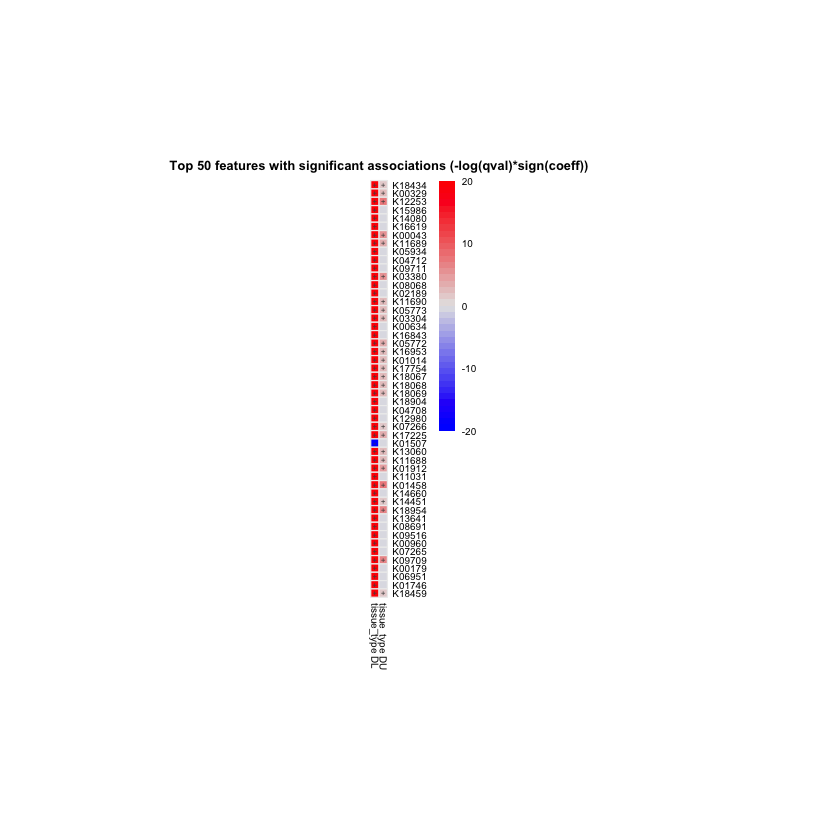

In [35]:
Maaslin2(
    input_data = otu_table(ps.coral_Ko), 
    input_metadata = ps.coral_meta,
     min_abundance = 0.05,
    min_prevalence = 0.1,
    analysis_method = "LM",
     transform = "LOG",
     cores=2,
     random_effects = "Study",
    #normalization = "TMM",
    output = "/Users/stephanie.rosales/Documents/Tissueloss/SCTLD_MetaAnalysis/out_picrust/output_Maslin_KO", 
    correction = "BH",
    fixed_effects = c("tissue_type"),
    reference = c("tissue_type,AH"))

In [21]:
sig_KO =read.csv("/Users/stephanie.rosales/Documents/Tissueloss/SCTLD_MetaAnalysis/out_picrust/output_Maslin_KO/significant_results.txt",
  check.names = FALSE,
                     
                        header = T, sep= "\t")
head(sig_KO, n=10)

,feature,metadata,value,coef,stderr,N,N.not.0,pval,qval,Pathway
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>
1,K00043,tissue_type,DU,0.24769908,0.08001763,1935,1500,1.992635e-03,5.554112e-03,K00043_4_hydroxybutyrate_dehydrogenase
2,K04712,tissue_type,DL,0.86285262,0.04856866,1935,1357,1.670000e-65,2.170000e-62,K04712_sphingolipid_4_desaturase/C4_monooxygenase
3,K05934,tissue_type,DL,0.48827885,0.02725844,1935,1925,1.670000e-66,2.410000e-63,K05934_precorrin_3B_C17_methyltransferase_/_cobalt_factor_III_methyltransferase
4,K11689,tissue_type,DU,0.08657851,0.03447973,1935,1926,1.212046e-02,2.715834e-02,K11689_C4_dicarboxylate_transporter
5,K12253,tissue_type,DL,0.78333755,0.04142321,1935,1750,2.780000e-73,1.210000e-69,K12253_5_guanidino_2_oxopentanoate_decarboxylase
6,K15986,tissue_type,DL,0.47682384,0.02579695,1935,1928,2.330000e-70,7.590000e-67,K15986_manganese_dependent inorganic pyrophosphatase
7,K16619,tissue_type,DL,0.97123679,0.05267860,1935,949,4.970000e-70,1.080000e-66,K16619_phospholipase_C_/_alpha_toxin
8,K18434,tissue_type,DU,0.10834560,0.06551642,1935,1571,9.834788e-02,1.694302e-01,K18434_type_IV_secretion_system_T_DNA_border_endonuclease
9,K18434,tissue_type,DL,0.91285744,0.04591549,1935,1571,3.870000e-80,5.040000e-76,NA


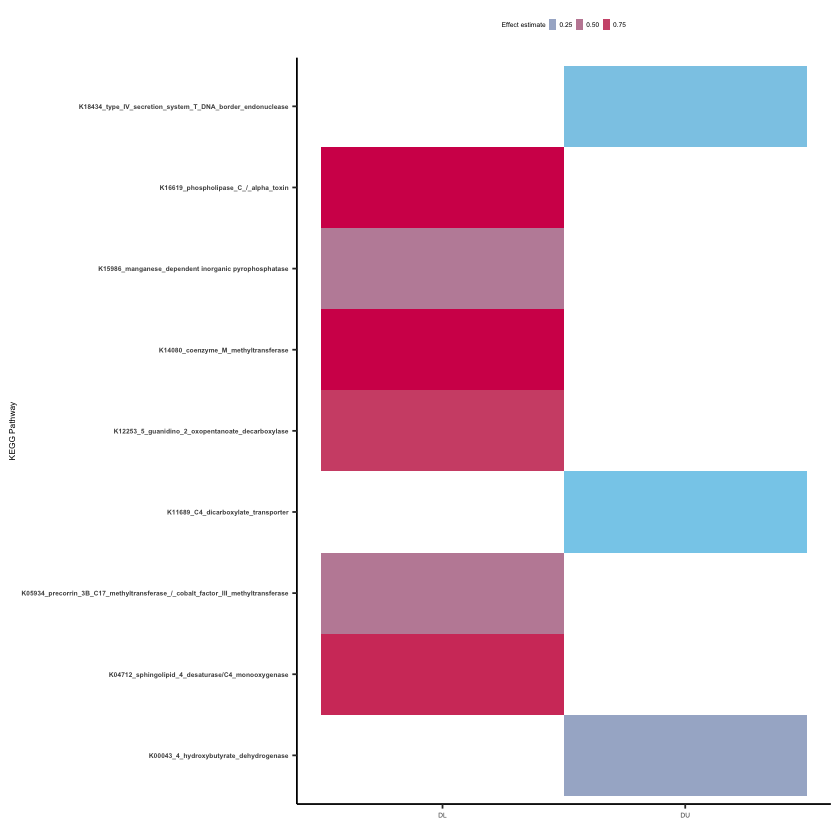

In [148]:
fig_sig_KO = sig_KO %>%
#filter(qval <0.00001) %>%
#filter(coef > .45 | coef < -.45) %>%
#filter(coef > .5 | coef < -.5) %>%
#arrange(desc(-qval)) %>% 
 # slice(1:10)%>% 
filter(Pathway!="NA") %>% 
ggplot( 
    aes(x = value, y = Pathway , fill = coef)) + 
    geom_tile() +

theme_classic() +
scale_fill_continuous(guide = guide_legend(keywidth = 0.30, keyheight = 0.50), low = "skyblue",
  high = "#D41159",

name = "Effect estimate") +
#guides(fill = guide_legend(keywidth = 0.30, keyheight = 0.50)) +
 #scale_fill_manual(ow = "blue", high = "red") +
theme(axis.title.x = element_text(size = 5)) +
theme(axis.title.y = element_text(size = 5)) +
theme(axis.text.y = element_text(size =4, face="bold")) +
theme(axis.text.x = element_text(size =4)) +
theme(legend.text =element_text(size=4)) +
theme(legend.title = element_text(size=4)) +
#theme(axis.text.x = element_text(angle = 90, hjust = 1, size=7)) +
xlab("") +
theme(legend.position="top") +
ylab("KEGG Pathway")
fig_sig_KO


In [19]:
sig_KO %>%
#filter(qval <0.00001) %>%
#filter(coef > .45 | coef < -.45) %>%
filter(coef > .5 | coef < -.5) %>%
arrange(desc(-qval)) %>% 
  slice(1:10)

ERROR: Error in filter(., coef > 0.5 | coef < -0.5): object 'sig_KO' not found


In [59]:
 sig_KO %>%
#filter(qval <0.00001) %>%
#filter(coef > .45 | coef < -.45) %>%
filter(coef > .1 | coef < -.1) %>%
arrange(desc(-qval)) %>% 
  slice(1:10) %>%
select(feature)

feature
<chr>
K18434
K00329
K12253
K15986
K14080
K16619
K00043
K11689
K05934


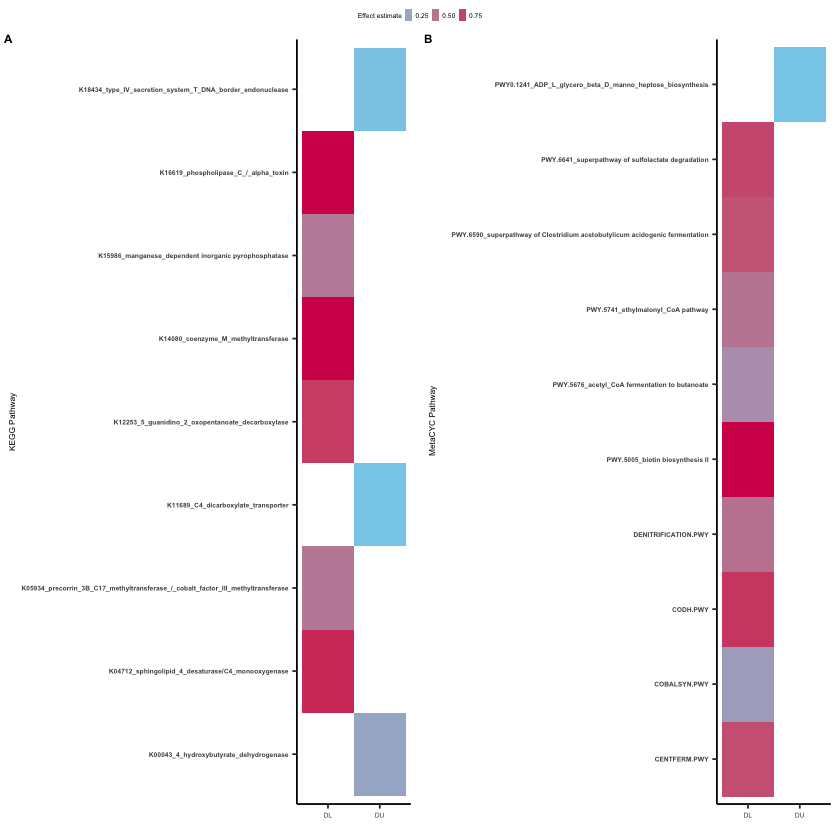

In [153]:
ggpubr::ggarrange(fig_sig_KO ,fig_sig, labels = c("A", "B"), nrow=1, common.legend = TRUE,
                  font.label = list(size = 7, color = "black"), widths = c(1, 1), align='hv')
ggsave("/Users/stephanie.rosales/Documents/Tissueloss/SCTLD_MetaAnalysis/figs/picrust_SCTLD_meta.png",
     width = 6, height = 4, units = "in", dpi=300)